# Wait Time Prediction Evaluation

## Analysis Overview:
 - **Validation Set**: 2023 data analysis
 - **Test Set**: 2024 data analysis  
 - **Prediction Modes**: Teacher Forcing vs Autoregressive (real conditions)
 - **Time Granularities**: Year, Month, Week, Day of Week, Hour
 - **Performance Metrics**: MAE, RMSE, R², sMAPE


In [1]:
!pip install --upgrade nbformat


In [2]:
import warnings
import logging
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from pathlib import Path
import sys
import os
from datetime import datetime
from typing import Dict, List, Optional, Tuple
import pickle

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")


%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100

import plotly.io as pio
pio.renderers.default = "notebook"

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)


from TCN.inference.predictor import WaitTimePredictor
from TCN.datasets.data_utils import preprocess_data, create_features
from TCN.models.baseline_model import GradientBoostingBaseline
from TCN.datasets.data_utils import preprocess_data, create_features, load_data_splits

print("Starting Comprehensive Model Evaluation")
print(f"Project root: {project_root}")


CONFIG = {
    'ride_name': 'arthur',  
    'model_dir': '../models/cached_scheduled_sampling',
    'data_path': '../data/processed/ep/rides_nonoperating_bucket',  
    'splits_dir': '../data/processed/bucket_splits',  
    'output_dir': '../TCN/results/evaluation'
}

Path(CONFIG['output_dir']).mkdir(parents=True, exist_ok=True)


if Path(CONFIG['data_path']).exists():
    available_rides = [f.stem for f in Path(CONFIG['data_path']).glob('*.parquet')]
    print(f"Available rides: {available_rides}")
else:
    print(f"Data directory {CONFIG['data_path']} does not exist")



Starting Comprehensive Model Evaluation
Project root: /home/maiko/Documents/HSLU/DSPRO2/HSLU.DSPRO2.Waitless
Available rides: ['volo_da_vinci', 'josefinas_magical_imperial_journey', 'alpine_express_enzian', 'poppy_towers', 'kolumbusjolle', 'eurotower', 'atlantica_supersplash', 'vindjammer', 'whale_adventures__northern_lights', 'arena_of_football__be_part_of_it', 'fjordrafting', 'madame_freudenreich_curiosits', 'swiss_bob_run', 'eurosat__cancan_coaster', 'jim_button__journey_through_morrowland', 'euromir', 'blue_fire_megacoaster', 'voltron_nevera_powered_by_rimac', 'tirol_log_flume', 'pegasus', 'dancing_dingie', 'poseidon', 'old_mac_donalds_tractor_fun', 'arthur', 'matterhornblitz', 'castello_dei_medici', 'voletarium', 'baaa_express', 'atlantis_adventure', 'vienna_wave_swing__glckspilz', 'silver_star']


In [3]:

EXPECTED_TRAINING_FEATURES = [
    'closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 
    'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 
    'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 
    'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled',
    'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 
    'season_fall', 'season_spring', 'season_summer', 'season_winter', 
    'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 
    'year_2022', 'year_2023', 'year_2024'
]



def load_data_splits(splits_dir: str, ride_name: str):
    """Load train/val/test split indices - same as training code"""
    print(f"Loading split indices from {splits_dir}")
    
    train_indices = pd.read_parquet(f"{splits_dir}/train_indices.parquet")
    val_indices = pd.read_parquet(f"{splits_dir}/validation_indices.parquet")
    test_indices = pd.read_parquet(f"{splits_dir}/test_indices.parquet")
    
    ride_name_normalized = ride_name.replace(' ', '_')
    train_idx = train_indices[train_indices['ride_name'] == ride_name_normalized]['original_index'].values
    val_idx = val_indices[val_indices['ride_name'] == ride_name_normalized]['original_index'].values
    test_idx = test_indices[test_indices['ride_name'] == ride_name_normalized]['original_index'].values
    
    if len(train_idx) == 0 or len(val_idx) == 0 or len(test_idx) == 0:
        raise ValueError(f"No indices found for ride {ride_name}")
    
    print(f" Data splits - Train: {len(train_idx)}, Validation: {len(val_idx)}, Test: {len(test_idx)}")
    return train_idx, val_idx, test_idx

def preprocess_data_for_evaluation(df: pd.DataFrame, ride_name: str) -> pd.DataFrame:
    """Preprocess data for evaluation - same as training preprocessing"""
    print(f" Preprocessing data for ride: {ride_name}")
    

    if 'time_bucket' in df.columns:
        df = df.drop(columns=['time_bucket'])

    ride_col = f'ride_name_{ride_name}'
    if ride_col in df.columns:
        df = df[df[ride_col] == 1].copy()
        print(f"   Filtered data for ride {ride_name}: {len(df)} samples")

        ride_cols = [col for col in df.columns if col.startswith('ride_name_')]
        df = df.drop(columns=ride_cols)

    df = df.fillna(0)
    
    return df

def create_features_for_evaluation(df: pd.DataFrame):
    """Create static feature columns - EXACTLY like training (data_utils.py)"""

    static_feature_cols = [col for col in df.columns 
                          if col not in ['wait_time', 'timestamp']]
    
    print(f"Static features: {len(static_feature_cols)} columns")
    print(f"feature columns: {static_feature_cols}")


    missing_features = [f for f in EXPECTED_TRAINING_FEATURES if f not in static_feature_cols]
    extra_features = [f for f in static_feature_cols if f not in EXPECTED_TRAINING_FEATURES]
    
    if missing_features:
        print(f"Missing training features: {missing_features}")
    if extra_features:
        print(f"Extra features not in training: {extra_features}")
        
    return df, static_feature_cols

def load_and_prepare_data(data_path: str, splits_dir: str, ride_name: str):
    """Load and prepare data following the EXACT same pattern as training"""
    print(f"Loading data following training pattern")
    
    ride_name_normalized = ride_name.replace(' ', '_').lower()
    ride_file = f"{ride_name_normalized}.parquet"
    full_data_path = Path(data_path) / ride_file
    
    if not full_data_path.exists():

        ride_file = f"{ride_name}.parquet"
        full_data_path = Path(data_path) / ride_file
        
        if not full_data_path.exists():
            raise FileNotFoundError(f"Could not find ride data file. Tried: {ride_name_normalized}.parquet and {ride_name}.parquet in {data_path}")
    
    print(f"Loading ride data from: {full_data_path}")
    

    df = pd.read_parquet(full_data_path)
    print(f"Raw data shape: {df.shape}")

    df = preprocess_data_for_evaluation(df, ride_name)

    train_indices, val_indices, test_indices = load_data_splits(splits_dir, ride_name)

    df, static_feature_cols = create_features_for_evaluation(df)

    train_df = df.iloc[train_indices].copy()
    val_df = df.iloc[val_indices].copy()
    test_df = df.iloc[test_indices].copy()
    
    print(f"Train data: {train_df.shape}")
    print(f"Validation data: {val_df.shape}")
    print(f"Test data: {test_df.shape}")

    for dataset_name, dataset in [('validation', val_df), ('test', test_df)]:
        dataset['timestamp'] = pd.to_datetime(dataset['timestamp'])
        
        dataset['analysis_year'] = dataset['timestamp'].dt.year
        dataset['analysis_month'] = dataset['timestamp'].dt.month
        dataset['analysis_week'] = dataset['timestamp'].dt.isocalendar().week
        dataset['analysis_day_name'] = dataset['timestamp'].dt.day_name()
        dataset['analysis_hour'] = dataset['timestamp'].dt.hour
        dataset['analysis_date'] = dataset['timestamp'].dt.date

        operational_mask = (dataset['analysis_hour'] >= 11) & (dataset['analysis_hour'] <= 17)
        print(f"{dataset_name.capitalize()} operational hours: {operational_mask.sum()} / {len(dataset)} samples")

    return train_df, val_df, test_df



In [4]:

def load_and_preprocess_data(data_path: str, splits_output_dir: str, target_ride: str) -> dict:
    """
    Load and preprocess data using the exact same logic as training
    
    Args:
        data_path: Path to the main data file
        splits_output_dir: Directory containing train/val/test split indices
        target_ride: Name of the target ride
    
    Returns:
        Dictionary with preprocessed data splits
    """

    df = pd.read_parquet(data_path)
    logger.info(f"Loaded raw data: {len(df)} samples")
    

    df = preprocess_data(df, target_ride)
    logger.info(f"After preprocessing: {len(df)} samples")

    train_indices, val_indices, test_indices = load_data_splits(
        splits_output_dir, target_ride
    )
    
    df, static_feature_cols = create_features(df)
    
    train_df = df.iloc[train_indices].copy()
    val_df = df.iloc[val_indices].copy()
    test_df = df.iloc[test_indices].copy()
    
    logger.info(f"Data splits - Train: {len(train_df)}, Val: {len(val_df)}, Test: {len(test_df)}")
    
    return {
        'train_df': train_df,
        'val_df': val_df,
        'test_df': test_df,
        'static_feature_cols': static_feature_cols,
        'train_indices': train_indices,
        'val_indices': val_indices,
        'test_indices': test_indices
    }

def main():
    print("Wait Time Prediction - Simple MAE Evaluation")
    print("=" * 50)

    TARGET_RIDE = "arthur"
    MODEL_DIR = "../models/cached_scheduled_sampling"
    DATA_PATH = "../data/processed/ep/rides_nonoperating_bucket/arthur.parquet"
    SPLITS_OUTPUT_DIR = "../data/processed/bucket_splits" 
    
    try:
        print(f"📊 Initializing predictor for '{TARGET_RIDE}'...")
        predictor = WaitTimePredictor(
            ride_name=TARGET_RIDE,
            model_dir=MODEL_DIR,
            device='cuda'
        )
        
        print(f"📈 Loading and preprocessing data...")
        data = load_and_preprocess_data(DATA_PATH, SPLITS_OUTPUT_DIR, TARGET_RIDE)
        
        print("🔮 Making predictions on test set...")
        
        test_predictions_teacher = predictor.predict_batch(
            data['test_df'].copy(), 
            use_autoregressive=False
        )
        
        test_predictions_auto = predictor.predict_batch(
            data['test_df'].copy(), 
            use_autoregressive=True
        )
        
        print("\n📊 Test Set Results:")
        print("=" * 30)
        

        metrics_auto = predictor.evaluate_predictions(test_predictions_auto)
        print(f"Autoregressive MAE:  {metrics_auto['mae']:.2f} minutes")
        
        print("\n📊 Validation Set Results:")
        print("=" * 30)
        
        val_predictions_teacher = predictor.predict_batch(
            data['val_df'].copy(), 
            use_autoregressive=False
        )
        val_predictions_auto = predictor.predict_batch(
            data['val_df'].copy(), 
            use_autoregressive=True
        )
        
        val_metrics_teacher = predictor.evaluate_predictions(val_predictions_teacher)
        val_metrics_auto = predictor.evaluate_predictions(val_predictions_auto)
        val_mae_gap = val_metrics_auto['mae'] - val_metrics_teacher['mae']
        
        print(f"Teacher Forcing MAE: {val_metrics_teacher['mae']:.2f} minutes")
        print(f"Autoregressive MAE:  {val_metrics_auto['mae']:.2f} minutes")
        print(f"Performance Gap:     {val_mae_gap:+.2f} minutes")
        print(f"Val Samples:         {val_metrics_teacher['n_samples']}")
        
        print("\n✅ Inference completed successfully!")
        
    except FileNotFoundError as e:
        print(f"❌ Files not found: {e}")
        print("   Please check these paths:")
        print(f"   - Data: {DATA_PATH}")
        print(f"   - Models: {MODEL_DIR}")
        print(f"   - Splits: {SPLITS_OUTPUT_DIR}")
        
    except ValueError as e:
        print(f"❌ Data processing error: {e}")
        
    except Exception as e:
        print(f"❌ Error during inference: {e}")
        import traceback
        traceback.print_exc()

if __name__ == "__main__":
    main()

Wait Time Prediction - Simple MAE Evaluation
📊 Initializing predictor for 'arthur'...


INFO:TCN.inference.predictor:Loading model configuration:
INFO:TCN.inference.predictor:  Config keys: ['epochs', 'patience', 'seed', 'use_wandb', 'base_data_dir', 'model_output_dir', 'splits_output_dir', 'data_path', 'target_ride', 'seq_length', 'batch_size', 'num_channels', 'kernel_size', 'num_layers', 'dropout', 'learning_rate', 'weight_decay', 'opening_hour', 'closing_hour', 'gb_n_estimators', 'gb_learning_rate', 'gb_max_depth', 'gb_min_samples_split', 'gb_min_samples_leaf', 'sampling_strategy', 'noise_factor', 'cache_update_frequency', 'max_cache_size', 'use_torch_compile', 'use_mixed_precision', 'run_name', 'static_features_size']
INFO:TCN.inference.predictor:  Original config: {'epochs': 100, 'patience': 80, 'seed': 42, 'use_wandb': True, 'base_data_dir': 'data/processed/ep/rides_nonoperating_bucket', 'model_output_dir': 'models', 'splits_output_dir': 'data/processed/bucket_splits', 'data_path': 'data/processed/ep/rides_nonoperating_bucket/arthur.parquet', 'target_ride': 'arthur'

📈 Loading and preprocessing data...
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22109, Validation: 4244, Test: 3744
🔮 Making predictions on test set...


INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11
INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 12:00): Same-day predictions: 4.2%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3744
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!



📊 Test Set Results:
Autoregressive MAE:  8.04 minutes

📊 Validation Set Results:


INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11
INFO:TCN.inference.predictor:   📊 Index 2000 (2023-08-04 10:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:   📊 Index 4000 (2023-12-11 15:00): Same-day predictions: 16.7%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 4244
INFO:TCN.inference.predictor:   📅 Days with predictions: 269
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!


Teacher Forcing MAE: 6.18 minutes
Autoregressive MAE:  8.69 minutes
Performance Gap:     +2.51 minutes
Val Samples:         4184

✅ Inference completed successfully!


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from pathlib import Path
import logging
import pickle
from typing import Dict, List, Optional, Tuple
import warnings
warnings.filterwarnings('ignore')

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

class ModelEvaluator:
    """
    A class to handle model evaluation with caching for Jupyter notebook usage.
    Run predictions once, then create multiple visualizations without re-running models.
    """
    
    def __init__(self, config: dict, ride_names: List[str]):
        self.config = config
        self.ride_names = ride_names
        self.results_cache = {}
        self.predictions_cache = {}
        self.summary_df = None
        
        # Extract config
        self.splits_dir = config['splits_dir']
        self.data_path = config['data_path']
        self.tcn_models_dir = config['model_dir']
    
    def calculate_smape(self, y_true, y_pred):
        """
        Calculate sMAPE exactly as shown in the image
        """
        actual_values = np.asarray(y_true)
        predictions = np.asarray(y_pred)
        
        # Only include points where actual values are non-zero
        non_zero_mask = (actual_values > 0) & (predictions > 0)
        
        if non_zero_mask.sum() == 0:
            return np.nan
        
        abs_pct_errors = np.abs(actual_values - predictions) / (np.abs(actual_values) + np.abs(predictions))
        smape = np.mean(abs_pct_errors[non_zero_mask]) * 100
        
        return smape
        
    def load_and_preprocess_data(self, data_path: str, splits_output_dir: str, target_ride: str) -> dict:
        """Load and preprocess data using clean preprocessing logic"""
        if Path(data_path).is_dir():
            ride_name_normalized = target_ride.replace(' ', '_').lower()
            ride_file = f"{ride_name_normalized}.parquet"
            full_data_path = Path(data_path) / ride_file
            if not full_data_path.exists():
                ride_file = f"{target_ride}.parquet"
                full_data_path = Path(data_path) / ride_file
        else:
            full_data_path = Path(data_path)
        
        if not full_data_path.exists():
            raise FileNotFoundError(f"Data file not found: {full_data_path}")
        
        df = pd.read_parquet(full_data_path)
        logger.info(f"Loaded raw data for {target_ride}: {len(df)} samples")
        
        # Note: You'll need to implement these functions or import them
        df = preprocess_data(df, target_ride)
        logger.info(f"After preprocessing: {len(df)} samples")
        
        train_indices, val_indices, test_indices = load_data_splits(
            splits_output_dir, target_ride
        )
        
        df, static_feature_cols = create_features(df)
        
        train_df = df.iloc[train_indices].copy()
        val_df = df.iloc[val_indices].copy()
        test_df = df.iloc[test_indices].copy()
        
        for split_df in [train_df, val_df, test_df]:
            if 'timestamp' in split_df.columns:
                split_df['timestamp'] = pd.to_datetime(split_df['timestamp'])
        
        logger.info(f"Data splits - Train: {len(train_df)}, Val: {len(val_df)}, Test: {len(test_df)}")
        
        return {
            'train_df': train_df,
            'val_df': val_df,
            'test_df': test_df,
            'static_feature_cols': static_feature_cols,
            'train_indices': train_indices,
            'val_indices': val_indices,
            'test_indices': test_indices
        }

    def evaluate_single_ride(self, ride_name: str) -> Optional[Dict]:
        """Evaluate both models on a single ride and cache results"""
        
        if ride_name in self.results_cache:
            print(f"Using cached results for {ride_name}")
            return self.results_cache[ride_name]
            
        print(f"\n--- Evaluating {ride_name} ---")
        
        try:
            data = self.load_and_preprocess_data(self.data_path, self.splits_dir, ride_name)
            train_df = data['train_df']
            val_df = data['val_df']
            test_df = data['test_df']
            static_feature_cols = data['static_feature_cols']
            
            print(f"Using features: {static_feature_cols}")
            
            ride_name_normalized = ride_name.replace(' ', '_')
            model_dir = Path("../models/cached_scheduled_sampling")
            gb_path = model_dir / f"{ride_name_normalized}_gb_baseline.pkl"
            
            try:
                with open(gb_path, "rb") as f:
                    baseline = pickle.load(f)
                print("Successfully loaded baseline model from file")
            except FileNotFoundError:
                print(f"Baseline model file not found at {gb_path}")
                raise
            
            # Evaluate baseline
            baseline_val_metrics, baseline_val_pred = self._eval_baseline(
                baseline, val_df, static_feature_cols, "Validation"
            )
            baseline_test_metrics, baseline_test_pred = self._eval_baseline(
                baseline, test_df, static_feature_cols, "Test"
            )
            
            # Evaluate TCN
            print("Loading and evaluating TCN model...")
            predictor = WaitTimePredictor(ride_name, self.tcn_models_dir)
            
            tcn_val_metrics, tcn_val_pred = self._eval_tcn(predictor, val_df, "Validation")
            tcn_test_metrics, tcn_test_pred = self._eval_tcn(predictor, test_df, "Test")
            
            # Calculate improvements
            val_improvement = (baseline_val_metrics['mae'] - tcn_val_metrics['mae']) / baseline_val_metrics['mae'] * 100
            test_improvement = (baseline_test_metrics['mae'] - tcn_test_metrics['mae']) / baseline_test_metrics['mae'] * 100
            
            print(f"MAE Improvement - Val: {val_improvement:.2f}%, Test: {test_improvement:.2f}%")
            
            # Store results with sMAPE values
            result = {
                'ride_name': ride_name,
                'baseline_val_mae': baseline_val_metrics['mae'],
                'baseline_val_rmse': baseline_val_metrics['rmse'],
                'baseline_val_smape': baseline_val_metrics['smape'],
                'tcn_val_mae': tcn_val_metrics['mae'],
                'tcn_val_rmse': tcn_val_metrics['rmse'],
                'tcn_val_smape': tcn_val_metrics['smape'],
                'baseline_test_mae': baseline_test_metrics['mae'],
                'baseline_test_rmse': baseline_test_metrics['rmse'],
                'baseline_test_smape': baseline_test_metrics['smape'],
                'tcn_test_mae': tcn_test_metrics['mae'],
                'tcn_test_rmse': tcn_test_metrics['rmse'],
                'tcn_test_smape': tcn_test_metrics['smape'],
                'val_improvement': val_improvement,
                'test_improvement': test_improvement,
                'val_samples': tcn_val_metrics['n_samples'],
                'test_samples': tcn_test_metrics['n_samples']
            }
            
            # Cache predictions for detailed analysis
            self.predictions_cache[ride_name] = {
                'val_data': {
                    'y_true': tcn_val_pred['y_true'],
                    'baseline_pred': baseline_val_pred['y_pred'],
                    'tcn_pred': tcn_val_pred['y_pred'],
                    'mask': tcn_val_pred['mask'],
                    'df': val_df
                },
                'test_data': {
                    'y_true': tcn_test_pred['y_true'],
                    'baseline_pred': baseline_test_pred['y_pred'],
                    'tcn_pred': tcn_test_pred['y_pred'],
                    'mask': tcn_test_pred['mask'],
                    'df': test_df
                }
            }
            
            self.results_cache[ride_name] = result
            return result
            
        except Exception as e:
            print(f"Error evaluating {ride_name}: {e}")
            import traceback
            traceback.print_exc()
            return None

    def _eval_baseline(self, baseline, data_df, static_feature_cols, name):
        """Evaluate baseline model and return metrics + predictions"""
        X = data_df[static_feature_cols].values
        y_true = data_df['wait_time'].values
        y_pred = baseline.predict(X)
        
        mask = self._create_filter_mask(data_df, name)
        
        y_true_filtered = y_true[mask]
        y_pred_filtered = y_pred[mask]
        
        mae = mean_absolute_error(y_true_filtered, y_pred_filtered)
        rmse = np.sqrt(mean_squared_error(y_true_filtered, y_pred_filtered))
        smape = self.calculate_smape(y_true_filtered, y_pred_filtered)
        
        print(f"Baseline {name}: MAE={mae:.4f}, RMSE={rmse:.4f}, sMAPE={smape:.4f} (n={len(y_true_filtered)})")
        
        return (
            {'mae': mae, 'rmse': rmse, 'smape': smape, 'n_samples': len(y_true_filtered)},
            {'y_true': y_true, 'y_pred': y_pred, 'mask': mask}
        )
    
    def _eval_tcn(self, predictor, data_df, name):
        """Evaluate TCN model and return metrics + predictions"""
        predictions_df = predictor.predict_batch(data_df.copy(), use_autoregressive=True)
        
        # Find prediction column
        prediction_col = 'wait_time_prediction'
        if prediction_col not in predictions_df.columns:
            for alt_col in ['prediction', 'predictions', 'predicted_wait_time', 'wait_time_pred', 'y_pred']:
                if alt_col in predictions_df.columns:
                    prediction_col = alt_col
                    print(f"Using column '{prediction_col}' as predictions")
                    break
            else:
                raise ValueError(f"Could not identify prediction column. Available: {list(predictions_df.columns)}")
        
        mask = self._create_filter_mask(predictions_df, f"TCN {name}")
        
        filtered_df = predictions_df[mask]
        y_true = filtered_df['wait_time'].values
        y_pred = filtered_df[prediction_col].values
        
        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        smape = self.calculate_smape(y_true, y_pred)
        
        print(f"TCN {name}: MAE={mae:.4f}, RMSE={rmse:.4f}, sMAPE={smape:.4f} (n={len(y_true)})")
        
        return (
            {'mae': mae, 'rmse': rmse, 'smape': smape, 'n_samples': len(y_true)},
            {'y_true': predictions_df['wait_time'].values, 'y_pred': predictions_df[prediction_col].values, 'mask': mask}
        )
    
    def _create_filter_mask(self, data_df, name):
        """Create filtering mask for evaluation"""
        mask = pd.Series([True] * len(data_df), index=data_df.index)
        
        # Hour filtering
        if 'analysis_hour' in data_df.columns:
            mask = mask & (data_df['analysis_hour'] >= 11) & (data_df['analysis_hour'] <= 17)
        elif 'timestamp' in data_df.columns:
            hour = pd.to_datetime(data_df['timestamp']).dt.hour
            mask = mask & (hour >= 11) & (hour <= 17)
            print(f"Using timestamp to extract hour for {name} filtering")
        else:
            print(f"Warning: No hour column found for {name}, using all data")
        
        # Closed filtering
        if 'closed' in data_df.columns:
            mask = mask & (data_df['closed'] == 0)
            
        return mask
    
    def run_all_evaluations(self) -> pd.DataFrame:
        """Run evaluations for all rides and return summary DataFrame"""
        print("="*60)
        print("MULTI-RIDE MODEL COMPARISON")
        print("="*60)
        
        results = []
        failed_rides = []
        
        for ride_name in self.ride_names:
            print(f"Processing {ride_name}...")
            result = self.evaluate_single_ride(ride_name)
            
            if result is not None:
                results.append(result)
                print(f"Successfully evaluated {ride_name}")
            else:
                failed_rides.append(ride_name)
                print(f"Failed to evaluate {ride_name}")
        
        if not results:
            print("No results to analyze - all rides failed!")
            return pd.DataFrame()
        
        self.summary_df = pd.DataFrame(results)
        
        print(f"\n{'='*60}")
        print("DETAILED RESULTS")
        print(f"{'='*60}")
        print(self.summary_df.round(4))
        
        if failed_rides:
            print(f"\nFailed to evaluate: {', '.join(failed_rides)}")
        
        print(f"\nEvaluation completed successfully for {len(results)}/{len(self.ride_names)} rides!")
        
        return self.summary_df

In [34]:
class ModelVisualizer:
    """
    Comprehensive visualization class that works with cached results from ModelEvaluator
    """
    
    def __init__(self, evaluator):
        self.evaluator = evaluator
        self.summary_df = evaluator.summary_df
        self.predictions_cache = evaluator.predictions_cache
        
    def plot_mae_by_ride(self, dataset='test', model='baseline', figsize=(12, 10)):
        """
        Create horizontal bar chart showing MAE scores by ride, sorted from highest to lowest
        
        Parameters:
        -----------
        dataset : str, default 'test'
            Which dataset to plot ('test' or 'val')
        model : str, default 'baseline' 
            Which model to plot ('baseline' or 'tcn')
        figsize : tuple, default (12, 10)
            Figure size (width, height)
        """
        if self.summary_df is None or self.summary_df.empty:
            print("No data to plot! Run evaluations first.")
            return
        
        # Select the appropriate column based on dataset and model
        col_map = {
            ('test', 'baseline'): 'baseline_test_mae',
            ('test', 'tcn'): 'tcn_test_mae',
            ('val', 'baseline'): 'baseline_val_mae',
            ('val', 'tcn'): 'tcn_val_mae'
        }
        
        if (dataset, model) not in col_map:
            print(f"Invalid combination: dataset='{dataset}', model='{model}'")
            print("Valid options: dataset=['test', 'val'], model=['baseline', 'tcn']")
            return
        
        mae_col = col_map[(dataset, model)]
        
        # Sort by MAE (highest to lowest for display)
        plot_data = self.summary_df.sort_values(mae_col, ascending=True)  # ascending=True for horizontal bars
        
        # Create the plot
        fig, ax = plt.subplots(figsize=figsize)
        
        # Create horizontal bar chart using ride names for y-axis
        y_positions = range(len(plot_data))
        bars = ax.barh(y_positions, plot_data[mae_col], color='steelblue', alpha=0.7)
        
        # Set y-tick labels to ride names
        ax.set_yticks(y_positions)
        ax.set_yticklabels(plot_data['ride_name'])
        
        # Add value labels on the bars
        for i, mae_value in enumerate(plot_data[mae_col]):
            ax.text(mae_value + 0.1, i, f'{mae_value:.1f}', 
                    va='center', ha='left', fontsize=10)
        
        # Formatting
        dataset_title = dataset.title()
        model_title = model.title()
        ax.set_xlabel('Mean Absolute Error (MAE) - Minutes')
        ax.set_ylabel('Rides')
        ax.set_title(f'{model_title} {dataset_title}\nMAE Scores by Ride ({dataset_title} Set)')
        
        # Add grid for easier reading
        ax.grid(axis='x', alpha=0.3)
        
        # Adjust layout to prevent label cutoff
        plt.tight_layout()
        plt.show()

        
    def plot_mae_comparison(self, figsize=(10, 8)):
        """Create separate comparison plots showing MAE difference between models"""
        if self.summary_df is None or self.summary_df.empty:
            print("No data to plot! Run evaluations first.")
            return
        
        # Calculate differences (Baseline - TCN)
        summary_val = self.summary_df.copy()
        summary_test = self.summary_df.copy()
        
        summary_val['val_diff'] = summary_val['baseline_val_mae'] - summary_val['tcn_val_mae']
        summary_test['test_diff'] = summary_test['baseline_test_mae'] - summary_test['tcn_test_mae']
        
        # Sort by difference
        summary_val = summary_val.sort_values('val_diff', ascending=False)
        summary_test = summary_test.sort_values('test_diff', ascending=False)
        
        # Plot 1: Validation Set
        fig1, ax1 = plt.subplots(figsize=figsize)
        self._plot_mae_bars(ax1, summary_val, 'val_diff', 'Validation Set: MAE Improvement\n(Positive = TCN Better)')
        
        # Enhanced formatting for plot 1
        ax1.set_title('Validation Set: MAE Improvement\n(Positive = TCN Better)', fontsize=16, fontweight='bold')
        ax1.tick_params(axis='both', which='major', labelsize=12)
        
        plt.tight_layout()
        plt.show()
        
        # Plot 2: Test Set
        fig2, ax2 = plt.subplots(figsize=figsize)
        self._plot_mae_bars(ax2, summary_test, 'test_diff', 'Test Set: MAE Improvement\n(Positive = TCN Better)')
        
        # Enhanced formatting for plot 2
        ax2.set_title('Test Set: MAE Improvement\n(Positive = TCN Better)', fontsize=16, fontweight='bold')
        ax2.tick_params(axis='both', which='major', labelsize=12)
        
        plt.tight_layout()
        plt.show()
        
        # Plot 3: Overall comparison
        fig3, ax3 = plt.subplots(figsize=(8, 6))
        self._plot_overall_mae_comparison(ax3, summary_val, summary_test)
        
        # Enhanced formatting for plot 3
        ax3.set_title('Overall MAE Comparison', fontsize=16, fontweight='bold')
        ax3.tick_params(axis='both', which='major', labelsize=12)
        
        plt.tight_layout()
        plt.show()

    def _plot_overall_mae_comparison(self, ax, summary_val, summary_test):
        """Create overall MAE comparison across all rides and print RMSE and sMAPE metrics"""
        
        # Calculate overall MAE by averaging across all rides
        overall_baseline_val = summary_val['baseline_val_mae'].mean()
        overall_tcn_val = summary_val['tcn_val_mae'].mean()
        overall_baseline_test = summary_test['baseline_test_mae'].mean()
        overall_tcn_test = summary_test['tcn_test_mae'].mean()
        
        # Calculate overall RMSE (assuming columns exist)
        overall_baseline_val_rmse = summary_val['baseline_val_rmse'].mean() if 'baseline_val_rmse' in summary_val.columns else None
        overall_tcn_val_rmse = summary_val['tcn_val_rmse'].mean() if 'tcn_val_rmse' in summary_val.columns else None
        overall_baseline_test_rmse = summary_test['baseline_test_rmse'].mean() if 'baseline_test_rmse' in summary_test.columns else None
        overall_tcn_test_rmse = summary_test['tcn_test_rmse'].mean() if 'tcn_test_rmse' in summary_test.columns else None
        
        # Calculate overall sMAPE (assuming columns exist)
        overall_baseline_val_smape = summary_val['baseline_val_smape'].mean() if 'baseline_val_smape' in summary_val.columns else None
        overall_tcn_val_smape = summary_val['tcn_val_smape'].mean() if 'tcn_val_smape' in summary_val.columns else None
        overall_baseline_test_smape = summary_test['baseline_test_smape'].mean() if 'baseline_test_smape' in summary_test.columns else None
        overall_tcn_test_smape = summary_test['tcn_test_smape'].mean() if 'tcn_test_smape' in summary_test.columns else None
        
        categories = ['Validation', 'Test']
        baseline_values = [overall_baseline_val, overall_baseline_test]
        tcn_values = [overall_tcn_val, overall_tcn_test]
        
        x = np.arange(len(categories))
        width = 0.35
        
        # Create grouped bar chart
        bars1 = ax.bar(x - width/2, baseline_values, width, label='Gradient Boosting', color='red', alpha=0.7)
        bars2 = ax.bar(x + width/2, tcn_values, width, label='TCN', color='blue', alpha=0.7)
        
        # Add value labels on bars
        for bar in bars1:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=10)
        
        for bar in bars2:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=10)
        
        # Calculate improvement percentages
        val_improvement = ((overall_baseline_val - overall_tcn_val) / overall_baseline_val) * 100
        test_improvement = ((overall_baseline_test - overall_tcn_test) / overall_baseline_test) * 100
        
        ax.set_xlabel('Dataset')
        ax.set_ylabel('Mean Absolute Error')
        ax.set_title(f'Overall MAE Comparison Across All Rides\n'
                    f'Val Improvement: {val_improvement:.1f}%, Test Improvement: {test_improvement:.1f}%')
        ax.set_xticks(x)
        ax.set_xticklabels(categories)
        ax.legend()
        ax.grid(True, alpha=0.3)
        
        # Print detailed metrics
        print("\n" + "="*60)
        print("OVERALL PERFORMANCE METRICS SUMMARY")
        print("="*60)
        
        print(f"\n{'VALIDATION SET':^30}")
        print("-" * 30)
        print(f"MAE  - Gradient Boosting: {overall_baseline_val:.4f}, TCN: {overall_tcn_val:.4f}")
        if overall_baseline_val_rmse is not None and overall_tcn_val_rmse is not None:
            print(f"RMSE - Gradient Boosting: {overall_baseline_val_rmse:.4f}, TCN: {overall_tcn_val_rmse:.4f}")
        if overall_baseline_val_smape is not None and overall_tcn_val_smape is not None:
            print(f"sMAPE- Gradient Boosting: {overall_baseline_val_smape:.4f}, TCN: {overall_tcn_val_smape:.4f}")
        
        print(f"\n{'TEST SET':^30}")
        print("-" * 30)
        print(f"MAE  - Gradient Boosting: {overall_baseline_test:.4f}, TCN: {overall_tcn_test:.4f}")
        if overall_baseline_test_rmse is not None and overall_tcn_test_rmse is not None:
            print(f"RMSE - Gradient Boosting: {overall_baseline_test_rmse:.4f}, TCN: {overall_tcn_test_rmse:.4f}")
        if overall_baseline_test_smape is not None and overall_tcn_test_smape is not None:
            print(f"sMAPE- Gradient Boosting: {overall_baseline_test_smape:.4f}, TCN: {overall_tcn_test_smape:.4f}")
        
        print(f"\n{'IMPROVEMENTS (%)':^30}")
        print("-" * 30)
        print(f"MAE  - Val: {val_improvement:+.2f}%, Test: {test_improvement:+.2f}%")
        
        if overall_baseline_val_rmse is not None and overall_tcn_val_rmse is not None:
            val_rmse_improvement = ((overall_baseline_val_rmse - overall_tcn_val_rmse) / overall_baseline_val_rmse) * 100
            test_rmse_improvement = ((overall_baseline_test_rmse - overall_tcn_test_rmse) / overall_baseline_test_rmse) * 100
            print(f"RMSE - Val: {val_rmse_improvement:+.2f}%, Test: {test_rmse_improvement:+.2f}%")
        
        if overall_baseline_val_smape is not None and overall_tcn_val_smape is not None:
            val_smape_improvement = ((overall_baseline_val_smape - overall_tcn_val_smape) / overall_baseline_val_smape) * 100
            test_smape_improvement = ((overall_baseline_test_smape - overall_tcn_test_smape) / overall_baseline_test_smape) * 100
            print(f"sMAPE- Val: {val_smape_improvement:+.2f}%, Test: {test_smape_improvement:+.2f}%")
        
        print("="*60)
    
    def _plot_mae_bars(self, ax, data, diff_col, title):
        """Helper function to plot MAE comparison bars"""
        x_pos = np.arange(len(data))
        colors = ['lightgreen' if diff > 0 else 'lightcoral' for diff in data[diff_col]]
        
        bars = ax.bar(x_pos, data[diff_col], color=colors, alpha=0.8, edgecolor='black', linewidth=0.5)

        for i, diff in enumerate(data[diff_col]):
            y_pos = diff + 0.02 * max(abs(data[diff_col])) if diff >= 0 else diff - 0.02 * max(abs(data[diff_col]))
            va = 'bottom' if diff >= 0 else 'top'
            ax.text(i, y_pos, f'{diff:.1f}', ha='center', va=va, fontsize=8)
        
        ax.axhline(y=0, color='black', linestyle='-', linewidth=0.8)
        ax.set_xlabel('Rides')
        ax.set_ylabel('MAE Difference (Gradient Boosting - TCN)', fontsize=14)
        ax.set_title(title)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(data['ride_name'], rotation=45, ha='right')
        ax.grid(True, alpha=0.3)
        
        # Adjust y-axis
        max_abs = max(abs(data[diff_col])) * 1.2
        ax.set_ylim(-max_abs, max_abs)
    
    def plot_scatter_comparison(self, figsize=(10, 8)):
        """Create separate scatter plots comparing baseline vs TCN predictions"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Individual ride plots
        for ride_name, pred_data in self.predictions_cache.items():
            fig, ax = plt.subplots(figsize=figsize)
            
            # Use test data for scatter plot
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            # Scatter plot
            ax.scatter(y_true, baseline_pred, alpha=0.6, color='red', s=20, label='Gradient Boosting')
            ax.scatter(y_true, tcn_pred, alpha=0.6, color='blue', s=20, label='TCN')
            
            # Perfect prediction line
            min_val = min(y_true.min(), baseline_pred.min(), tcn_pred.min())
            max_val = max(y_true.max(), baseline_pred.max(), tcn_pred.max())
            ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, linewidth=1)
            
            ax.set_xlabel('True Wait Time', fontsize=18)
            ax.set_ylabel('Predicted Wait Time', fontsize=18)
            ax.set_title(f'{ride_name} - Test Set Predictions', fontsize=20)
            ax.legend()
            ax.grid(True, alpha=0.3)
            
            plt.tight_layout()
            plt.show()
        
        # Combined plot for all rides
        fig, ax = plt.subplots(figsize=figsize)
        
        # Collect all data points from all rides
        all_y_true = []
        all_baseline_pred = []
        all_tcn_pred = []
        
        for ride_name, pred_data in self.predictions_cache.items():
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            all_y_true.extend(test_data['y_true'][mask])
            all_baseline_pred.extend(test_data['baseline_pred'][mask])
            all_tcn_pred.extend(test_data['tcn_pred'][mask])
        
        # Convert to numpy arrays for easier handling
        all_y_true = np.array(all_y_true)
        all_baseline_pred = np.array(all_baseline_pred)
        all_tcn_pred = np.array(all_tcn_pred)
        
        # Combined scatter plot
        ax.scatter(all_y_true, all_baseline_pred, alpha=0.6, color='red', s=20, label='Gradient Boosting')
        ax.scatter(all_y_true, all_tcn_pred, alpha=0.6, color='blue', s=20, label='TCN')
        
        # Perfect prediction line
        min_val = min(all_y_true.min(), all_baseline_pred.min(), all_tcn_pred.min())
        max_val = max(all_y_true.max(), all_baseline_pred.max(), all_tcn_pred.max())
        ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, linewidth=1)
        
        ax.set_xlabel('True Wait Time')
        ax.set_ylabel('Predicted Wait Time')
        ax.set_title('All Rides Combined - Test Set Predictions')
        ax.legend()
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    def plot_error_distribution(self, figsize=(10, 6)):
        """Plot separate error distribution plots for each ride plus overall combined plot"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Collect all errors for overall plot
        all_baseline_errors = []
        all_tcn_errors = []
        
        # Individual ride plots
        for ride_name, pred_data in self.predictions_cache.items():
            fig, ax = plt.subplots(figsize=figsize)
            
            # Use test data
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            baseline_errors = baseline_pred - y_true
            tcn_errors = tcn_pred - y_true
            
            # Store for overall plot
            all_baseline_errors.extend(baseline_errors)
            all_tcn_errors.extend(tcn_errors)
            
            # Calculate percentiles for both models
            baseline_10th = np.percentile(baseline_errors, 10)
            baseline_90th = np.percentile(baseline_errors, 90)
            tcn_10th = np.percentile(tcn_errors, 10)
            tcn_90th = np.percentile(tcn_errors, 90)
            
            # Plot histograms for individual ride
            ax.hist(baseline_errors, bins=30, alpha=0.6, color='red', label='Gradient Boosting', density=True)
            ax.hist(tcn_errors, bins=30, alpha=0.6, color='blue', label='TCN', density=True)
            
            # Add percentile lines
            ax.axvline(baseline_10th, color='red', linestyle=':', alpha=0.8, linewidth=2, label=f'Gradient Boosting 10th: {baseline_10th:.2f}')
            ax.axvline(baseline_90th, color='red', linestyle=':', alpha=0.8, linewidth=2, label=f'Gradient Boosting 90th: {baseline_90th:.2f}')
            ax.axvline(tcn_10th, color='blue', linestyle=':', alpha=0.8, linewidth=2, label=f'TCN 10th: {tcn_10th:.2f}')
            ax.axvline(tcn_90th, color='blue', linestyle=':', alpha=0.8, linewidth=2, label=f'TCN 90th: {tcn_90th:.2f}')
            
            ax.axvline(0, color='black', linestyle='--', alpha=0.8)
            ax.set_xlabel('Prediction Error (Predicted - True)', fontsize=16)
            ax.set_ylabel('Density', fontsize=16)
            ax.set_title(f'{ride_name} - Error Distribution with 10th/90th Percentiles', fontsize=18, fontweight='bold')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
            ax.grid(True, alpha=0.3)
            ax.tick_params(axis='both', which='major', labelsize=10)
            
            plt.tight_layout()
            plt.show()
        
        # Overall combined plot with all rides
        fig, ax = plt.subplots(figsize=figsize)
        
        # Convert to numpy arrays for easier handling
        all_baseline_errors = np.array(all_baseline_errors)
        all_tcn_errors = np.array(all_tcn_errors)
        
        # Calculate overall percentiles
        overall_baseline_10th = np.percentile(all_baseline_errors, 10)
        overall_baseline_90th = np.percentile(all_baseline_errors, 90)
        overall_tcn_10th = np.percentile(all_tcn_errors, 10)
        overall_tcn_90th = np.percentile(all_tcn_errors, 90)
        
        # Plot histograms for overall data
        ax.hist(all_baseline_errors, bins=50, alpha=0.6, color='red', label='Gradient Boosting', density=True)
        ax.hist(all_tcn_errors, bins=50, alpha=0.6, color='blue', label='TCN', density=True)
        
        # Add percentile lines
        ax.axvline(overall_baseline_10th, color='red', linestyle=':', alpha=0.8, linewidth=2, 
                label=f'Gradient Boosting 10th: {overall_baseline_10th:.2f}')
        ax.axvline(overall_baseline_90th, color='red', linestyle=':', alpha=0.8, linewidth=2, 
                label=f'Gradient Boosting 90th: {overall_baseline_90th:.2f}')
        ax.axvline(overall_tcn_10th, color='blue', linestyle=':', alpha=0.8, linewidth=2, 
                label=f'TCN 10th: {overall_tcn_10th:.2f}')
        ax.axvline(overall_tcn_90th, color='blue', linestyle=':', alpha=0.8, linewidth=2, 
                label=f'TCN 90th: {overall_tcn_90th:.2f}')
        
        ax.axvline(0, color='black', linestyle='--', alpha=0.8)
        ax.set_xlabel('Prediction Error (Predicted - True)', fontsize=16)
        ax.set_ylabel('Density', fontsize=16)
        ax.set_title('Overall Error Distribution - All Rides Combined with 10th/90th Percentiles', fontsize=18, fontweight='bold')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='both', which='major', labelsize=10)
        
        plt.tight_layout()
        plt.show()

    def plot_absolute_vs_relative_errors(self, figsize=(10, 6)):
        """Plot separate absolute vs relative error comparison plots"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Aggregate data across all rides
        all_baseline_errors = []
        all_tcn_errors = []
        all_true_values = []
        
        for ride_name, pred_data in self.predictions_cache.items():
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            all_baseline_errors.extend(np.abs(baseline_pred - y_true))
            all_tcn_errors.extend(np.abs(tcn_pred - y_true))
            all_true_values.extend(y_true)
        
        # Convert to numpy arrays
        all_baseline_errors = np.array(all_baseline_errors)
        all_tcn_errors = np.array(all_tcn_errors)
        all_true_values = np.array(all_true_values)
        
        # Plot 1: Absolute errors
        fig1, ax1 = plt.subplots(figsize=figsize)
        ax1.hist(all_baseline_errors, bins=50, alpha=0.6, color='red', label='Gradient Boosting', density=True)
        ax1.hist(all_tcn_errors, bins=50, alpha=0.6, color='blue', label='TCN', density=True)
        ax1.set_xlabel('Absolute Error')
        ax1.set_ylabel('Density')
        ax1.set_title('Absolute Error Distribution')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        # Plot 2: Relative errors
        mask_nonzero = all_true_values > 0.1
        baseline_rel_errors = (all_baseline_errors[mask_nonzero] / all_true_values[mask_nonzero]) * 100
        tcn_rel_errors = (all_tcn_errors[mask_nonzero] / all_true_values[mask_nonzero]) * 100
        
        fig2, ax2 = plt.subplots(figsize=figsize)
        ax2.hist(baseline_rel_errors, bins=50, alpha=0.6, color='red', label='Gradient Boosting', density=True)
        ax2.hist(tcn_rel_errors, bins=50, alpha=0.6, color='blue', label='TCN', density=True)
        ax2.set_xlabel('Relative Error (%)')
        ax2.set_ylabel('Density')
        ax2.set_title('Relative Error Distribution')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        # Plot 3: Error vs true value
        fig3, ax3 = plt.subplots(figsize=figsize)
        ax3.scatter(all_true_values, all_baseline_errors, alpha=0.3, color='red', s=10, label='Gradient Boosting')
        ax3.scatter(all_true_values, all_tcn_errors, alpha=0.3, color='blue', s=10, label='TCN')
        ax3.set_xlabel('True Wait Time')
        ax3.set_ylabel('Absolute Error')
        ax3.set_title('Error vs True Value')
        ax3.legend()
        ax3.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    def plot_residual_analysis(self, figsize=(15, 10)):
        """Plot residual analysis for each model"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        n_rides = len(self.predictions_cache)
        cols = 2
        rows = n_rides
        
        fig, axes = plt.subplots(rows, cols, figsize=figsize)
        
        # Handle axes structure properly
        if n_rides == 1:
            axes = axes.reshape(1, -1)
        
        for i, (ride_name, pred_data) in enumerate(self.predictions_cache.items()):
            # Use test data
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            baseline_residuals = baseline_pred - y_true
            tcn_residuals = tcn_pred - y_true
            
            # Baseline residuals
            axes[i, 0].scatter(baseline_pred, baseline_residuals, alpha=0.6, s=20)
            axes[i, 0].axhline(0, color='red', linestyle='--')
            axes[i, 0].set_xlabel('Predicted Values')
            axes[i, 0].set_ylabel('Residuals')
            axes[i, 0].set_title(f'{ride_name} - Gradient Boosting Residuals')
            axes[i, 0].grid(True, alpha=0.3)
            
            # TCN residuals
            axes[i, 1].scatter(tcn_pred, tcn_residuals, alpha=0.6, s=20)
            axes[i, 1].axhline(0, color='red', linestyle='--')
            axes[i, 1].set_xlabel('Predicted Values')
            axes[i, 1].set_ylabel('Residuals')
            axes[i, 1].set_title(f'{ride_name} - TCN Residuals')
            axes[i, 1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    def plot_temporal_analysis_by_periods(self, figsize=(12, 8)):
        """Plot temporal patterns in errors grouped by days and weeks"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Collect all temporal data
        all_temporal_data = []
        
        for ride_name, pred_data in self.predictions_cache.items():
            test_data = pred_data['test_data']
            mask = test_data['mask']
            df = test_data['df']
            
            if 'timestamp' in df.columns:
                timestamps = pd.to_datetime(df.loc[mask, 'timestamp'])
                y_true = test_data['y_true'][mask]
                baseline_pred = test_data['baseline_pred'][mask]
                tcn_pred = test_data['tcn_pred'][mask]
                
                baseline_errors = np.abs(baseline_pred - y_true)
                tcn_errors = np.abs(tcn_pred - y_true)
                
                for j in range(len(timestamps)):
                    all_temporal_data.append({
                        'timestamp': timestamps.iloc[j],
                        'baseline_error': baseline_errors[j],
                        'tcn_error': tcn_errors[j],
                        'ride': ride_name
                    })
        
        if not all_temporal_data:
            print("No timestamp data available for temporal analysis")
            return
        
        df_temporal = pd.DataFrame(all_temporal_data)
        df_temporal['date'] = df_temporal['timestamp'].dt.date
        df_temporal['hour'] = df_temporal['timestamp'].dt.hour
        df_temporal['day_of_week'] = df_temporal['timestamp'].dt.day_name()
        df_temporal['week'] = df_temporal['timestamp'].dt.isocalendar().week
        df_temporal['month'] = df_temporal['timestamp'].dt.month
        
        # 1. Daily Analysis
        self._plot_daily_analysis(df_temporal, figsize)
        
        # 2. Weekly Analysis  
        self._plot_weekly_analysis(df_temporal, figsize)
        
        # 3. Hourly Patterns
        self._plot_hourly_analysis(df_temporal, figsize)
        
        # 4. Day of Week Analysis
        self._plot_day_of_week_analysis(df_temporal, figsize)

    def _plot_daily_analysis(self, df_temporal, figsize):
        """Plot error patterns by day"""
        # Group by date and calculate daily averages
        daily_errors = df_temporal.groupby('date').agg({
            'baseline_error': ['mean', 'std', 'count'],
            'tcn_error': ['mean', 'std', 'count']
        }).reset_index()
        
        daily_errors.columns = ['date', 'baseline_mean', 'baseline_std', 'baseline_count',
                            'tcn_mean', 'tcn_std', 'tcn_count']
        daily_errors['date'] = pd.to_datetime(daily_errors['date'])
        daily_errors = daily_errors.sort_values('date')
        
        # Plot 1: Daily average errors
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize)
        
        ax1.plot(daily_errors['date'], daily_errors['baseline_mean'], 
                'o-', color='red', label='Baseline', linewidth=2, markersize=4)
        ax1.plot(daily_errors['date'], daily_errors['tcn_mean'], 
                'o-', color='blue', label='TCN', linewidth=2, markersize=4)
        
        # Add error bars
        ax1.fill_between(daily_errors['date'], 
                        daily_errors['baseline_mean'] - daily_errors['baseline_std'],
                        daily_errors['baseline_mean'] + daily_errors['baseline_std'],
                        alpha=0.2, color='red')
        ax1.fill_between(daily_errors['date'], 
                        daily_errors['tcn_mean'] - daily_errors['tcn_std'],
                        daily_errors['tcn_mean'] + daily_errors['tcn_std'],
                        alpha=0.2, color='blue')
        
        ax1.set_title('Daily Average Prediction Errors (with ±1 SD)')
        ax1.set_ylabel('Mean Absolute Error')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        ax1.tick_params(axis='x', rotation=45)
        
        # Plot 2: Daily improvement (TCN vs Baseline)
        daily_errors['improvement'] = ((daily_errors['baseline_mean'] - daily_errors['tcn_mean']) / 
                                    daily_errors['baseline_mean'] * 100)
        
        colors = ['green' if imp > 0 else 'red' for imp in daily_errors['improvement']]
        ax2.bar(daily_errors['date'], daily_errors['improvement'], color=colors, alpha=0.7)
        ax2.axhline(0, color='black', linestyle='-', linewidth=1)
        ax2.set_title('Daily TCN Improvement over Baseline (%)')
        ax2.set_ylabel('Improvement (%)')
        ax2.set_xlabel('Date')
        ax2.grid(True, alpha=0.3)
        ax2.tick_params(axis='x', rotation=45)
        
        plt.tight_layout()
        plt.show()

    def _plot_weekly_analysis(self, df_temporal, figsize):
        """Plot error patterns by week"""
        # Group by week and year
        df_temporal['year'] = df_temporal['timestamp'].dt.year
        df_temporal['week_year'] = df_temporal['timestamp'].dt.strftime('%Y-W%U')
        
        weekly_errors = df_temporal.groupby('week_year').agg({
            'baseline_error': ['mean', 'std', 'count'],
            'tcn_error': ['mean', 'std', 'count'],
            'timestamp': 'min'  # Get first timestamp of the week
        }).reset_index()
        
        weekly_errors.columns = ['week_year', 'baseline_mean', 'baseline_std', 'baseline_count',
                                'tcn_mean', 'tcn_std', 'tcn_count', 'week_start']
        weekly_errors = weekly_errors.sort_values('week_start')
        
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize)
        
        # Plot 1: Weekly average errors
        ax1.plot(weekly_errors['week_start'], weekly_errors['baseline_mean'], 
                'o-', color='red', label='Baseline', linewidth=2, markersize=6)
        ax1.plot(weekly_errors['week_start'], weekly_errors['tcn_mean'], 
                'o-', color='blue', label='TCN', linewidth=2, markersize=6)
        
        ax1.set_title('Weekly Average Prediction Errors')
        ax1.set_ylabel('Mean Absolute Error')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        ax1.tick_params(axis='x', rotation=45)
        
        # Plot 2: Weekly data volume
        ax2.bar(weekly_errors['week_start'], weekly_errors['baseline_count'], 
            alpha=0.7, color='gray', label='Data Points per Week')
        ax2.set_title('Data Volume by Week')
        ax2.set_ylabel('Number of Predictions')
        ax2.set_xlabel('Week Start Date')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        ax2.tick_params(axis='x', rotation=45)
        
        plt.tight_layout()
        plt.show()

    def _plot_hourly_analysis(self, df_temporal, figsize):
        """Plot error patterns by hour of day"""
        hourly_errors = df_temporal.groupby('hour').agg({
            'baseline_error': ['mean', 'std', 'count'],
            'tcn_error': ['mean', 'std', 'count']
        }).reset_index()
        
        hourly_errors.columns = ['hour', 'baseline_mean', 'baseline_std', 'baseline_count',
                                'tcn_mean', 'tcn_std', 'tcn_count']
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
        
        # Plot 1: Hourly patterns
        ax1.plot(hourly_errors['hour'], hourly_errors['baseline_mean'], 
                'o-', color='red', label='Baseline', linewidth=2, markersize=6)
        ax1.plot(hourly_errors['hour'], hourly_errors['tcn_mean'], 
                'o-', color='blue', label='TCN', linewidth=2, markersize=6)
        
        ax1.set_title('Prediction Errors by Hour of Day')
        ax1.set_ylabel('Mean Absolute Error')
        ax1.set_xlabel('Hour of Day')
        ax1.set_xticks(range(0, 24, 2))
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        # Plot 2: Data volume by hour
        ax2.bar(hourly_errors['hour'], hourly_errors['baseline_count'], 
            alpha=0.7, color='gray')
        ax2.set_title('Data Volume by Hour')
        ax2.set_ylabel('Number of Predictions')
        ax2.set_xlabel('Hour of Day')
        ax2.set_xticks(range(0, 24, 2))
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()

    def _plot_day_of_week_analysis(self, df_temporal, figsize):
        """Plot error patterns by day of week"""
        # Define day order
        day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        
        dow_errors = df_temporal.groupby('day_of_week').agg({
            'baseline_error': ['mean', 'std', 'count'],
            'tcn_error': ['mean', 'std', 'count']
        }).reset_index()
        
        dow_errors.columns = ['day_of_week', 'baseline_mean', 'baseline_std', 'baseline_count',
                            'tcn_mean', 'tcn_std', 'tcn_count']
        
        # Reorder by day of week
        dow_errors['day_of_week'] = pd.Categorical(dow_errors['day_of_week'], 
                                                categories=day_order, ordered=True)
        dow_errors = dow_errors.sort_values('day_of_week')
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
        
        # Plot 1: Day of week patterns
        x_pos = range(len(dow_errors))
        width = 0.35
        
        ax1.bar([x - width/2 for x in x_pos], dow_errors['baseline_mean'], 
            width, label='Gradient Boosting', color='red', alpha=0.7)
        ax1.bar([x + width/2 for x in x_pos], dow_errors['tcn_mean'], 
            width, label='TCN', color='blue', alpha=0.7)
        
        ax1.set_title('Prediction Errors by Day of Week')
        ax1.set_ylabel('Mean Absolute Error')
        ax1.set_xlabel('Day of Week')
        ax1.set_xticks(x_pos)
        ax1.set_xticklabels(dow_errors['day_of_week'], rotation=45)
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        # Plot 2: Improvement by day of week
        dow_errors['improvement'] = ((dow_errors['baseline_mean'] - dow_errors['tcn_mean']) / 
                                    dow_errors['baseline_mean'] * 100)
        
        colors = ['green' if imp > 0 else 'red' for imp in dow_errors['improvement']]
        ax2.bar(x_pos, dow_errors['improvement'], color=colors, alpha=0.7)
        ax2.axhline(0, color='black', linestyle='-', linewidth=1)
        ax2.set_title('TCN Improvement by Day of Week (%)')
        ax2.set_ylabel('Improvement (%)')
        ax2.set_xlabel('Day of Week')
        ax2.set_xticks(x_pos)
        ax2.set_xticklabels(dow_errors['day_of_week'], rotation=45)
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    
    def plot_temporal_analysis(self, figsize=(12, 8)):
        """Plot temporal patterns in errors - separate plots for each ride plus overall average"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Collect data for overall plot
        all_temporal_data = []
        
        # Individual ride plots
        for ride_name, pred_data in self.predictions_cache.items():
            fig, ax = plt.subplots(figsize=figsize)
            
            # Use test data
            test_data = pred_data['test_data']
            mask = test_data['mask']
            df = test_data['df']
            
            # Get timestamps if available
            if 'timestamp' in df.columns:
                timestamps = pd.to_datetime(df.loc[mask, 'timestamp'])
                y_true = test_data['y_true'][mask]
                baseline_pred = test_data['baseline_pred'][mask]
                tcn_pred = test_data['tcn_pred'][mask]
                
                baseline_errors = np.abs(baseline_pred - y_true)
                tcn_errors = np.abs(tcn_pred - y_true)
                
                # Store data for overall plot
                for j in range(len(timestamps)):
                    all_temporal_data.append({
                        'timestamp': timestamps.iloc[j],
                        'baseline_error': baseline_errors[j],
                        'tcn_error': tcn_errors[j],
                        'ride': ride_name
                    })
                
                # Plot rolling mean of errors
                window = max(len(timestamps) // 50, 10)  # Adaptive window size
                
                temp_df = pd.DataFrame({
                    'timestamp': timestamps,
                    'baseline_error': baseline_errors,
                    'tcn_error': tcn_errors
                }).set_index('timestamp').sort_index()
                
                rolling_baseline = temp_df['baseline_error'].rolling(window=window).mean()
                rolling_tcn = temp_df['tcn_error'].rolling(window=window).mean()
                
                ax.plot(rolling_baseline.index, rolling_baseline.values, 
                    color='red', label='Gradient Boosting', linewidth=2)
                ax.plot(rolling_tcn.index, rolling_tcn.values, 
                    color='blue', label='TCN', linewidth=2)
                
                ax.set_title(f'{ride_name} - Temporal Error Patterns (Rolling Mean)')
                ax.set_ylabel('Absolute Error')
                ax.set_xlabel('Time')
                ax.legend()
                ax.grid(True, alpha=0.3)
                
                plt.tight_layout()
                plt.show()
            else:
                ax.text(0.5, 0.5, f'{ride_name}\nNo timestamp data available', 
                    ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f'{ride_name} - No temporal data')
                plt.tight_layout()
                plt.show()
        
        # Overall averaged plot across all rides
        if all_temporal_data:
            fig, ax = plt.subplots(figsize=figsize)
            
            # Convert to DataFrame
            overall_df = pd.DataFrame(all_temporal_data)
            
            # Group by timestamp and calculate mean errors across all rides
            avg_errors = overall_df.groupby('timestamp').agg({
                'baseline_error': 'mean',
                'tcn_error': 'mean'
            }).sort_index()
            
            # Calculate rolling mean for smoother visualization
            window = max(len(avg_errors) // 50, 10)
            rolling_baseline_avg = avg_errors['baseline_error'].rolling(window=window).mean()
            rolling_tcn_avg = avg_errors['tcn_error'].rolling(window=window).mean()
            
            ax.plot(rolling_baseline_avg.index, rolling_baseline_avg.values, 
                color='red', label='Baseline (Average)', linewidth=3)
            ax.plot(rolling_tcn_avg.index, rolling_tcn_avg.values, 
                color='blue', label='TCN (Average)', linewidth=3)
            
            ax.set_title('Overall Temporal Error Patterns - Average Across All Rides', fontsize=18)
            ax.set_ylabel('Average Absolute Error', fontsize=16)
            ax.set_xlabel('Time', fontsize=16)
            ax.legend()
            ax.grid(True, alpha=0.3)
            
            plt.tight_layout()
            plt.show()
            
            print(f"Overall plot includes data from {len(overall_df['ride'].unique())} rides")
        else:
            print("No timestamp data available for overall temporal analysis")

    def plot_daily_predictions(self, ride_name, target_date, dataset='test', figsize=(15, 8)):
        """
        Plot actual vs predicted wait times for a specific ride on a specific day
        
        Parameters:
        -----------
        ride_name : str
            Name of the ride to plot
        target_date : str or datetime
            Target date in format 'YYYY-MM-DD' or datetime object
        dataset : str, default 'test'
            Which dataset to use ('test' or 'val')
        figsize : tuple, default (15, 8)
            Figure size (width, height)
        """
        if ride_name not in self.predictions_cache:
            print(f"No prediction data available for ride: {ride_name}")
            print(f"Available rides: {list(self.predictions_cache.keys())}")
            return
        
        # Get the appropriate dataset
        if dataset == 'test':
            data = self.predictions_cache[ride_name]['test_data']
        elif dataset == 'val':
            data = self.predictions_cache[ride_name]['val_data']
        else:
            print(f"Invalid dataset '{dataset}'. Use 'test' or 'val'")
            return
        
        df = data['df']
        mask = data['mask']
        
        # Check if timestamp column exists
        if 'timestamp' not in df.columns:
            print(f"No timestamp data available for {ride_name}")
            return
        
        # Convert target_date to datetime if it's a string
        if isinstance(target_date, str):
            target_date = pd.to_datetime(target_date).date()
        elif hasattr(target_date, 'date'):
            target_date = target_date.date()
        
        # Apply the evaluation mask first and create a mapping
        df_masked = df[mask].copy()
        df_masked['timestamp'] = pd.to_datetime(df_masked['timestamp'])
        df_masked['date'] = df_masked['timestamp'].dt.date
        
        # Create a mapping from original indices to masked array positions
        masked_indices = df[mask].index.tolist()
        index_mapping = {orig_idx: pos for pos, orig_idx in enumerate(masked_indices)}
        
        # Filter for the specific day
        daily_data = df_masked[df_masked['date'] == target_date].copy()
        
        if daily_data.empty:
            print(f"No data available for {ride_name} on {target_date}")
            available_dates = df_masked['date'].unique()
            print(f"Available dates: {sorted(available_dates)[:10]}{'...' if len(available_dates) > 10 else ''}")
            return
        
        # Sort by timestamp for proper timeline
        daily_data = daily_data.sort_values('timestamp')
        
        # Map the daily data indices to positions in the prediction arrays
        daily_positions = [index_mapping[idx] for idx in daily_data.index]
        
        # Get predictions using the correct positions
        y_true = data['y_true'][daily_positions]
        baseline_pred = data['baseline_pred'][daily_positions]
        tcn_pred = data['tcn_pred'][daily_positions]
        
        # Create the plot
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, sharex=True)
        
        # Plot 1: Timeline of actual vs predicted values
        ax1.plot(daily_data['timestamp'], y_true, 'ko-', label='Actual Wait Time', 
                linewidth=2, markersize=6, alpha=0.8)
        ax1.plot(daily_data['timestamp'], baseline_pred, 'ro-', label='Gradient Boosting Prediction', 
                linewidth=2, markersize=4, alpha=0.7)
        ax1.plot(daily_data['timestamp'], tcn_pred, 'bo-', label='TCN Prediction', 
                linewidth=2, markersize=4, alpha=0.7)
        
        ax1.set_ylabel('Wait Time (minutes)', fontsize=16)
        ax1.set_title(f'{ride_name} - Predictions vs Actual on {target_date}', fontsize=18, fontweight='bold')
        ax1.legend(fontsize=12)
        ax1.grid(True, alpha=0.3)
        ax1.tick_params(axis='both', which='major', labelsize=12)
        
        # Plot 2: Prediction errors over time
        baseline_errors = baseline_pred - y_true
        tcn_errors = tcn_pred - y_true
        
        ax2.plot(daily_data['timestamp'], baseline_errors, 'ro-', label='Gradient Boosting Error', 
                linewidth=2, markersize=4, alpha=0.7)
        ax2.plot(daily_data['timestamp'], tcn_errors, 'bo-', label='TCN Error', 
                linewidth=2, markersize=4, alpha=0.7)
        ax2.axhline(0, color='black', linestyle='--', alpha=0.8, linewidth=1)
        
        ax2.set_xlabel('Time', fontsize=16)
        ax2.set_ylabel('Prediction Error (minutes)', fontsize=16)
        ax2.set_title('Prediction Errors Over Time', fontsize=18)
        ax2.legend(fontsize=12)
        ax2.grid(True, alpha=0.3)
        ax2.tick_params(axis='both', which='major', labelsize=12)
        
        # Format x-axis
        import matplotlib.dates as mdates
        ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        ax2.xaxis.set_major_locator(mdates.HourLocator(interval=1))
        plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)
        
        plt.tight_layout()
        plt.show()
        
        # Print summary statistics for the day
        print(f"\nSummary for {ride_name} on {target_date}:")
        print(f"Total predictions: {len(daily_data)}")
        print(f"Time range: {daily_data['timestamp'].min().strftime('%H:%M')} - {daily_data['timestamp'].max().strftime('%H:%M')}")
        print(f"Actual wait time range: {y_true.min():.1f} - {y_true.max():.1f} minutes")
        print(f"Gradient Boosting MAE: {np.abs(baseline_errors).mean():.2f} minutes")
        print(f"TCN MAE: {np.abs(tcn_errors).mean():.2f} minutes")
        
        improvement = ((np.abs(baseline_errors).mean() - np.abs(tcn_errors).mean()) / 
                    np.abs(baseline_errors).mean() * 100)
        print(f"TCN improvement: {improvement:.1f}%")
    
        
    def plot_error_by_wait_time_bins(self, figsize=(15, 10)):
        """Plot error analysis by wait time bins"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Aggregate all data
        all_data = []
        for ride_name, pred_data in self.predictions_cache.items():
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            for i in range(len(y_true)):
                all_data.append({
                    'ride': ride_name,
                    'true_wait': y_true[i],
                    'baseline_error': abs(baseline_pred[i] - y_true[i]),
                    'tcn_error': abs(tcn_pred[i] - y_true[i])
                })
        
        df_all = pd.DataFrame(all_data)
        
        # Create fixed 10-minute bins: 0-10, 10-20, 20-30, etc.
        max_wait = df_all['true_wait'].max()
        bin_edges = list(range(0, int(max_wait) + 11, 10))  # 0, 10, 20, 30, ...
        
        df_all['wait_bin'] = pd.cut(df_all['true_wait'], bins=bin_edges, labels=False, include_lowest=True)
        
        # Calculate bin centers for plotting
        bin_centers = [(bin_edges[i] + bin_edges[i+1]) / 2 for i in range(len(bin_edges)-1)]
        
        # Calculate mean errors by bin
        baseline_errors_by_bin = df_all.groupby('wait_bin')['baseline_error'].mean()
        tcn_errors_by_bin = df_all.groupby('wait_bin')['tcn_error'].mean()
        
        # Filter out bins with no data
        valid_bins = baseline_errors_by_bin.dropna().index
        bin_centers_filtered = [bin_centers[i] for i in valid_bins]
        baseline_errors_filtered = baseline_errors_by_bin.loc[valid_bins]
        tcn_errors_filtered = tcn_errors_by_bin.loc[valid_bins]
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
        
        # Mean absolute error by wait time
        ax1.plot(bin_centers_filtered, baseline_errors_filtered, 'o-', color='red', label='Gradient Boosting', linewidth=2, markersize=8)
        ax1.plot(bin_centers_filtered, tcn_errors_filtered, 'o-', color='blue', label='TCN', linewidth=2, markersize=8)
        ax1.set_xlabel('Wait Time Range (minutes)', fontsize=16)
        ax1.set_ylabel('Mean Absolute Error', fontsize=16)
        ax1.set_title('Error vs Wait Time Bins', fontsize=18)
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        # Error improvement by wait time
        improvement = ((baseline_errors_filtered - tcn_errors_filtered) / baseline_errors_filtered * 100)
        colors = ['green' if imp > 0 else 'red' for imp in improvement]
        
        bars = ax2.bar(range(len(improvement)), improvement, color=colors, alpha=0.7)
        ax2.axhline(0, color='black', linestyle='-', linewidth=1)
        ax2.set_xlabel('Wait Time Bin', fontsize=16)
        ax2.set_ylabel('Improvement (%)', fontsize=16)
        ax2.set_title('TCN Improvement by Wait Time Range', fontsize=18)
        ax2.set_xticks(range(len(improvement)))
        
        # Create labels for x-axis showing the bin ranges
        bin_labels = [f'{bin_edges[i]}-{bin_edges[i+1]}' for i in valid_bins]
        ax2.set_xticklabels(bin_labels, rotation=45)
        ax2.grid(True, alpha=0.3)
        
        # Add values on bars
        for i, (bar, val) in enumerate(zip(bars, improvement)):
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height + (0.5 if height >= 0 else -1.5),
                    f'{val:.1f}%', ha='center', va='bottom' if height >= 0 else 'top')
        
        plt.tight_layout()
        plt.show()

    def print_summary_statistics(self):
        """Print comprehensive summary statistics"""
        if self.summary_df is None or self.summary_df.empty:
            print("No results to summarize!")
            return
        
        print(f"\n{'='*60}")
        print("OVERALL PERFORMANCE SUMMARY")
        print(f"{'='*60}")
        
        print(f"Rides evaluated: {len(self.summary_df)}")
        print(f"Average Validation MAE Improvement: {self.summary_df['val_improvement'].mean():.2f}%")
        print(f"Average Test MAE Improvement: {self.summary_df['test_improvement'].mean():.2f}%")
        
        best_val_idx = self.summary_df['val_improvement'].idxmax()
        worst_val_idx = self.summary_df['val_improvement'].idxmin()
        best_test_idx = self.summary_df['test_improvement'].idxmax()
        worst_test_idx = self.summary_df['test_improvement'].idxmin()
        
        print(f"\nBest performing ride (Validation): {self.summary_df.loc[best_val_idx, 'ride_name']} ({self.summary_df.loc[best_val_idx, 'val_improvement']:.2f}%)")
        print(f"Worst performing ride (Validation): {self.summary_df.loc[worst_val_idx, 'ride_name']} ({self.summary_df.loc[worst_val_idx, 'val_improvement']:.2f}%)")
        print(f"Best performing ride (Test): {self.summary_df.loc[best_test_idx, 'ride_name']} ({self.summary_df.loc[best_test_idx, 'test_improvement']:.2f}%)")
        print(f"Worst performing ride (Test): {self.summary_df.loc[worst_test_idx, 'ride_name']} ({self.summary_df.loc[worst_test_idx, 'test_improvement']:.2f}%)")
        
        positive_improvements = (self.summary_df['test_improvement'] > 0).sum()
        print(f"\nRides with positive test improvement: {positive_improvements}/{len(self.summary_df)} ({positive_improvements/len(self.summary_df)*100:.1f}%)")

    def create_comprehensive_report(self, save_path=None):
        """Generate a comprehensive report with all visualizations"""
        print("Generating Comprehensive Model Evaluation Report...")
        print("="*60)
        
        # Print summary statistics first
        self.print_summary_statistics()
        
        print("\n" + "="*60)
        print("GENERATING VISUALIZATIONS...")
        print("="*60)
        
        print("\n1. MAE Comparison Plot:")
        self.plot_mae_comparison()
        
        print("\n2. MAE by Ride (Baseline Test Set):")
        self.plot_mae_by_ride(dataset='test', model='baseline')
        
        print("\n3. MAE by Ride (TCN Test Set):")
        self.plot_mae_by_ride(dataset='test', model='tcn')
        
        print("\n5. Scatter Comparison Plot:")
        self.plot_scatter_comparison()
        
        print("\n6. Error Distribution Plot:")
        self.plot_error_distribution()

        print("\n7. Absolute vs Relative Errors:")
        self.plot_absolute_vs_relative_errors()
        
        print("\n8. Residual Analysis:")
        self.plot_residual_analysis()
        
        print("\n9. Temporal Analysis:")
        self.plot_temporal_analysis()
        
        print("\n10. Error by Wait Time Bins:")
        self.plot_error_by_wait_time_bins()
        
        print("\n11. Temporal Analysis:")
        self.plot_temporal_analysis()

        print("\n12. Temporal Analysis by Periods (Days/Weeks):")
        self.plot_temporal_analysis_by_periods()
        
        self.plot_daily_predictions(
            ride_name="matterhornblitz", 
            target_date="2024-06-15", 
            dataset='test'
        )
        
        if save_path:
            self.summary_df.to_csv(f"{save_path}_summary.csv", index=False)
            print(f"\nSummary data saved to {save_path}_summary.csv")
        
        print("\n" + "="*60)
        print("REPORT GENERATION COMPLETE!")
        print("="*60)


def main_evaluation_pipeline(config, ride_names):
    """
    Main pipeline for running complete evaluation
    """
    evaluator = ModelEvaluator(config, ride_names)
    summary_df = evaluator.run_all_evaluations()
    
    if summary_df.empty:
        print("No successful evaluations. Exiting.")
        return None, None
    
    visualizer = ModelVisualizer(evaluator)
    
    return evaluator, visualizer


In [7]:


if __name__ == "__main__":
    RIDE_NAMES = ["alpine_express_enzian","madame_freudenreich_curiosits","arena_of_football__be_part_of_it","matterhornblitz","arthur","old_mac_donalds_tractor_fun","atlantica_supersplash","pegasus","atlantis_adventure","poppy_towers","baaa_express","poseidon","blue_fire_megacoaster","silver_star","castello_dei_medici","swiss_bob_run","dancing_dingie","tirol_log_flume","euromir","vienna_wave_swing__glckspilz","eurosat__cancan_coaster","vindjammer","eurotower","voletarium","fjordrafting","volo_da_vinci","jim_button__journey_through_morrowland","josefinas_magical_imperial_journey","whale_adventures__northern_lights","kolumbusjolle"]
    #RIDE_NAMES = ["alpine_express_enzian","madame_freudenreich_curiosits"]

    evaluator, visualizer = main_evaluation_pipeline(CONFIG, RIDE_NAMES)


INFO:__main__:Loaded raw data for alpine_express_enzian: 31040 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: alpine_express_enzian
INFO:__main__:After preprocessing: 31040 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
INFO:TCN.datasets.data_utils:Total static features: 35
INFO:__main__:Data splits - Train: 23282, Val: 4133, Test: 3625


MULTI-RIDE MODEL COMPARISON
Processing alpine_express_enzian...

--- Evaluating alpine_express_enzian ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 23282, Validation: 4133, Test: 3625
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to extract hour for Validation filtering
Baseline Validation: MAE=6.8628, RMSE=8.5797, sMAPE=23.0534 (n=3251)
Using timestamp to extract hour for Test fi

INFO:TCN.inference.predictor:Loading model configuration:
INFO:TCN.inference.predictor:  Config keys: ['epochs', 'patience', 'seed', 'use_wandb', 'base_data_dir', 'model_output_dir', 'splits_output_dir', 'data_path', 'target_ride', 'seq_length', 'batch_size', 'num_channels', 'kernel_size', 'num_layers', 'dropout', 'learning_rate', 'weight_decay', 'opening_hour', 'closing_hour', 'gb_n_estimators', 'gb_learning_rate', 'gb_max_depth', 'gb_min_samples_split', 'gb_min_samples_leaf', 'sampling_strategy', 'noise_factor', 'cache_update_frequency', 'max_cache_size', 'use_torch_compile', 'use_mixed_precision', 'run_name', 'static_features_size']
INFO:TCN.inference.predictor:  Original config: {'epochs': 100, 'patience': 80, 'seed': 42, 'use_wandb': True, 'base_data_dir': 'data/processed/ep/rides_nonoperating_bucket', 'model_output_dir': 'models', 'splits_output_dir': 'data/processed/bucket_splits', 'data_path': 'data/processed/ep/rides_nonoperating_bucket/alpine_express_enzian.parquet', 'target_

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=5.5628, RMSE=7.3651, sMAPE=21.6938 (n=3251)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-12 14:00): Same-day predictions: 14.6%, Ground truth: 145.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3625
INFO:TCN.inference.predictor:   📅 Days with predictions: 230
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for madame_freudenreich_curiosits: 27327 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: madame_freudenreich_curiosits
INFO:__main__:After preprocessing: 27327 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=6.7374, RMSE=9.3776, sMAPE=19.3860 (n=2916)
MAE Improvement - Val: 18.94%, Test: 27.68%
Successfully evaluated alpine_express_enzian
Processing madame_freudenreich_curiosits...

--- Evaluating madame_freudenreich_curiosits ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 19337, Validation: 4245, Test: 3745
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded base

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'madame_freudenreich_curiosits' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: madame_freudenreich_curiosits
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:T

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=0.4514, RMSE=1.1181, sMAPE=93.1857 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 11:00): Same-day predictions: 2.1%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3745
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for arena_of_football__be_part_of_it: 28412 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: arena_of_football__be_part_of_it
INFO:__main__:After preprocessing: 28412 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=0.2322, RMSE=0.7698, sMAPE=93.4621 (n=3004)
MAE Improvement - Val: -29.57%, Test: 14.15%
Successfully evaluated madame_freudenreich_curiosits
Processing arena_of_football__be_part_of_it...

--- Evaluating arena_of_football__be_part_of_it ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 20583, Validation: 4149, Test: 3680
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfu

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'arena_of_football__be_part_of_it' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: arena_of_football__be_part_of_it
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed


Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=2.7793, RMSE=3.1978, sMAPE=38.2232 (n=3349)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-09 12:00): Same-day predictions: 4.2%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3680
INFO:TCN.inference.predictor:   📅 Days with predictions: 236
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for matterhornblitz: 30080 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: matterhornblitz
INFO:TCN.datasets.data_utils:Filtered data for ride matterhornblitz: 30080 samples
INFO:__main__:After preprocessing: 30080 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled',

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=3.0535, RMSE=3.5442, sMAPE=42.2531 (n=2983)
MAE Improvement - Val: -23.15%, Test: -37.12%
Successfully evaluated arena_of_football__be_part_of_it
Processing matterhornblitz...

--- Evaluating matterhornblitz ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22095, Validation: 4243, Test: 3742
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'matterhornblitz' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: matterhornblitz
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2.

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=6.9032, RMSE=9.2832, sMAPE=16.1895 (n=3359)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 12:00): Same-day predictions: 6.2%, Ground truth: 162.5%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3742
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for arthur: 30097 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: arthur
INFO:TCN.datasets.data_utils:Filtered data for ride arthur: 30097 samples
INFO:__main__:After preprocessing: 30097 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', '

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=6.0308, RMSE=8.2050, sMAPE=16.4246 (n=3001)
MAE Improvement - Val: 16.27%, Test: 19.23%
Successfully evaluated matterhornblitz
Processing arthur...

--- Evaluating arthur ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22109, Validation: 4244, Test: 3744
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to extract hour

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'arthur' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: arthur
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_german_holiday

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=9.2368, RMSE=11.7768, sMAPE=15.9346 (n=3359)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 12:00): Same-day predictions: 4.2%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3744
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for old_mac_donalds_tractor_fun: 30092 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: old_mac_donalds_tractor_fun
INFO:__main__:After preprocessing: 30092 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_d

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=8.5465, RMSE=11.0573, sMAPE=15.3553 (n=3004)
MAE Improvement - Val: -6.74%, Test: -2.45%
Successfully evaluated arthur
Processing old_mac_donalds_tractor_fun...

--- Evaluating old_mac_donalds_tractor_fun ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22107, Validation: 4244, Test: 3741
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from fi

INFO:TCN.inference.predictor:  32. year_2021
INFO:TCN.inference.predictor:  33. year_2022
INFO:TCN.inference.predictor:  34. year_2023
INFO:TCN.inference.predictor:  35. year_2024
INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11
INFO:TCN.inference.predictor:   📊 Index 2000 (2023-08-04 10:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:   📊 Index 4000 (2023-12-11 15:00): Same-day predictions: 16.7%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 4244
INFO:TCN.inference.predictor:   📅 Days with predictions: 269
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=1.9600, RMSE=2.8444, sMAPE=32.8838 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 13:00): Same-day predictions: 10.4%, Ground truth: 154.2%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3741
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for atlantica_supersplash: 28997 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: atlantica_supersplash
INFO:__main__:After preprocessing: 28997 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning'

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=1.7471, RMSE=2.6711, sMAPE=36.3687 (n=3004)
MAE Improvement - Val: 4.67%, Test: 18.59%
Successfully evaluated old_mac_donalds_tractor_fun
Processing atlantica_supersplash...

--- Evaluating atlantica_supersplash ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 21026, Validation: 4244, Test: 3727
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model 

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'atlantica_supersplash' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: atlantica_supersplash
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.pre

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=7.1527, RMSE=9.7810, sMAPE=23.5424 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 12:00): Same-day predictions: 6.2%, Ground truth: 162.5%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3727
INFO:TCN.inference.predictor:   📅 Days with predictions: 237
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for pegasus: 30095 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: pegasus
INFO:TCN.datasets.data_utils:Filtered data for ride pegasus: 30095 samples
INFO:__main__:After preprocessing: 30095 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon'

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=8.2116, RMSE=10.9361, sMAPE=29.0446 (n=2989)
MAE Improvement - Val: -8.04%, Test: -9.42%
Successfully evaluated atlantica_supersplash
Processing pegasus...

--- Evaluating pegasus ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22106, Validation: 4246, Test: 3743
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to ext

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'pegasus' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: pegasus
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_german_holid

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=5.2938, RMSE=7.4159, sMAPE=28.8254 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 12:00): Same-day predictions: 6.2%, Ground truth: 162.5%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3743
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for atlantis_adventure: 31202 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: atlantis_adventure
INFO:__main__:After preprocessing: 31202 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=5.1619, RMSE=7.4245, sMAPE=28.4364 (n=3004)
MAE Improvement - Val: -6.68%, Test: -3.11%
Successfully evaluated pegasus
Processing atlantis_adventure...

--- Evaluating atlantis_adventure ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 23212, Validation: 4245, Test: 3745
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp

INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11
INFO:TCN.inference.predictor:   📊 Index 2000 (2023-08-04 09:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:   📊 Index 4000 (2023-12-11 14:00): Same-day predictions: 14.6%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 4245
INFO:TCN.inference.predictor:   📅 Days with predictions: 269
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11


Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=2.0874, RMSE=2.8653, sMAPE=29.5216 (n=3360)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 11:00): Same-day predictions: 2.1%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3745
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for poppy_towers: 31196 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: poppy_towers
INFO:__main__:After preprocessing: 31196 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_nigh

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=2.0309, RMSE=2.7904, sMAPE=31.5333 (n=3004)
MAE Improvement - Val: 11.92%, Test: 14.68%
Successfully evaluated atlantis_adventure
Processing poppy_towers...

--- Evaluating poppy_towers ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 23251, Validation: 4243, Test: 3702
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp 

INFO:TCN.inference.predictor:Initialized predictor for ride 'poppy_towers' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: poppy_towers
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_german_holiday
INFO:TCN.inference.predictor:   3. is_swiss_holiday
INFO:TCN.inference.predictor:   4. is_french_holiday
INFO:TCN.inference.predictor:   5. day_of_week
INFO:TCN.inference.predictor:   6. temperature
INFO:TCN.infe

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=1.9932, RMSE=2.7331, sMAPE=21.5480 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-08 09:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3702
INFO:TCN.inference.predictor:   📅 Days with predictions: 235
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for baaa_express: 30092 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: baaa_express
INFO:__main__:After preprocessing: 30092 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_nigh

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=2.0688, RMSE=2.6897, sMAPE=23.7032 (n=2974)
MAE Improvement - Val: 9.38%, Test: -5.53%
Successfully evaluated poppy_towers
Processing baaa_express...

--- Evaluating baaa_express ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22105, Validation: 4246, Test: 3741
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to extr

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'baaa_express' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: baaa_express
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_ge

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=4.5809, RMSE=6.3879, sMAPE=32.9002 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 13:00): Same-day predictions: 10.4%, Ground truth: 154.2%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3741
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for poseidon: 31464 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: poseidon
INFO:TCN.datasets.data_utils:Filtered data for ride poseidon: 31464 samples
INFO:__main__:After preprocessing: 31464 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_aftern

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=4.7022, RMSE=6.4661, sMAPE=33.6928 (n=3004)
MAE Improvement - Val: -5.85%, Test: -5.43%
Successfully evaluated baaa_express
Processing poseidon...

--- Evaluating poseidon ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 23492, Validation: 4242, Test: 3730
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to extract hou

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'poseidon' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: poseidon
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_german_hol

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=8.0017, RMSE=11.8218, sMAPE=25.4689 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 12:00): Same-day predictions: 4.2%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3730
INFO:TCN.inference.predictor:   📅 Days with predictions: 237
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for blue_fire_megacoaster: 30036 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: blue_fire_megacoaster
INFO:__main__:After preprocessing: 30036 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning',

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=6.8494, RMSE=10.4220, sMAPE=23.5731 (n=2990)
MAE Improvement - Val: 0.35%, Test: 14.00%
Successfully evaluated poseidon
Processing blue_fire_megacoaster...

--- Evaluating blue_fire_megacoaster ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22061, Validation: 4246, Test: 3729
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using ti

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'blue_fire_megacoaster' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: blue_fire_megacoaster
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.pre

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=9.0183, RMSE=12.6469, sMAPE=16.9752 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-06 11:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3729
INFO:TCN.inference.predictor:   📅 Days with predictions: 237
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for silver_star: 29951 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: silver_star
INFO:__main__:After preprocessing: 29951 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night'

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=8.3459, RMSE=11.3920, sMAPE=18.1132 (n=2992)
MAE Improvement - Val: 13.61%, Test: 15.67%
Successfully evaluated blue_fire_megacoaster
Processing silver_star...

--- Evaluating silver_star ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 21978, Validation: 4242, Test: 3731
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestam

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'silver_star' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: silver_star
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_germ

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=7.8458, RMSE=10.1629, sMAPE=18.0960 (n=3358)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 11:00): Same-day predictions: 2.1%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3731
INFO:TCN.inference.predictor:   📅 Days with predictions: 237
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for castello_dei_medici: 32180 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: castello_dei_medici
INFO:__main__:After preprocessing: 32180 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'pa

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=8.5419, RMSE=10.7973, sMAPE=18.7859 (n=2990)
MAE Improvement - Val: 0.63%, Test: -1.89%
Successfully evaluated silver_star
Processing castello_dei_medici...

--- Evaluating castello_dei_medici ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 25533, Validation: 4244, Test: 2403
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using tim

INFO:TCN.inference.predictor:  26. season_summer
INFO:TCN.inference.predictor:  27. season_winter
INFO:TCN.inference.predictor:  28. year_2017
INFO:TCN.inference.predictor:  29. year_2018
INFO:TCN.inference.predictor:  30. year_2019
INFO:TCN.inference.predictor:  31. year_2020
INFO:TCN.inference.predictor:  32. year_2021
INFO:TCN.inference.predictor:  33. year_2022
INFO:TCN.inference.predictor:  34. year_2023
INFO:TCN.inference.predictor:  35. year_2024
INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11
INFO:TCN.inference.predictor:   📊 Index 2000 (2023-08-04 10:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:   📊 Index 4000 (2023-12-11 15:00): Same-day predictions: 16.7%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predi

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=1.8638, RMSE=2.5298, sMAPE=41.6306 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-12-01 12:00): Same-day predictions: 6.2%, Ground truth: 187.5%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 2403
INFO:TCN.inference.predictor:   📅 Days with predictions: 154
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for swiss_bob_run: 33697 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: swiss_bob_run
INFO:__main__:After preprocessing: 33697 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_ni

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=2.8961, RMSE=3.4847, sMAPE=44.8844 (n=2002)
MAE Improvement - Val: 11.27%, Test: 23.76%
Successfully evaluated castello_dei_medici
Processing swiss_bob_run...

--- Evaluating swiss_bob_run ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 25707, Validation: 4245, Test: 3745
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timesta

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'swiss_bob_run' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: swiss_bob_run
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=5.9006, RMSE=7.7815, sMAPE=13.2928 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 11:00): Same-day predictions: 2.1%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3745
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for dancing_dingie: 30092 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: dancing_dingie
INFO:__main__:After preprocessing: 30092 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=6.8201, RMSE=8.7868, sMAPE=16.2911 (n=3004)
MAE Improvement - Val: 28.30%, Test: 10.10%
Successfully evaluated swiss_bob_run
Processing dancing_dingie...

--- Evaluating dancing_dingie ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22107, Validation: 4244, Test: 3741
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp t

INFO:TCN.inference.predictor:   📊 Index 2000 (2023-08-04 10:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:   📊 Index 4000 (2023-12-11 15:00): Same-day predictions: 16.7%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 4244
INFO:TCN.inference.predictor:   📅 Days with predictions: 269
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11


Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=2.8568, RMSE=4.0707, sMAPE=34.6148 (n=3359)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 13:00): Same-day predictions: 10.4%, Ground truth: 154.2%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3741
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for tirol_log_flume: 32491 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: tirol_log_flume
INFO:__main__:After preprocessing: 32491 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_d

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=2.7015, RMSE=3.7543, sMAPE=34.4582 (n=3004)
MAE Improvement - Val: -0.87%, Test: -2.90%
Successfully evaluated dancing_dingie
Processing tirol_log_flume...

--- Evaluating tirol_log_flume ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 24733, Validation: 4134, Test: 3624
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestam

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'tirol_log_flume' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: tirol_log_flume
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2.

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=9.4923, RMSE=12.8314, sMAPE=41.0749 (n=3251)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-12 14:00): Same-day predictions: 14.6%, Ground truth: 145.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3624
INFO:TCN.inference.predictor:   📅 Days with predictions: 230
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for euromir: 30026 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: euromir
INFO:TCN.datasets.data_utils:Filtered data for ride euromir: 30026 samples
INFO:__main__:After preprocessing: 30026 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=4.3747, RMSE=7.2757, sMAPE=26.6651 (n=2915)
MAE Improvement - Val: 0.46%, Test: 1.93%
Successfully evaluated tirol_log_flume
Processing euromir...

--- Evaluating euromir ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22070, Validation: 4211, Test: 3745
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to extract hour

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'euromir' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: euromir
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_german_holid

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=7.1530, RMSE=9.6848, sMAPE=17.8298 (n=3336)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 11:00): Same-day predictions: 2.1%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3745
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for vienna_wave_swing__glckspilz: 25861 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: vienna_wave_swing__glckspilz
INFO:__main__:After preprocessing: 25861 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=7.3659, RMSE=9.5605, sMAPE=20.6817 (n=3004)
MAE Improvement - Val: 18.76%, Test: 11.25%
Successfully evaluated euromir
Processing vienna_wave_swing__glckspilz...

--- Evaluating vienna_wave_swing__glckspilz ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 17913, Validation: 4246, Test: 3702
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from 

INFO:TCN.inference.predictor:   📊 Index 2000 (2023-08-04 09:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:   📊 Index 4000 (2023-12-11 14:00): Same-day predictions: 12.5%, Ground truth: 175.0%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 4246
INFO:TCN.inference.predictor:   📅 Days with predictions: 269
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11


Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=1.4612, RMSE=2.0566, sMAPE=13.0282 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-08 09:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3702
INFO:TCN.inference.predictor:   📅 Days with predictions: 235
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for eurosat__cancan_coaster: 27594 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: eurosat__cancan_coaster
INFO:__main__:After preprocessing: 27594 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morni

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=1.3749, RMSE=1.9697, sMAPE=12.7126 (n=2974)
MAE Improvement - Val: 24.49%, Test: 24.04%
Successfully evaluated vienna_wave_swing__glckspilz
Processing eurosat__cancan_coaster...

--- Evaluating eurosat__cancan_coaster ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 19378, Validation: 4246, Test: 3970
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline 

INFO:TCN.inference.predictor:Loading model configuration:
INFO:TCN.inference.predictor:  Config keys: ['epochs', 'patience', 'seed', 'use_wandb', 'base_data_dir', 'model_output_dir', 'splits_output_dir', 'data_path', 'target_ride', 'seq_length', 'batch_size', 'num_channels', 'kernel_size', 'num_layers', 'dropout', 'learning_rate', 'weight_decay', 'opening_hour', 'closing_hour', 'gb_n_estimators', 'gb_learning_rate', 'gb_max_depth', 'gb_min_samples_split', 'gb_min_samples_leaf', 'sampling_strategy', 'noise_factor', 'cache_update_frequency', 'max_cache_size', 'use_torch_compile', 'use_mixed_precision', 'run_name', 'static_features_size']
INFO:TCN.inference.predictor:  Original config: {'epochs': 100, 'patience': 80, 'seed': 42, 'use_wandb': True, 'base_data_dir': 'data/processed/ep/rides_nonoperating_bucket', 'model_output_dir': 'models', 'splits_output_dir': 'data/processed/bucket_splits', 'data_path': 'data/processed/ep/rides_nonoperating_bucket/eurosat__cancan_coaster.parquet', 'targe

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=6.5674, RMSE=8.6006, sMAPE=14.1063 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-08-26 12:00): Same-day predictions: 4.2%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3970
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for vindjammer: 29976 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: vindjammer
INFO:TCN.datasets.data_utils:Filtered data for ride vindjammer: 29976 samples
INFO:__main__:After preprocessing: 29976 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_a

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=8.2656, RMSE=11.2669, sMAPE=16.9829 (n=3193)
MAE Improvement - Val: 13.98%, Test: 7.72%
Successfully evaluated eurosat__cancan_coaster
Processing vindjammer...

--- Evaluating vindjammer ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22032, Validation: 4242, Test: 3702
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp

INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_german_holiday
INFO:TCN.inference.predictor:   3. is_swiss_holiday
INFO:TCN.inference.predictor:   4. is_french_holiday
INFO:TCN.inference.predictor:   5. day_of_week
INFO:TCN.inference.predictor:   6. temperature
INFO:TCN.inference.predictor:   7. rain
INFO:TCN.inference.predictor:   8. weekday
INFO:TCN.inference.predictor:   9. is_weekend
INFO:TCN.inference.predictor:  10. month_sin
INFO:TCN.inference.predictor:  11. month_cos
INFO:TCN.inference.predictor:  12. hour_sin
INFO:TCN.inference.predictor:  13. hour_cos
INFO

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=2.1690, RMSE=3.1571, sMAPE=17.9433 (n=3360)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-08 09:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3702
INFO:TCN.inference.predictor:   📅 Days with predictions: 235
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for eurotower: 30087 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: eurotower
INFO:TCN.datasets.data_utils:Filtered data for ride eurotower: 30087 samples
INFO:__main__:After preprocessing: 30087 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afte

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=2.1003, RMSE=2.8980, sMAPE=19.1972 (n=2974)
MAE Improvement - Val: 21.43%, Test: 18.82%
Successfully evaluated vindjammer
Processing eurotower...

--- Evaluating eurotower ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22125, Validation: 4246, Test: 3716
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to extract hou

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'eurotower' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: eurotower
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_german_h

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=3.1351, RMSE=4.9437, sMAPE=16.5552 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-07 10:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3716
INFO:TCN.inference.predictor:   📅 Days with predictions: 236
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for voletarium: 25925 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: voletarium
INFO:TCN.datasets.data_utils:Filtered data for ride voletarium: 25925 samples
INFO:__main__:After preprocessing: 25925 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_a

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=3.7207, RMSE=5.4428, sMAPE=18.3131 (n=2982)
MAE Improvement - Val: 9.48%, Test: 8.20%
Successfully evaluated eurotower
Processing voletarium...

--- Evaluating voletarium ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 17934, Validation: 4246, Test: 3745
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to extract hour

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'voletarium' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: voletarium
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_german

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=7.8592, RMSE=11.0983, sMAPE=25.8474 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 11:00): Same-day predictions: 2.1%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3745
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for fjordrafting: 30119 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: fjordrafting
INFO:TCN.datasets.data_utils:Filtered data for ride fjordrafting: 30119 samples
INFO:__main__:After preprocessing: 30119 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=8.6637, RMSE=12.1730, sMAPE=25.5309 (n=3004)
MAE Improvement - Val: 20.74%, Test: 13.93%
Successfully evaluated voletarium
Processing fjordrafting...

--- Evaluating fjordrafting ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22146, Validation: 4245, Test: 3728
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to extr

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'fjordrafting' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: fjordrafting
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_ge

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=7.0647, RMSE=9.7354, sMAPE=22.1344 (n=3360)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 12:00): Same-day predictions: 4.2%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3728
INFO:TCN.inference.predictor:   📅 Days with predictions: 237
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for volo_da_vinci: 30106 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: volo_da_vinci
INFO:__main__:After preprocessing: 30106 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_ni

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=7.5738, RMSE=10.1213, sMAPE=26.0296 (n=2990)
MAE Improvement - Val: -2.66%, Test: -4.61%
Successfully evaluated fjordrafting
Processing volo_da_vinci...

--- Evaluating volo_da_vinci ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22119, Validation: 4245, Test: 3742
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
Using timestamp to 

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'volo_da_vinci' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: volo_da_vinci
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=4.0013, RMSE=5.1557, sMAPE=14.6553 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 11:00): Same-day predictions: 2.1%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3742
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for jim_button__journey_through_morrowland: 27383 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: jim_button__journey_through_morrowland
INFO:__main__:After preprocessing: 27383 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_da

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=4.1132, RMSE=5.3919, sMAPE=17.0184 (n=3001)
MAE Improvement - Val: 19.92%, Test: 12.03%
Successfully evaluated volo_da_vinci
Processing jim_button__journey_through_morrowland...

--- Evaluating jim_button__journey_through_morrowland ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 19442, Validation: 4244, Test: 3697
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully l

INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11
INFO:TCN.inference.predictor:   📊 Index 2000 (2023-08-04 10:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:   📊 Index 4000 (2023-12-11 15:00): Same-day predictions: 16.7%, Ground truth: 166.7%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 4244
INFO:TCN.inference.predictor:   📅 Days with predictions: 269
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:TCN.inference.predictor:🔧 Starting autoregressive prediction (same-day logic)
INFO:TCN.inference.predictor:   Sequence length: 48 timesteps
INFO:TCN.inference.predictor:   Opening hour: 11


Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=2.4964, RMSE=3.0789, sMAPE=27.7769 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-08 11:00): Same-day predictions: 2.1%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3697
INFO:TCN.inference.predictor:   📅 Days with predictions: 235
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for josefinas_magical_imperial_journey: 33672 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: josefinas_magical_imperial_journey
INFO:__main__:After preprocessing: 33672 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evenin

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=2.1921, RMSE=2.7772, sMAPE=28.9250 (n=2972)
MAE Improvement - Val: -2.85%, Test: 6.13%
Successfully evaluated jim_button__journey_through_morrowland
Processing josefinas_magical_imperial_journey...

--- Evaluating josefinas_magical_imperial_journey ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 25727, Validation: 4246, Test: 3699
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024'

INFO:TCN.inference.predictor:Loading model configuration:
INFO:TCN.inference.predictor:  Config keys: ['epochs', 'patience', 'seed', 'use_wandb', 'base_data_dir', 'model_output_dir', 'splits_output_dir', 'data_path', 'target_ride', 'seq_length', 'batch_size', 'num_channels', 'kernel_size', 'num_layers', 'dropout', 'learning_rate', 'weight_decay', 'opening_hour', 'closing_hour', 'gb_n_estimators', 'gb_learning_rate', 'gb_max_depth', 'gb_min_samples_split', 'gb_min_samples_leaf', 'sampling_strategy', 'noise_factor', 'cache_update_frequency', 'max_cache_size', 'use_torch_compile', 'use_mixed_precision', 'run_name', 'static_features_size']
INFO:TCN.inference.predictor:  Original config: {'epochs': 100, 'patience': 80, 'seed': 42, 'use_wandb': True, 'base_data_dir': 'data/processed/ep/rides_nonoperating_bucket', 'model_output_dir': 'models', 'splits_output_dir': 'data/processed/bucket_splits', 'data_path': 'data/processed/ep/rides_nonoperating_bucket/josefinas_magical_imperial_journey.parqu

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=3.8471, RMSE=5.7749, sMAPE=54.0165 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-08 10:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3699
INFO:TCN.inference.predictor:   📅 Days with predictions: 235
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for whale_adventures__northern_lights: 30121 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: whale_adventures__northern_lights
INFO:__main__:After preprocessing: 30121 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening'

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=2.7008, RMSE=4.0893, sMAPE=47.6505 (n=2974)
MAE Improvement - Val: 0.90%, Test: 5.50%
Successfully evaluated josefinas_magical_imperial_journey
Processing whale_adventures__northern_lights...

--- Evaluating whale_adventures__northern_lights ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 22135, Validation: 4241, Test: 3745
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Succe

INFO:TCN.inference.predictor:   5. day_of_week
INFO:TCN.inference.predictor:   6. temperature
INFO:TCN.inference.predictor:   7. rain
INFO:TCN.inference.predictor:   8. weekday
INFO:TCN.inference.predictor:   9. is_weekend
INFO:TCN.inference.predictor:  10. month_sin
INFO:TCN.inference.predictor:  11. month_cos
INFO:TCN.inference.predictor:  12. hour_sin
INFO:TCN.inference.predictor:  13. hour_cos
INFO:TCN.inference.predictor:  14. weekday_sin
INFO:TCN.inference.predictor:  15. weekday_cos
INFO:TCN.inference.predictor:  16. minute_sin
INFO:TCN.inference.predictor:  17. minute_cos
INFO:TCN.inference.predictor:  18. temperature_unscaled
INFO:TCN.inference.predictor:  19. rain_unscaled
INFO:TCN.inference.predictor:  20. part_of_day_afternoon
INFO:TCN.inference.predictor:  21. part_of_day_evening
INFO:TCN.inference.predictor:  22. part_of_day_morning
INFO:TCN.inference.predictor:  23. part_of_day_night
INFO:TCN.inference.predictor:  24. season_fall
INFO:TCN.inference.predictor:  25. season

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=1.2799, RMSE=2.1907, sMAPE=43.4167 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-05 11:00): Same-day predictions: 2.1%, Ground truth: 170.8%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3745
INFO:TCN.inference.predictor:   📅 Days with predictions: 238
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!
INFO:__main__:Loaded raw data for kolumbusjolle: 31240 samples
INFO:TCN.datasets.data_utils:Preprocessing data for ride: kolumbusjolle
INFO:TCN.datasets.data_utils:Filtered data for ride kolumbusjolle: 31240 samples
INFO:__main__:After preprocessing: 31240 samples
INFO:TCN.datasets.data_utils:Static features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part

Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=1.2459, RMSE=2.3712, sMAPE=48.6928 (n=3004)
MAE Improvement - Val: 4.58%, Test: 8.51%
Successfully evaluated whale_adventures__northern_lights
Processing kolumbusjolle...

--- Evaluating kolumbusjolle ---
Loading split indices from ../data/processed/bucket_splits
 Data splits - Train: 23295, Validation: 4246, Test: 3699
Using features: ['closed', 'is_german_holiday', 'is_swiss_holiday', 'is_french_holiday', 'day_of_week', 'temperature', 'rain', 'weekday', 'is_weekend', 'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'minute_sin', 'minute_cos', 'temperature_unscaled', 'rain_unscaled', 'part_of_day_afternoon', 'part_of_day_evening', 'part_of_day_morning', 'part_of_day_night', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'year_2017', 'year_2018', 'year_2019', 'year_2020', 'year_2021', 'year_2022', 'year_2023', 'year_2024']
Successfully loaded baseline model from file
U

INFO:TCN.inference.predictor:Created TCN model with tcn_input_size: 37
INFO:TCN.inference.predictor:Detected torch.compile model, removing _orig_mod. prefixes
INFO:TCN.inference.predictor:Successfully loaded model state dict
INFO:TCN.inference.predictor:Initialized predictor for ride 'kolumbusjolle' on cuda
INFO:TCN.datasets.data_utils:Preprocessing data for ride: kolumbusjolle
INFO:TCN.inference.predictor:Initial features after preprocessing: 35
INFO:TCN.inference.predictor:Using default expected features: 35 features
INFO:TCN.inference.predictor:Feature matching results:
INFO:TCN.inference.predictor:  Expected features: 35
INFO:TCN.inference.predictor:  Found and valid: 35
INFO:TCN.inference.predictor:  Missing features: []
INFO:TCN.inference.predictor:  Extra features (ignored): []
INFO:TCN.inference.predictor:✅ Feature count matches exactly: 35
INFO:TCN.inference.predictor:Final selected features (35):
INFO:TCN.inference.predictor:   1. closed
INFO:TCN.inference.predictor:   2. is_

Using timestamp to extract hour for TCN Validation filtering
TCN Validation: MAE=2.2828, RMSE=2.8200, sMAPE=33.3432 (n=3361)


INFO:TCN.inference.predictor:   📊 Index 2000 (2024-09-08 10:00): Same-day predictions: 0.0%, Ground truth: 175.0%
INFO:TCN.inference.predictor:✅ Completed FIXED autoregressive prediction:
INFO:TCN.inference.predictor:   📈 Total predictions: 3699
INFO:TCN.inference.predictor:   📅 Days with predictions: 235
INFO:TCN.inference.predictor:   🎯 Should see MUCH better performance due to same-day logic!


Using timestamp to extract hour for TCN Test filtering
TCN Test: MAE=2.4510, RMSE=2.8613, sMAPE=37.3569 (n=2974)
MAE Improvement - Val: -2.45%, Test: -10.13%
Successfully evaluated kolumbusjolle

DETAILED RESULTS
                                 ride_name  baseline_val_mae  \
0                    alpine_express_enzian            6.8628   
1            madame_freudenreich_curiosits            0.3484   
2         arena_of_football__be_part_of_it            2.2568   
3                          matterhornblitz            8.2446   
4                                   arthur            8.6535   
5              old_mac_donalds_tractor_fun            2.0561   
6                    atlantica_supersplash            6.6202   
7                                  pegasus            4.9622   
8                       atlantis_adventure            2.3700   
9                             poppy_towers            2.1994   
10                            baaa_express            4.3275   
11                 

# TESTVISUALIZer

In [35]:
class ModelVisualizer:
    """
    Comprehensive visualization class that works with cached results from ModelEvaluator
    """
    
    def __init__(self, evaluator, save_svg=True, svg_dir="visualizations"):
        self.evaluator = evaluator
        self.summary_df = evaluator.summary_df
        self.predictions_cache = evaluator.predictions_cache
        self.save_svg = save_svg
        self.svg_dir = svg_dir
        
        # Create SVG directory if it doesn't exist
        if self.save_svg:
            import os
            os.makedirs(self.svg_dir, exist_ok=True)
    
    def _format_title(self, title, max_length=60):
        """Helper method to add line breaks to long titles"""
        if len(title) <= max_length:
            return title
        
        # Find the best place to break the title
        words = title.split()
        lines = []
        current_line = []
        current_length = 0
        
        for word in words:
            if current_length + len(word) + 1 <= max_length:
                current_line.append(word)
                current_length += len(word) + 1
            else:
                if current_line:
                    lines.append(' '.join(current_line))
                current_line = [word]
                current_length = len(word)
        
        if current_line:
            lines.append(' '.join(current_line))
        
        return '\n'.join(lines)
        
    def _save_plot(self, filename, fig=None):
        """Helper method to save plot as SVG"""
        if self.save_svg:
            import matplotlib.pyplot as plt
            import os
            
            if fig is None:
                fig = plt.gcf()
                
            svg_path = os.path.join(self.svg_dir, f"{filename}.svg")
            fig.savefig(svg_path, format='svg', bbox_inches='tight', dpi=300)
            print(f"Plot saved as: {svg_path}")
        
    def plot_mae_by_ride(self, dataset='test', model='baseline', figsize=(12, 10)):
        """
        Create horizontal bar chart showing MAE scores by ride, sorted from highest to lowest
        
        Parameters:
        -----------
        dataset : str, default 'test'
            Which dataset to plot ('test' or 'val')
        model : str, default 'baseline' 
            Which model to plot ('baseline' or 'tcn')
        figsize : tuple, default (12, 10)
            Figure size (width, height)
        """
        if self.summary_df is None or self.summary_df.empty:
            print("No data to plot! Run evaluations first.")
            return
        
        # Select the appropriate column based on dataset and model
        col_map = {
            ('test', 'baseline'): 'baseline_test_mae',
            ('test', 'tcn'): 'tcn_test_mae',
            ('val', 'baseline'): 'baseline_val_mae',
            ('val', 'tcn'): 'tcn_val_mae'
        }
        
        if (dataset, model) not in col_map:
            print(f"Invalid combination: dataset='{dataset}', model='{model}'")
            print("Valid options: dataset=['test', 'val'], model=['baseline', 'tcn']")
            return
        
        mae_col = col_map[(dataset, model)]
        
        # Sort by MAE (highest to lowest for display)
        plot_data = self.summary_df.sort_values(mae_col, ascending=True)  # ascending=True for horizontal bars
        
        # Create the plot
        fig, ax = plt.subplots(figsize=figsize)
        
        # Create horizontal bar chart using ride names for y-axis
        y_positions = range(len(plot_data))
        bars = ax.barh(y_positions, plot_data[mae_col], color='steelblue', alpha=0.7)
        
        # Set y-tick labels to ride names
        ax.set_yticks(y_positions)
        ax.set_yticklabels(plot_data['ride_name'])
        
        # Add value labels on the bars
        for i, mae_value in enumerate(plot_data[mae_col]):
            ax.text(mae_value + 0.1, i, f'{mae_value:.1f}', 
                    va='center', ha='left', fontsize=12)  # +2 from 10
        
        # Formatting
        dataset_title = dataset.title()
        model_title = model.title()
        title = f'{model_title} {dataset_title}\nMAE Scores by Ride ({dataset_title} Set)'
        ax.set_xlabel('Mean Absolute Error (MAE) - Minutes', fontsize=16)  # +2 from 14
        ax.set_ylabel('Rides', fontsize=16)  # +2 from 14
        ax.set_title(self._format_title(title), fontsize=18)  # +2 from 16
        
        # Add grid for easier reading
        ax.grid(axis='x', alpha=0.3)
        
        # Adjust layout to prevent label cutoff
        plt.tight_layout()
        
        # Save SVG
        self._save_plot(f"mae_by_ride_{dataset}_{model}", fig)
        
        plt.show()

        
    def plot_mae_comparison(self, figsize=(10, 8)):
        """Create separate comparison plots showing MAE difference between models"""
        if self.summary_df is None or self.summary_df.empty:
            print("No data to plot! Run evaluations first.")
            return
        
        # Calculate differences (Baseline - TCN)
        summary_val = self.summary_df.copy()
        summary_test = self.summary_df.copy()
        
        summary_val['val_diff'] = summary_val['baseline_val_mae'] - summary_val['tcn_val_mae']
        summary_test['test_diff'] = summary_test['baseline_test_mae'] - summary_test['tcn_test_mae']
        
        # Sort by difference
        summary_val = summary_val.sort_values('val_diff', ascending=False)
        summary_test = summary_test.sort_values('test_diff', ascending=False)
        
        # Plot 1: Validation Set
        fig1, ax1 = plt.subplots(figsize=figsize)
        self._plot_mae_bars(ax1, summary_val, 'val_diff', 'Validation Set: MAE Improvement\n(Positive = TCN Better)')
        
        # Enhanced formatting for plot 1
        title1 = 'Validation Set: MAE Improvement\n(Positive = TCN Better)'
        ax1.set_title(self._format_title(title1), fontsize=18, fontweight='bold')  # +2 from 16
        ax1.tick_params(axis='both', which='major', labelsize=14)  # +2 from 12
        
        plt.tight_layout()
        self._save_plot("mae_comparison_validation", fig1)
        plt.show()
        
        # Plot 2: Test Set
        fig2, ax2 = plt.subplots(figsize=figsize)
        self._plot_mae_bars(ax2, summary_test, 'test_diff', 'Test Set: MAE Improvement\n(Positive = TCN Better)')
        
        # Enhanced formatting for plot 2
        title2 = 'Test Set: MAE Improvement\n(Positive = TCN Better)'
        ax2.set_title(self._format_title(title2), fontsize=18, fontweight='bold')  # +2 from 16
        ax2.tick_params(axis='both', which='major', labelsize=14)  # +2 from 12
        
        plt.tight_layout()
        self._save_plot("mae_comparison_test", fig2)
        plt.show()
        
        # Plot 3: Overall comparison
        fig3, ax3 = plt.subplots(figsize=(8, 6))
        self._plot_overall_mae_comparison(ax3, summary_val, summary_test)
        
        # Enhanced formatting for plot 3
        ax3.set_title(self._format_title('Overall MAE Comparison'), fontsize=18, fontweight='bold')  # +2 from 16
        ax3.tick_params(axis='both', which='major', labelsize=14)  # +2 from 12
        
        plt.tight_layout()
        self._save_plot("mae_comparison_overall", fig3)
        plt.show()

    def _plot_overall_mae_comparison(self, ax, summary_val, summary_test):
        """Create overall MAE comparison across all rides and print RMSE and sMAPE metrics"""
        
        # Calculate overall MAE by averaging across all rides
        overall_baseline_val = summary_val['baseline_val_mae'].mean()
        overall_tcn_val = summary_val['tcn_val_mae'].mean()
        overall_baseline_test = summary_test['baseline_test_mae'].mean()
        overall_tcn_test = summary_test['tcn_test_mae'].mean()
        
        # Calculate overall RMSE (assuming columns exist)
        overall_baseline_val_rmse = summary_val['baseline_val_rmse'].mean() if 'baseline_val_rmse' in summary_val.columns else None
        overall_tcn_val_rmse = summary_val['tcn_val_rmse'].mean() if 'tcn_val_rmse' in summary_val.columns else None
        overall_baseline_test_rmse = summary_test['baseline_test_rmse'].mean() if 'baseline_test_rmse' in summary_test.columns else None
        overall_tcn_test_rmse = summary_test['tcn_test_rmse'].mean() if 'tcn_test_rmse' in summary_test.columns else None
        
        # Calculate overall sMAPE (assuming columns exist)
        overall_baseline_val_smape = summary_val['baseline_val_smape'].mean() if 'baseline_val_smape' in summary_val.columns else None
        overall_tcn_val_smape = summary_val['tcn_val_smape'].mean() if 'tcn_val_smape' in summary_val.columns else None
        overall_baseline_test_smape = summary_test['baseline_test_smape'].mean() if 'baseline_test_smape' in summary_test.columns else None
        overall_tcn_test_smape = summary_test['tcn_test_smape'].mean() if 'tcn_test_smape' in summary_test.columns else None
        
        categories = ['Validation', 'Test']
        baseline_values = [overall_baseline_val, overall_baseline_test]
        tcn_values = [overall_tcn_val, overall_tcn_test]
        
        x = np.arange(len(categories))
        width = 0.35
        
        # Create grouped bar chart
        bars1 = ax.bar(x - width/2, baseline_values, width, label='Gradient Boosting', color='red', alpha=0.7)
        bars2 = ax.bar(x + width/2, tcn_values, width, label='TCN', color='blue', alpha=0.7)
        
        # Add value labels on bars
        for bar in bars1:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=12)  # +2 from 10
        
        for bar in bars2:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=12)  # +2 from 10
        
        # Calculate improvement percentages
        val_improvement = ((overall_baseline_val - overall_tcn_val) / overall_baseline_val) * 100
        test_improvement = ((overall_baseline_test - overall_tcn_test) / overall_baseline_test) * 100
        
        ax.set_xlabel('Dataset', fontsize=16)  # +2 from 14
        ax.set_ylabel('Mean Absolute Error', fontsize=16)  # +2 from 14
        title = f'Overall MAE Comparison Across All Rides\nVal Improvement: {val_improvement:.1f}%, Test Improvement: {test_improvement:.1f}%'
        ax.set_title(self._format_title(title), fontsize=16)  # +2 from 14
        ax.set_xticks(x)
        ax.set_xticklabels(categories)
        ax.legend(fontsize=14)  # +2 from 12
        ax.grid(True, alpha=0.3)
        
        # Print detailed metrics
        print("\n" + "="*60)
        print("OVERALL PERFORMANCE METRICS SUMMARY")
        print("="*60)
        
        print(f"\n{'VALIDATION SET':^30}")
        print("-" * 30)
        print(f"MAE  - Gradient Boosting: {overall_baseline_val:.4f}, TCN: {overall_tcn_val:.4f}")
        if overall_baseline_val_rmse is not None and overall_tcn_val_rmse is not None:
            print(f"RMSE - Gradient Boosting: {overall_baseline_val_rmse:.4f}, TCN: {overall_tcn_val_rmse:.4f}")
        if overall_baseline_val_smape is not None and overall_tcn_val_smape is not None:
            print(f"sMAPE- Gradient Boosting: {overall_baseline_val_smape:.4f}, TCN: {overall_tcn_val_smape:.4f}")
        
        print(f"\n{'TEST SET':^30}")
        print("-" * 30)
        print(f"MAE  - Gradient Boosting: {overall_baseline_test:.4f}, TCN: {overall_tcn_test:.4f}")
        if overall_baseline_test_rmse is not None and overall_tcn_test_rmse is not None:
            print(f"RMSE - Gradient Boosting: {overall_baseline_test_rmse:.4f}, TCN: {overall_tcn_test_rmse:.4f}")
        if overall_baseline_test_smape is not None and overall_tcn_test_smape is not None:
            print(f"sMAPE- Gradient Boosting: {overall_baseline_test_smape:.4f}, TCN: {overall_tcn_test_smape:.4f}")
        
        print(f"\n{'IMPROVEMENTS (%)':^30}")
        print("-" * 30)
        print(f"MAE  - Val: {val_improvement:+.2f}%, Test: {test_improvement:+.2f}%")
        
        if overall_baseline_val_rmse is not None and overall_tcn_val_rmse is not None:
            val_rmse_improvement = ((overall_baseline_val_rmse - overall_tcn_val_rmse) / overall_baseline_val_rmse) * 100
            test_rmse_improvement = ((overall_baseline_test_rmse - overall_tcn_test_rmse) / overall_baseline_test_rmse) * 100
            print(f"RMSE - Val: {val_rmse_improvement:+.2f}%, Test: {test_rmse_improvement:+.2f}%")
        
        if overall_baseline_val_smape is not None and overall_tcn_val_smape is not None:
            val_smape_improvement = ((overall_baseline_val_smape - overall_tcn_val_smape) / overall_baseline_val_smape) * 100
            test_smape_improvement = ((overall_baseline_test_smape - overall_tcn_test_smape) / overall_baseline_test_smape) * 100
            print(f"sMAPE- Val: {val_smape_improvement:+.2f}%, Test: {test_smape_improvement:+.2f}%")
        
        print("="*60)
    
    def _plot_mae_bars(self, ax, data, diff_col, title):
        """Helper function to plot MAE comparison bars"""
        x_pos = np.arange(len(data))
        colors = ['lightgreen' if diff > 0 else 'lightcoral' for diff in data[diff_col]]
        
        bars = ax.bar(x_pos, data[diff_col], color=colors, alpha=0.8, edgecolor='black', linewidth=0.5)

        for i, diff in enumerate(data[diff_col]):
            y_pos = diff + 0.02 * max(abs(data[diff_col])) if diff >= 0 else diff - 0.02 * max(abs(data[diff_col]))
            va = 'bottom' if diff >= 0 else 'top'
            ax.text(i, y_pos, f'{diff:.1f}', ha='center', va=va, fontsize=9) 
        
        ax.axhline(y=0, color='black', linestyle='-', linewidth=0.8)
        ax.set_xlabel('Rides', fontsize=16)  # +2 from 14
        ax.set_ylabel('MAE Difference (Gradient Boosting - TCN)', fontsize=16) 
        ax.set_title(title, fontsize=16)  # +2 from 14
        ax.set_xticks(x_pos)
        ax.set_xticklabels(data['ride_name'], rotation=45, ha='right')
        ax.grid(True, alpha=0.3)
        
        # Adjust y-axis
        max_abs = max(abs(data[diff_col])) * 1.2
        ax.set_ylim(-max_abs, max_abs)
    
    def plot_scatter_comparison(self, figsize=(10, 8)):
        """Create separate scatter plots comparing baseline vs TCN predictions"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        plot_count = 0
        
        # Individual ride plots
        for ride_name, pred_data in self.predictions_cache.items():
            fig, ax = plt.subplots(figsize=figsize)
            
            # Use test data for scatter plot
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            # Scatter plot
            ax.scatter(y_true, baseline_pred, alpha=0.6, color='red', s=20, label='Gradient Boosting')
            ax.scatter(y_true, tcn_pred, alpha=0.6, color='blue', s=20, label='TCN')
            
            # Perfect prediction line
            min_val = min(y_true.min(), baseline_pred.min(), tcn_pred.min())
            max_val = max(y_true.max(), baseline_pred.max(), tcn_pred.max())
            ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, linewidth=1)
            
            ax.set_xlabel('True Wait Time', fontsize=20)  # +2 from 18
            ax.set_ylabel('Predicted Wait Time', fontsize=20)  # +2 from 18
            ax.set_title(self._format_title(f'{ride_name} - Test Set Predictions'), fontsize=22)  # +2 from 20
            ax.legend(fontsize=18)  # +6 from 12
            ax.tick_params(axis='both', which='major', labelsize=16)  # +4 from 12
            ax.grid(True, alpha=0.3)
            
            plt.tight_layout()
            self._save_plot(f"scatter_comparison_{ride_name}", fig)
            plt.show()
            plot_count += 1
        
        # Combined plot for all rides
        fig, ax = plt.subplots(figsize=figsize)
        
        # Collect all data points from all rides
        all_y_true = []
        all_baseline_pred = []
        all_tcn_pred = []
        
        for ride_name, pred_data in self.predictions_cache.items():
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            all_y_true.extend(test_data['y_true'][mask])
            all_baseline_pred.extend(test_data['baseline_pred'][mask])
            all_tcn_pred.extend(test_data['tcn_pred'][mask])
        
        # Convert to numpy arrays for easier handling
        all_y_true = np.array(all_y_true)
        all_baseline_pred = np.array(all_baseline_pred)
        all_tcn_pred = np.array(all_tcn_pred)
        
        # Combined scatter plot
        ax.scatter(all_y_true, all_baseline_pred, alpha=0.6, color='red', s=20, label='Gradient Boosting')
        ax.scatter(all_y_true, all_tcn_pred, alpha=0.6, color='blue', s=20, label='TCN')
        
        # Perfect prediction line
        min_val = min(all_y_true.min(), all_baseline_pred.min(), all_tcn_pred.min())
        max_val = max(all_y_true.max(), all_baseline_pred.max(), all_tcn_pred.max())
        ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, linewidth=1)
        
        ax.set_xlabel('True Wait Time', fontsize=20)  # +6 from 14
        ax.set_ylabel('Predicted Wait Time', fontsize=20)  # +6 from 14
        ax.set_title(self._format_title('All Rides Combined - Test Set Predictions'), fontsize=20)  # +4 from 16
        ax.legend(fontsize=20)  # +8 from 12
        ax.tick_params(axis='both', which='major', labelsize=18)  # +6 from 12
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        self._save_plot("scatter_comparison_combined", fig)
        plt.show()
    
    def plot_error_distribution(self, figsize=(10, 6)):
        """Plot separate error distribution plots for each ride plus overall combined plot"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        import matplotlib.pyplot as plt
        
        # Collect all errors for overall plot
        all_baseline_errors = []
        all_tcn_errors = []
        plot_count = 0
        
        # Individual ride plots
        for ride_name, pred_data in self.predictions_cache.items():
            fig, ax = plt.subplots(figsize=figsize)
            
            # Use test data
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            baseline_errors = baseline_pred - y_true
            tcn_errors = tcn_pred - y_true
            
            # Store for overall plot
            all_baseline_errors.extend(baseline_errors)
            all_tcn_errors.extend(tcn_errors)
            
            # Calculate percentiles for both models
            baseline_10th = np.percentile(baseline_errors, 10)
            baseline_90th = np.percentile(baseline_errors, 90)
            tcn_10th = np.percentile(tcn_errors, 10)
            tcn_90th = np.percentile(tcn_errors, 90)
            
            # Plot histograms for individual ride
            ax.hist(baseline_errors, bins=30, alpha=0.6, color='red', label='Gradient Boosting', density=True)
            ax.hist(tcn_errors, bins=30, alpha=0.6, color='blue', label='TCN', density=True)
            
            # Add percentile lines (without labels to keep legend clean)
            ax.axvline(baseline_10th, color='red', linestyle=':', alpha=0.8, linewidth=2)
            ax.axvline(baseline_90th, color='red', linestyle=':', alpha=0.8, linewidth=2)
            ax.axvline(tcn_10th, color='blue', linestyle=':', alpha=0.8, linewidth=2)
            ax.axvline(tcn_90th, color='blue', linestyle=':', alpha=0.8, linewidth=2)
            
            ax.axvline(0, color='black', linestyle='--', alpha=0.8)
            ax.set_xlabel('Prediction Error (Predicted - True)', fontsize=18)  # +2 from 16
            ax.set_ylabel('Density', fontsize=18)  # +2 from 16
            title = f'{ride_name} - Error Distribution with 10th/90th Percentiles'
            ax.set_title(self._format_title(title), fontsize=20, fontweight='bold')  # +2 from 18
            
            # Simple legend with just the main models
            ax.legend(loc='upper left', fontsize=16)
            
            # Add percentile information as text annotation
            percentile_text = f'Percentiles:\nGradient Boosting: {baseline_10th:.1f} | {baseline_90th:.1f}\nTCN: {tcn_10th:.1f} | {tcn_90th:.1f}'
            ax.text(0.98, 0.95, percentile_text, transform=ax.transAxes, 
                   fontsize=12, verticalalignment='top', horizontalalignment='right',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            ax.grid(True, alpha=0.3)
            ax.tick_params(axis='both', which='major', labelsize=16)  # +6 from 10
            
            plt.tight_layout()
            self._save_plot(f"error_distribution_{ride_name}", fig)
            plt.show()
            plot_count += 1
        
        # Overall combined plot with all rides
        fig, ax = plt.subplots(figsize=figsize)  # Back to original figsize
        
        # Convert to numpy arrays for easier handling
        all_baseline_errors = np.array(all_baseline_errors)
        all_tcn_errors = np.array(all_tcn_errors)
        
        # Calculate overall percentiles
        overall_baseline_10th = np.percentile(all_baseline_errors, 10)
        overall_baseline_90th = np.percentile(all_baseline_errors, 90)
        overall_tcn_10th = np.percentile(all_tcn_errors, 10)
        overall_tcn_90th = np.percentile(all_tcn_errors, 90)
        
        # Plot histograms for overall data
        ax.hist(all_baseline_errors, bins=50, alpha=0.6, color='red', label='Gradient Boosting', density=True)
        ax.hist(all_tcn_errors, bins=50, alpha=0.6, color='blue', label='TCN', density=True)
        
        # Add percentile lines (without labels to keep legend clean)
        ax.axvline(overall_baseline_10th, color='red', linestyle=':', alpha=0.8, linewidth=2)
        ax.axvline(overall_baseline_90th, color='red', linestyle=':', alpha=0.8, linewidth=2)
        ax.axvline(overall_tcn_10th, color='blue', linestyle=':', alpha=0.8, linewidth=2)
        ax.axvline(overall_tcn_90th, color='blue', linestyle=':', alpha=0.8, linewidth=2)
        
        ax.axvline(0, color='black', linestyle='--', alpha=0.8)
        ax.set_xlabel('Prediction Error (Predicted - True)', fontsize=20)  # +4 from 16
        ax.set_ylabel('Density', fontsize=20)  # +4 from 16
        title = 'Overall Error Distribution - All Rides Combined with 10th/90th Percentiles'
        ax.set_title(self._format_title(title), fontsize=22, fontweight='bold')  # +4 from 18
        
        # Simple legend with just the main models
        ax.legend(loc='upper left', fontsize=18)
        
        # Add percentile information as text annotation
        percentile_text = f'Percentiles:\nGradient Boosting: {overall_baseline_10th:.1f} | {overall_baseline_90th:.1f}\nTCN: {overall_tcn_10th:.1f} | {overall_tcn_90th:.1f}'
        ax.text(0.98, 0.95, percentile_text, transform=ax.transAxes, 
               fontsize=14, verticalalignment='top', horizontalalignment='right',
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        ax.tick_params(axis='both', which='major', labelsize=18)  # +6 from 12
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        self._save_plot("error_distribution_combined", fig)
        plt.show()

    def plot_absolute_vs_relative_errors(self, figsize=(10, 6)):
        """Plot separate absolute vs relative error comparison plots"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Aggregate data across all rides
        all_baseline_errors = []
        all_tcn_errors = []
        all_true_values = []
        
        for ride_name, pred_data in self.predictions_cache.items():
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            all_baseline_errors.extend(np.abs(baseline_pred - y_true))
            all_tcn_errors.extend(np.abs(tcn_pred - y_true))
            all_true_values.extend(y_true)
        
        # Convert to numpy arrays
        all_baseline_errors = np.array(all_baseline_errors)
        all_tcn_errors = np.array(all_tcn_errors)
        all_true_values = np.array(all_true_values)
        
        # Plot 1: Absolute errors
        fig1, ax1 = plt.subplots(figsize=figsize)
        ax1.hist(all_baseline_errors, bins=50, alpha=0.6, color='red', label='Gradient Boosting', density=True)
        ax1.hist(all_tcn_errors, bins=50, alpha=0.6, color='blue', label='TCN', density=True)
        ax1.set_xlabel('Absolute Error', fontsize=16)  # +2 from 14
        ax1.set_ylabel('Density', fontsize=16)  # +2 from 14
        ax1.set_title('Absolute Error Distribution', fontsize=18)  # +2 from 16
        ax1.legend(fontsize=14)  # +2 from 12
        ax1.grid(True, alpha=0.3)
        plt.tight_layout()
        self._save_plot("absolute_error_distribution", fig1)
        plt.show()
        
        # Plot 2: Relative errors
        mask_nonzero = all_true_values > 0.1
        baseline_rel_errors = (all_baseline_errors[mask_nonzero] / all_true_values[mask_nonzero]) * 100
        tcn_rel_errors = (all_tcn_errors[mask_nonzero] / all_true_values[mask_nonzero]) * 100
        
        fig2, ax2 = plt.subplots(figsize=figsize)
        ax2.hist(baseline_rel_errors, bins=50, alpha=0.6, color='red', label='Gradient Boosting', density=True)
        ax2.hist(tcn_rel_errors, bins=50, alpha=0.6, color='blue', label='TCN', density=True)
        ax2.set_xlabel('Relative Error (%)', fontsize=16)  # +2 from 14
        ax2.set_ylabel('Density', fontsize=16)  # +2 from 14
        ax2.set_title('Relative Error Distribution', fontsize=18)  # +2 from 16
        ax2.legend(fontsize=14)  # +2 from 12
        ax2.grid(True, alpha=0.3)
        plt.tight_layout()
        self._save_plot("relative_error_distribution", fig2)
        plt.show()
        
        # Plot 3: Error vs true value
        fig3, ax3 = plt.subplots(figsize=figsize)
        ax3.scatter(all_true_values, all_baseline_errors, alpha=0.3, color='red', s=10, label='Gradient Boosting')
        ax3.scatter(all_true_values, all_tcn_errors, alpha=0.3, color='blue', s=10, label='TCN')
        ax3.set_xlabel('True Wait Time', fontsize=16)  # +2 from 14
        ax3.set_ylabel('Absolute Error', fontsize=16)  # +2 from 14
        ax3.set_title('Error vs True Value', fontsize=18)  # +2 from 16
        ax3.legend(fontsize=14)  # +2 from 12
        ax3.grid(True, alpha=0.3)
        plt.tight_layout()
        self._save_plot("error_vs_true_value", fig3)
        plt.show()

    def plot_residual_analysis(self, figsize=(15, 10)):
        """Plot residual analysis for each model"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        n_rides = len(self.predictions_cache)
        cols = 2
        rows = n_rides
        
        fig, axes = plt.subplots(rows, cols, figsize=figsize)
        
        # Handle axes structure properly
        if n_rides == 1:
            axes = axes.reshape(1, -1)
        
        for i, (ride_name, pred_data) in enumerate(self.predictions_cache.items()):
            # Use test data
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            baseline_residuals = baseline_pred - y_true
            tcn_residuals = tcn_pred - y_true
            
            # Baseline residuals
            axes[i, 0].scatter(baseline_pred, baseline_residuals, alpha=0.6, s=20)
            axes[i, 0].axhline(0, color='red', linestyle='--')
            axes[i, 0].set_xlabel('Predicted Values', fontsize=14)  # +2 from 12
            axes[i, 0].set_ylabel('Residuals', fontsize=14)  # +2 from 12
            axes[i, 0].set_title(self._format_title(f'{ride_name} - Gradient Boosting Residuals'), fontsize=16)  # +2 from 14
            axes[i, 0].grid(True, alpha=0.3)
            
            # TCN residuals
            axes[i, 1].scatter(tcn_pred, tcn_residuals, alpha=0.6, s=20)
            axes[i, 1].axhline(0, color='red', linestyle='--')
            axes[i, 1].set_xlabel('Predicted Values', fontsize=14)  # +2 from 12
            axes[i, 1].set_ylabel('Residuals', fontsize=14)  # +2 from 12
            axes[i, 1].set_title(self._format_title(f'{ride_name} - TCN Residuals'), fontsize=16)  # +2 from 14
            axes[i, 1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        self._save_plot("residual_analysis", fig)
        plt.show()
        
    def plot_temporal_analysis_by_periods(self, figsize=(12, 8)):
        """Plot temporal patterns in errors grouped by days and weeks"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Collect all temporal data
        all_temporal_data = []
        
        for ride_name, pred_data in self.predictions_cache.items():
            test_data = pred_data['test_data']
            mask = test_data['mask']
            df = test_data['df']
            
            if 'timestamp' in df.columns:
                timestamps = pd.to_datetime(df.loc[mask, 'timestamp'])
                y_true = test_data['y_true'][mask]
                baseline_pred = test_data['baseline_pred'][mask]
                tcn_pred = test_data['tcn_pred'][mask]
                
                baseline_errors = np.abs(baseline_pred - y_true)
                tcn_errors = np.abs(tcn_pred - y_true)
                
                for j in range(len(timestamps)):
                    all_temporal_data.append({
                        'timestamp': timestamps.iloc[j],
                        'baseline_error': baseline_errors[j],
                        'tcn_error': tcn_errors[j],
                        'ride': ride_name
                    })
        
        if not all_temporal_data:
            print("No timestamp data available for temporal analysis")
            return
        
        df_temporal = pd.DataFrame(all_temporal_data)
        df_temporal['date'] = df_temporal['timestamp'].dt.date
        df_temporal['hour'] = df_temporal['timestamp'].dt.hour
        df_temporal['day_of_week'] = df_temporal['timestamp'].dt.day_name()
        df_temporal['week'] = df_temporal['timestamp'].dt.isocalendar().week
        df_temporal['month'] = df_temporal['timestamp'].dt.month
        
        # 1. Daily Analysis
        self._plot_daily_analysis(df_temporal, figsize)
        
        # 2. Weekly Analysis  
        self._plot_weekly_analysis(df_temporal, figsize)
        
        # 3. Hourly Patterns
        self._plot_hourly_analysis(df_temporal, figsize)
        
        # 4. Day of Week Analysis
        self._plot_day_of_week_analysis(df_temporal, figsize)

    def _plot_daily_analysis(self, df_temporal, figsize):
        """Plot error patterns by day"""
        # Group by date and calculate daily averages
        daily_errors = df_temporal.groupby('date').agg({
            'baseline_error': ['mean', 'std', 'count'],
            'tcn_error': ['mean', 'std', 'count']
        }).reset_index()
        
        daily_errors.columns = ['date', 'baseline_mean', 'baseline_std', 'baseline_count',
                            'tcn_mean', 'tcn_std', 'tcn_count']
        daily_errors['date'] = pd.to_datetime(daily_errors['date'])
        daily_errors = daily_errors.sort_values('date')
        
        # Plot 1: Daily average errors
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize)
        
        ax1.plot(daily_errors['date'], daily_errors['baseline_mean'], 
                'o-', color='red', label='Baseline', linewidth=2, markersize=4)
        ax1.plot(daily_errors['date'], daily_errors['tcn_mean'], 
                'o-', color='blue', label='TCN', linewidth=2, markersize=4)
        
        # Add error bars
        ax1.fill_between(daily_errors['date'], 
                        daily_errors['baseline_mean'] - daily_errors['baseline_std'],
                        daily_errors['baseline_mean'] + daily_errors['baseline_std'],
                        alpha=0.2, color='red')
        ax1.fill_between(daily_errors['date'], 
                        daily_errors['tcn_mean'] - daily_errors['tcn_std'],
                        daily_errors['tcn_mean'] + daily_errors['tcn_std'],
                        alpha=0.2, color='blue')
        
        ax1.set_title(self._format_title('Daily Average Prediction Errors (with ±1 SD)'), fontsize=18)  # +2 from 16
        ax1.set_ylabel('Mean Absolute Error', fontsize=16)  # +2 from 14
        ax1.legend(fontsize=14)  # +2 from 12
        ax1.grid(True, alpha=0.3)
        ax1.tick_params(axis='x', rotation=45, labelsize=12)  # +2 from 10
        
        # Plot 2: Daily improvement (TCN vs Baseline)
        daily_errors['improvement'] = ((daily_errors['baseline_mean'] - daily_errors['tcn_mean']) / 
                                    daily_errors['baseline_mean'] * 100)
        
        colors = ['green' if imp > 0 else 'red' for imp in daily_errors['improvement']]
        ax2.bar(daily_errors['date'], daily_errors['improvement'], color=colors, alpha=0.7)
        ax2.axhline(0, color='black', linestyle='-', linewidth=1)
        ax2.set_title(self._format_title('Daily TCN Improvement over Baseline (%)'), fontsize=18)  # +2 from 16
        ax2.set_ylabel('Improvement (%)', fontsize=16)  # +2 from 14
        ax2.set_xlabel('Date', fontsize=16)  # +2 from 14
        ax2.grid(True, alpha=0.3)
        ax2.tick_params(axis='x', rotation=45, labelsize=12)  # +2 from 10
        
        plt.tight_layout()
        self._save_plot("daily_analysis", fig)
        plt.show()

    def _plot_weekly_analysis(self, df_temporal, figsize):
        """Plot error patterns by week"""
        # Group by week and year
        df_temporal['year'] = df_temporal['timestamp'].dt.year
        df_temporal['week_year'] = df_temporal['timestamp'].dt.strftime('%Y-W%U')
        
        weekly_errors = df_temporal.groupby('week_year').agg({
            'baseline_error': ['mean', 'std', 'count'],
            'tcn_error': ['mean', 'std', 'count'],
            'timestamp': 'min'  # Get first timestamp of the week
        }).reset_index()
        
        weekly_errors.columns = ['week_year', 'baseline_mean', 'baseline_std', 'baseline_count',
                                'tcn_mean', 'tcn_std', 'tcn_count', 'week_start']
        weekly_errors = weekly_errors.sort_values('week_start')
        
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize)
        
        # Plot 1: Weekly average errors
        ax1.plot(weekly_errors['week_start'], weekly_errors['baseline_mean'], 
                'o-', color='red', label='Baseline', linewidth=2, markersize=6)
        ax1.plot(weekly_errors['week_start'], weekly_errors['tcn_mean'], 
                'o-', color='blue', label='TCN', linewidth=2, markersize=6)
        
        ax1.set_title(self._format_title('Weekly Average Prediction Errors'), fontsize=18)  # +2 from 16
        ax1.set_ylabel('Mean Absolute Error', fontsize=16)  # +2 from 14
        ax1.legend(fontsize=14)  # +2 from 12
        ax1.grid(True, alpha=0.3)
        ax1.tick_params(axis='x', rotation=45, labelsize=12)  # +2 from 10
        
        # Plot 2: Weekly data volume
        ax2.bar(weekly_errors['week_start'], weekly_errors['baseline_count'], 
            alpha=0.7, color='gray', label='Data Points per Week')
        ax2.set_title(self._format_title('Data Volume by Week'), fontsize=18)  # +2 from 16
        ax2.set_ylabel('Number of Predictions', fontsize=16)  # +2 from 14
        ax2.set_xlabel('Week Start Date', fontsize=16)  # +2 from 14
        ax2.legend(fontsize=14)  # +2 from 12
        ax2.grid(True, alpha=0.3)
        ax2.tick_params(axis='x', rotation=45, labelsize=12)  # +2 from 10
        
        plt.tight_layout()
        self._save_plot("weekly_analysis", fig)
        plt.show()

    def _plot_hourly_analysis(self, df_temporal, figsize):
        """Plot error patterns by hour of day"""
        hourly_errors = df_temporal.groupby('hour').agg({
            'baseline_error': ['mean', 'std', 'count'],
            'tcn_error': ['mean', 'std', 'count']
        }).reset_index()
        
        hourly_errors.columns = ['hour', 'baseline_mean', 'baseline_std', 'baseline_count',
                                'tcn_mean', 'tcn_std', 'tcn_count']
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
        
        # Plot 1: Hourly patterns
        ax1.plot(hourly_errors['hour'], hourly_errors['baseline_mean'], 
                'o-', color='red', label='Baseline', linewidth=2, markersize=6)
        ax1.plot(hourly_errors['hour'], hourly_errors['tcn_mean'], 
                'o-', color='blue', label='TCN', linewidth=2, markersize=6)
        
        ax1.set_title(self._format_title('Prediction Errors by Hour of Day'), fontsize=18)  # +2 from 16
        ax1.set_ylabel('Mean Absolute Error', fontsize=16)  # +2 from 14
        ax1.set_xlabel('Hour of Day', fontsize=16)  # +2 from 14
        ax1.set_xticks(range(0, 24, 2))
        ax1.legend(fontsize=14)  # +2 from 12
        ax1.grid(True, alpha=0.3)
        
        # Plot 2: Data volume by hour
        ax2.bar(hourly_errors['hour'], hourly_errors['baseline_count'], 
            alpha=0.7, color='gray')
        ax2.set_title(self._format_title('Data Volume by Hour'), fontsize=18)  # +2 from 16
        ax2.set_ylabel('Number of Predictions', fontsize=16)  # +2 from 14
        ax2.set_xlabel('Hour of Day', fontsize=16)  # +2 from 14
        ax2.set_xticks(range(0, 24, 2))
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        self._save_plot("hourly_analysis", fig)
        plt.show()

    def _plot_day_of_week_analysis(self, df_temporal, figsize):
        """Plot error patterns by day of week"""
        # Define day order
        day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        
        dow_errors = df_temporal.groupby('day_of_week').agg({
            'baseline_error': ['mean', 'std', 'count'],
            'tcn_error': ['mean', 'std', 'count']
        }).reset_index()
        
        dow_errors.columns = ['day_of_week', 'baseline_mean', 'baseline_std', 'baseline_count',
                            'tcn_mean', 'tcn_std', 'tcn_count']
        
        # Reorder by day of week
        dow_errors['day_of_week'] = pd.Categorical(dow_errors['day_of_week'], 
                                                categories=day_order, ordered=True)
        dow_errors = dow_errors.sort_values('day_of_week')
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
        
        # Plot 1: Day of week patterns
        x_pos = range(len(dow_errors))
        width = 0.35
        
        ax1.bar([x - width/2 for x in x_pos], dow_errors['baseline_mean'], 
            width, label='Gradient Boosting', color='red', alpha=0.7)
        ax1.bar([x + width/2 for x in x_pos], dow_errors['tcn_mean'], 
            width, label='TCN', color='blue', alpha=0.7)
        
        ax1.set_title(self._format_title('Prediction Errors by Day of Week'), fontsize=18)  # +2 from 16
        ax1.set_ylabel('Mean Absolute Error', fontsize=16)  # +2 from 14
        ax1.set_xlabel('Day of Week', fontsize=16)  # +2 from 14
        ax1.set_xticks(x_pos)
        ax1.set_xticklabels(dow_errors['day_of_week'], rotation=45)
        ax1.legend(fontsize=14)  # +2 from 12
        ax1.grid(True, alpha=0.3)
        
        # Plot 2: Improvement by day of week
        dow_errors['improvement'] = ((dow_errors['baseline_mean'] - dow_errors['tcn_mean']) / 
                                    dow_errors['baseline_mean'] * 100)
        
        colors = ['green' if imp > 0 else 'red' for imp in dow_errors['improvement']]
        ax2.bar(x_pos, dow_errors['improvement'], color=colors, alpha=0.7)
        ax2.axhline(0, color='black', linestyle='-', linewidth=1)
        ax2.set_title(self._format_title('TCN Improvement by Day of Week (%)'), fontsize=18)  # +2 from 16
        ax2.set_ylabel('Improvement (%)', fontsize=16)  # +2 from 14
        ax2.set_xlabel('Day of Week', fontsize=16)  # +2 from 14
        ax2.set_xticks(x_pos)
        ax2.set_xticklabels(dow_errors['day_of_week'], rotation=45)
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        self._save_plot("day_of_week_analysis", fig)
        plt.show()
    
    
    def plot_temporal_analysis(self, figsize=(12, 8)):
        """Plot temporal patterns in errors - separate plots for each ride plus overall average"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Collect data for overall plot
        all_temporal_data = []
        plot_count = 0
        
        # Individual ride plots
        for ride_name, pred_data in self.predictions_cache.items():
            fig, ax = plt.subplots(figsize=figsize)
            
            # Use test data
            test_data = pred_data['test_data']
            mask = test_data['mask']
            df = test_data['df']
            
            # Get timestamps if available
            if 'timestamp' in df.columns:
                timestamps = pd.to_datetime(df.loc[mask, 'timestamp'])
                y_true = test_data['y_true'][mask]
                baseline_pred = test_data['baseline_pred'][mask]
                tcn_pred = test_data['tcn_pred'][mask]
                
                baseline_errors = np.abs(baseline_pred - y_true)
                tcn_errors = np.abs(tcn_pred - y_true)
                
                # Store data for overall plot
                for j in range(len(timestamps)):
                    all_temporal_data.append({
                        'timestamp': timestamps.iloc[j],
                        'baseline_error': baseline_errors[j],
                        'tcn_error': tcn_errors[j],
                        'ride': ride_name
                    })
                
                # Plot rolling mean of errors
                window = max(len(timestamps) // 50, 10)  # Adaptive window size
                
                temp_df = pd.DataFrame({
                    'timestamp': timestamps,
                    'baseline_error': baseline_errors,
                    'tcn_error': tcn_errors
                }).set_index('timestamp').sort_index()
                
                rolling_baseline = temp_df['baseline_error'].rolling(window=window).mean()
                rolling_tcn = temp_df['tcn_error'].rolling(window=window).mean()
                
                ax.plot(rolling_baseline.index, rolling_baseline.values, 
                    color='red', label='Gradient Boosting', linewidth=2)
                ax.plot(rolling_tcn.index, rolling_tcn.values, 
                    color='blue', label='TCN', linewidth=2)
                
                title = f'{ride_name} - Temporal Error Patterns (Rolling Mean)'
                ax.set_title(self._format_title(title), fontsize=18)  # +2 from 16
                ax.set_ylabel('Absolute Error', fontsize=16)  # +2 from 14
                ax.set_xlabel('Time', fontsize=16)  # +2 from 14
                ax.legend(fontsize=14)  # +2 from 12
                ax.grid(True, alpha=0.3)
                
                plt.tight_layout()
                self._save_plot(f"temporal_analysis_{ride_name}", fig)
                plt.show()
                plot_count += 1
            else:
                ax.text(0.5, 0.5, f'{ride_name}\nNo timestamp data available', 
                    ha='center', va='center', transform=ax.transAxes, fontsize=16)  # +2 from 14
                ax.set_title(self._format_title(f'{ride_name} - No temporal data'), fontsize=18)  # +2 from 16
                plt.tight_layout()
                self._save_plot(f"temporal_analysis_{ride_name}_no_data", fig)
                plt.show()
        
        # Overall averaged plot across all rides
        if all_temporal_data:
            fig, ax = plt.subplots(figsize=figsize)
            
            # Convert to DataFrame
            overall_df = pd.DataFrame(all_temporal_data)
            
            # Group by timestamp and calculate mean errors across all rides
            avg_errors = overall_df.groupby('timestamp').agg({
                'baseline_error': 'mean',
                'tcn_error': 'mean'
            }).sort_index()
            
            # Calculate rolling mean for smoother visualization
            window = max(len(avg_errors) // 50, 10)
            rolling_baseline_avg = avg_errors['baseline_error'].rolling(window=window).mean()
            rolling_tcn_avg = avg_errors['tcn_error'].rolling(window=window).mean()
            
            ax.plot(rolling_baseline_avg.index, rolling_baseline_avg.values, 
                color='red', label='Baseline (Average)', linewidth=3)
            ax.plot(rolling_tcn_avg.index, rolling_tcn_avg.values, 
                color='blue', label='TCN (Average)', linewidth=3)
            
            title = 'Overall Temporal Error Patterns - Average Across All Rides'
            ax.set_title(self._format_title(title), fontsize=22)  # +4 from 18
            ax.set_ylabel('Average Absolute Error', fontsize=20)  # +4 from 16
            ax.set_xlabel('Time', fontsize=20)  # +4 from 16
            ax.legend(fontsize=18)  # +6 from 12
            ax.tick_params(axis='both', which='major', labelsize=16)  # +4 from 12
            ax.grid(True, alpha=0.3)
            
            plt.tight_layout()
            self._save_plot("temporal_analysis_overall", fig)
            plt.show()
            
            print(f"Overall plot includes data from {len(overall_df['ride'].unique())} rides")
        else:
            print("No timestamp data available for overall temporal analysis")

    def plot_daily_predictions(self, ride_name, target_date, dataset='test', figsize=(15, 8)):
        """
        Plot actual vs predicted wait times for a specific ride on a specific day
        
        Parameters:
        -----------
        ride_name : str
            Name of the ride to plot
        target_date : str or datetime
            Target date in format 'YYYY-MM-DD' or datetime object
        dataset : str, default 'test'
            Which dataset to use ('test' or 'val')
        figsize : tuple, default (15, 8)
            Figure size (width, height)
        """
        if ride_name not in self.predictions_cache:
            print(f"No prediction data available for ride: {ride_name}")
            print(f"Available rides: {list(self.predictions_cache.keys())}")
            return
        
        # Get the appropriate dataset
        if dataset == 'test':
            data = self.predictions_cache[ride_name]['test_data']
        elif dataset == 'val':
            data = self.predictions_cache[ride_name]['val_data']
        else:
            print(f"Invalid dataset '{dataset}'. Use 'test' or 'val'")
            return
        
        df = data['df']
        mask = data['mask']
        
        # Check if timestamp column exists
        if 'timestamp' not in df.columns:
            print(f"No timestamp data available for {ride_name}")
            return
        
        # Convert target_date to datetime if it's a string
        if isinstance(target_date, str):
            target_date = pd.to_datetime(target_date).date()
        elif hasattr(target_date, 'date'):
            target_date = target_date.date()
        
        # Apply the evaluation mask first and create a mapping
        df_masked = df[mask].copy()
        df_masked['timestamp'] = pd.to_datetime(df_masked['timestamp'])
        df_masked['date'] = df_masked['timestamp'].dt.date
        
        # Create a mapping from original indices to masked array positions
        masked_indices = df[mask].index.tolist()
        index_mapping = {orig_idx: pos for pos, orig_idx in enumerate(masked_indices)}
        
        # Filter for the specific day
        daily_data = df_masked[df_masked['date'] == target_date].copy()
        
        if daily_data.empty:
            print(f"No data available for {ride_name} on {target_date}")
            available_dates = df_masked['date'].unique()
            print(f"Available dates: {sorted(available_dates)[:10]}{'...' if len(available_dates) > 10 else ''}")
            return
        
        # Sort by timestamp for proper timeline
        daily_data = daily_data.sort_values('timestamp')
        
        # Map the daily data indices to positions in the prediction arrays
        daily_positions = [index_mapping[idx] for idx in daily_data.index]
        
        # Get predictions using the correct positions
        y_true = data['y_true'][daily_positions]
        baseline_pred = data['baseline_pred'][daily_positions]
        tcn_pred = data['tcn_pred'][daily_positions]
        
        # Create the plot
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, sharex=True)
        
        # Plot 1: Timeline of actual vs predicted values
        ax1.plot(daily_data['timestamp'], y_true, 'ko-', label='Actual Wait Time', 
                linewidth=2, markersize=6, alpha=0.8)
        ax1.plot(daily_data['timestamp'], baseline_pred, 'ro-', label='Gradient Boosting Prediction', 
                linewidth=2, markersize=4, alpha=0.7)
        ax1.plot(daily_data['timestamp'], tcn_pred, 'bo-', label='TCN Prediction', 
                linewidth=2, markersize=4, alpha=0.7)
        
        ax1.set_ylabel('Wait Time (minutes)', fontsize=18)  # +2 from 16
        title = f'{ride_name} - Predictions vs Actual on {target_date}'
        ax1.set_title(self._format_title(title), fontsize=20, fontweight='bold')  # +2 from 18
        ax1.legend(fontsize=14)  # +2 from 12
        ax1.grid(True, alpha=0.3)
        ax1.tick_params(axis='both', which='major', labelsize=14)  # +2 from 12
        
        # Plot 2: Prediction errors over time
        baseline_errors = baseline_pred - y_true
        tcn_errors = tcn_pred - y_true
        
        ax2.plot(daily_data['timestamp'], baseline_errors, 'ro-', label='Gradient Boosting Error', 
                linewidth=2, markersize=4, alpha=0.7)
        ax2.plot(daily_data['timestamp'], tcn_errors, 'bo-', label='TCN Error', 
                linewidth=2, markersize=4, alpha=0.7)
        ax2.axhline(0, color='black', linestyle='--', alpha=0.8, linewidth=1)
        
        ax2.set_xlabel('Time', fontsize=18)  # +2 from 16
        ax2.set_ylabel('Prediction Error (minutes)', fontsize=18)  # +2 from 16
        ax2.set_title(self._format_title('Prediction Errors Over Time'), fontsize=20)  # +2 from 18
        ax2.legend(fontsize=14)  # +2 from 12
        ax2.grid(True, alpha=0.3)
        ax2.tick_params(axis='both', which='major', labelsize=14)  # +2 from 12
        
        # Format x-axis
        import matplotlib.dates as mdates
        ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        ax2.xaxis.set_major_locator(mdates.HourLocator(interval=1))
        plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)
        
        plt.tight_layout()
        
        # Save with date in filename
        date_str = str(target_date).replace('-', '_')
        self._save_plot(f"daily_predictions_{ride_name}_{date_str}", fig)
        plt.show()
        
        # Print summary statistics for the day
        print(f"\nSummary for {ride_name} on {target_date}:")
        print(f"Total predictions: {len(daily_data)}")
        print(f"Time range: {daily_data['timestamp'].min().strftime('%H:%M')} - {daily_data['timestamp'].max().strftime('%H:%M')}")
        print(f"Actual wait time range: {y_true.min():.1f} - {y_true.max():.1f} minutes")
        print(f"Gradient Boosting MAE: {np.abs(baseline_errors).mean():.2f} minutes")
        print(f"TCN MAE: {np.abs(tcn_errors).mean():.2f} minutes")
        
        improvement = ((np.abs(baseline_errors).mean() - np.abs(tcn_errors).mean()) / 
                    np.abs(baseline_errors).mean() * 100)
        print(f"TCN improvement: {improvement:.1f}%")
    
        
    def plot_error_by_wait_time_bins(self, figsize=(15, 10)):
        """Plot error analysis by wait time bins"""
        if not self.predictions_cache:
            print("No prediction data available! Run evaluations first.")
            return
        
        # Aggregate all data
        all_data = []
        for ride_name, pred_data in self.predictions_cache.items():
            test_data = pred_data['test_data']
            mask = test_data['mask']
            
            y_true = test_data['y_true'][mask]
            baseline_pred = test_data['baseline_pred'][mask]
            tcn_pred = test_data['tcn_pred'][mask]
            
            for i in range(len(y_true)):
                all_data.append({
                    'ride': ride_name,
                    'true_wait': y_true[i],
                    'baseline_error': abs(baseline_pred[i] - y_true[i]),
                    'tcn_error': abs(tcn_pred[i] - y_true[i])
                })
        
        df_all = pd.DataFrame(all_data)
        
        # Create fixed 10-minute bins: 0-10, 10-20, 20-30, etc.
        max_wait = df_all['true_wait'].max()
        bin_edges = list(range(0, int(max_wait) + 11, 10))  # 0, 10, 20, 30, ...
        
        df_all['wait_bin'] = pd.cut(df_all['true_wait'], bins=bin_edges, labels=False, include_lowest=True)
        
        # Calculate bin centers for plotting
        bin_centers = [(bin_edges[i] + bin_edges[i+1]) / 2 for i in range(len(bin_edges)-1)]
        
        # Calculate mean errors by bin
        baseline_errors_by_bin = df_all.groupby('wait_bin')['baseline_error'].mean()
        tcn_errors_by_bin = df_all.groupby('wait_bin')['tcn_error'].mean()
        
        # Filter out bins with no data
        valid_bins = baseline_errors_by_bin.dropna().index
        bin_centers_filtered = [bin_centers[i] for i in valid_bins]
        baseline_errors_filtered = baseline_errors_by_bin.loc[valid_bins]
        tcn_errors_filtered = tcn_errors_by_bin.loc[valid_bins]
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
        
        # Mean absolute error by wait time
        ax1.plot(bin_centers_filtered, baseline_errors_filtered, 'o-', color='red', label='Gradient Boosting', linewidth=2, markersize=8)
        ax1.plot(bin_centers_filtered, tcn_errors_filtered, 'o-', color='blue', label='TCN', linewidth=2, markersize=8)
        ax1.set_xlabel('Wait Time Range (minutes)', fontsize=20)  # +4 from 16
        ax1.set_ylabel('Mean Absolute Error', fontsize=20)  # +4 from 16
        ax1.set_title(self._format_title('Error vs Wait Time Bins'), fontsize=22)  # +4 from 18
        ax1.legend(fontsize=18)  # +6 from 12
        ax1.tick_params(axis='both', which='major', labelsize=18)  # +6 from 12
        ax1.grid(True, alpha=0.3)
        
        # Error improvement by wait time
        improvement = ((baseline_errors_filtered - tcn_errors_filtered) / baseline_errors_filtered * 100)
        colors = ['green' if imp > 0 else 'red' for imp in improvement]
        
        bars = ax2.bar(range(len(improvement)), improvement, color=colors, alpha=0.7)
        ax2.axhline(0, color='black', linestyle='-', linewidth=1)
        ax2.set_xlabel('Wait Time Bin', fontsize=20)  # +4 from 16
        ax2.set_ylabel('Improvement (%)', fontsize=20)  # +4 from 16
        ax2.set_title(self._format_title('TCN Improvement by Wait Time Range'), fontsize=22)  # +4 from 18
        ax2.set_xticks(range(len(improvement)))
        
        # Create labels for x-axis showing the bin ranges
        bin_labels = [f'{bin_edges[i]}-{bin_edges[i+1]}' for i in valid_bins]
        ax2.set_xticklabels(bin_labels, rotation=45)
        ax2.tick_params(axis='both', which='major', labelsize=18)  # +6 from 12
        ax2.grid(True, alpha=0.3)
        
        # Add values on bars
        for i, (bar, val) in enumerate(zip(bars, improvement)):
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height + (0.5 if height >= 0 else -1.5),
                    f'{val:.1f}%', ha='center', va='bottom' if height >= 0 else 'top', fontsize=12)  # +2 from 10
        
        plt.tight_layout()
        self._save_plot("error_by_wait_time_bins", fig)
        plt.show()

    def print_summary_statistics(self):
        """Print comprehensive summary statistics"""
        if self.summary_df is None or self.summary_df.empty:
            print("No results to summarize!")
            return
        
        print(f"\n{'='*60}")
        print("OVERALL PERFORMANCE SUMMARY")
        print(f"{'='*60}")
        
        print(f"Rides evaluated: {len(self.summary_df)}")
        print(f"Average Validation MAE Improvement: {self.summary_df['val_improvement'].mean():.2f}%")
        print(f"Average Test MAE Improvement: {self.summary_df['test_improvement'].mean():.2f}%")
        
        best_val_idx = self.summary_df['val_improvement'].idxmax()
        worst_val_idx = self.summary_df['val_improvement'].idxmin()
        best_test_idx = self.summary_df['test_improvement'].idxmax()
        worst_test_idx = self.summary_df['test_improvement'].idxmin()
        
        print(f"\nBest performing ride (Validation): {self.summary_df.loc[best_val_idx, 'ride_name']} ({self.summary_df.loc[best_val_idx, 'val_improvement']:.2f}%)")
        print(f"Worst performing ride (Validation): {self.summary_df.loc[worst_val_idx, 'ride_name']} ({self.summary_df.loc[worst_val_idx, 'val_improvement']:.2f}%)")
        print(f"Best performing ride (Test): {self.summary_df.loc[best_test_idx, 'ride_name']} ({self.summary_df.loc[best_test_idx, 'test_improvement']:.2f}%)")
        print(f"Worst performing ride (Test): {self.summary_df.loc[worst_test_idx, 'ride_name']} ({self.summary_df.loc[worst_test_idx, 'test_improvement']:.2f}%)")
        
        positive_improvements = (self.summary_df['test_improvement'] > 0).sum()
        print(f"\nRides with positive test improvement: {positive_improvements}/{len(self.summary_df)} ({positive_improvements/len(self.summary_df)*100:.1f}%)")

    def create_comprehensive_report(self, save_path=None):
        """Generate a comprehensive report with all visualizations"""
        print("Generating Comprehensive Model Evaluation Report...")
        print("="*60)
        
        # Print summary statistics first
        self.print_summary_statistics()
        
        print("\n" + "="*60)
        print("GENERATING VISUALIZATIONS...")
        print("="*60)
        
        print("\n1. MAE Comparison Plot:")
        self.plot_mae_comparison()
        
        print("\n2. MAE by Ride (Baseline Test Set):")
        self.plot_mae_by_ride(dataset='test', model='baseline')
        
        print("\n3. MAE by Ride (TCN Test Set):")
        self.plot_mae_by_ride(dataset='test', model='tcn')
        
        print("\n4. Scatter Comparison Plot:")
        self.plot_scatter_comparison()
        
        print("\n5. Error Distribution Plot:")
        self.plot_error_distribution()

        print("\n6. Absolute vs Relative Errors:")
        self.plot_absolute_vs_relative_errors()
        
        print("\n7. Residual Analysis:")
        self.plot_residual_analysis()
        
        print("\n8. Temporal Analysis:")
        self.plot_temporal_analysis()
        
        print("\n9. Error by Wait Time Bins:")
        self.plot_error_by_wait_time_bins()
        
        print("\n10. Temporal Analysis by Periods (Days/Weeks):")
        self.plot_temporal_analysis_by_periods()
        
        print("\n11. Daily Predictions Sample:")
        # Example daily prediction plot
        if self.predictions_cache:
            first_ride = list(self.predictions_cache.keys())[0]
            self.plot_daily_predictions(
                ride_name=first_ride, 
                target_date="2024-06-15", 
                dataset='test'
            )
        
        if save_path:
            self.summary_df.to_csv(f"{save_path}_summary.csv", index=False)
            print(f"\nSummary data saved to {save_path}_summary.csv")
        
        if self.save_svg:
            print(f"\nAll plots saved as SVG files in: {self.svg_dir}/")
        
        print("\n" + "="*60)
        print("REPORT GENERATION COMPLETE!")
        print("="*60)


def main_evaluation_pipeline(config, ride_names, save_svg=True, svg_dir="visualizations"):
    """
    Main pipeline for running complete evaluation
    
    Parameters:
    -----------
    config : dict
        Configuration dictionary for the evaluation
    ride_names : list
        List of ride names to evaluate
    save_svg : bool, default True
        Whether to save plots as SVG files
    svg_dir : str, default "visualizations"
        Directory to save SVG files
    """
    evaluator = ModelEvaluator(config, ride_names)
    summary_df = evaluator.run_all_evaluations()
    
    if summary_df.empty:
        print("No successful evaluations. Exiting.")
        return None, None
    
    visualizer = ModelVisualizer(evaluator, save_svg=save_svg, svg_dir=svg_dir)
    
    return evaluator, visualizer

# TESTVISUALIZer END

Generating Comprehensive Model Evaluation Report...

OVERALL PERFORMANCE SUMMARY
Rides evaluated: 30
Average Validation MAE Improvement: 5.37%
Average Test MAE Improvement: 6.44%

Best performing ride (Validation): swiss_bob_run (28.30%)
Worst performing ride (Validation): madame_freudenreich_curiosits (-29.57%)
Best performing ride (Test): alpine_express_enzian (27.68%)
Worst performing ride (Test): arena_of_football__be_part_of_it (-37.12%)

Rides with positive test improvement: 20/30 (66.7%)

GENERATING VISUALIZATIONS...

1. MAE Comparison Plot:
Plot saved as: visualizations/mae_comparison_validation.svg


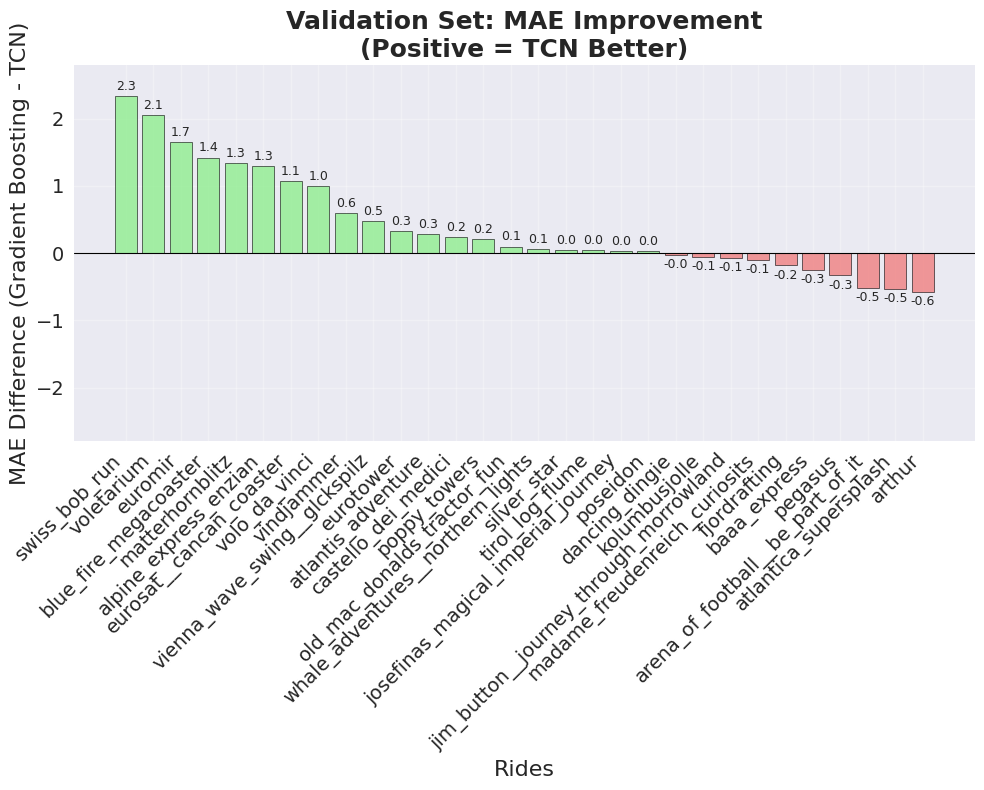

Plot saved as: visualizations/mae_comparison_test.svg


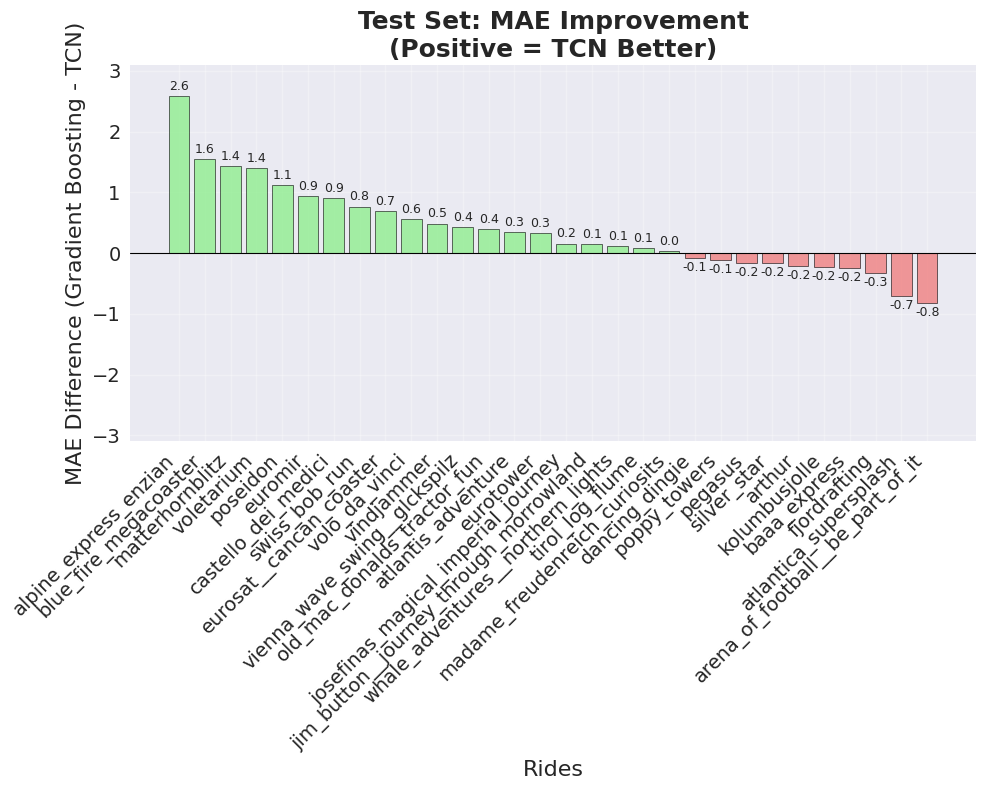


OVERALL PERFORMANCE METRICS SUMMARY

        VALIDATION SET        
------------------------------
MAE  - Gradient Boosting: 5.1412, TCN: 4.7433
RMSE - Gradient Boosting: 6.7830, TCN: 6.4970
sMAPE- Gradient Boosting: 30.0161, TCN: 28.2085

           TEST SET           
------------------------------
MAE  - Gradient Boosting: 5.0755, TCN: 4.6940
RMSE - Gradient Boosting: 6.6971, TCN: 6.4256
sMAPE- Gradient Boosting: 29.9731, TCN: 29.0508

       IMPROVEMENTS (%)       
------------------------------
MAE  - Val: +7.74%, Test: +7.52%
RMSE - Val: +4.22%, Test: +4.05%
sMAPE- Val: +6.02%, Test: +3.08%
Plot saved as: visualizations/mae_comparison_overall.svg


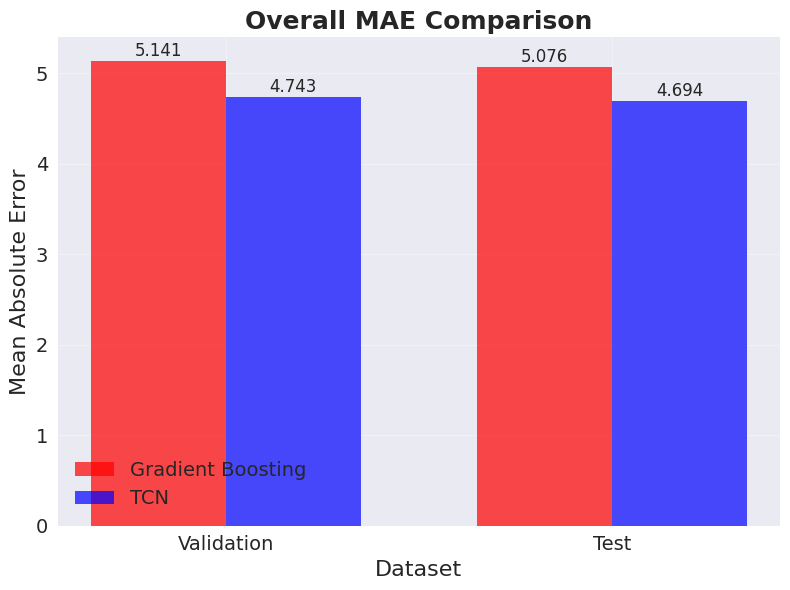


2. MAE by Ride (Baseline Test Set):
Plot saved as: visualizations/mae_by_ride_test_baseline.svg


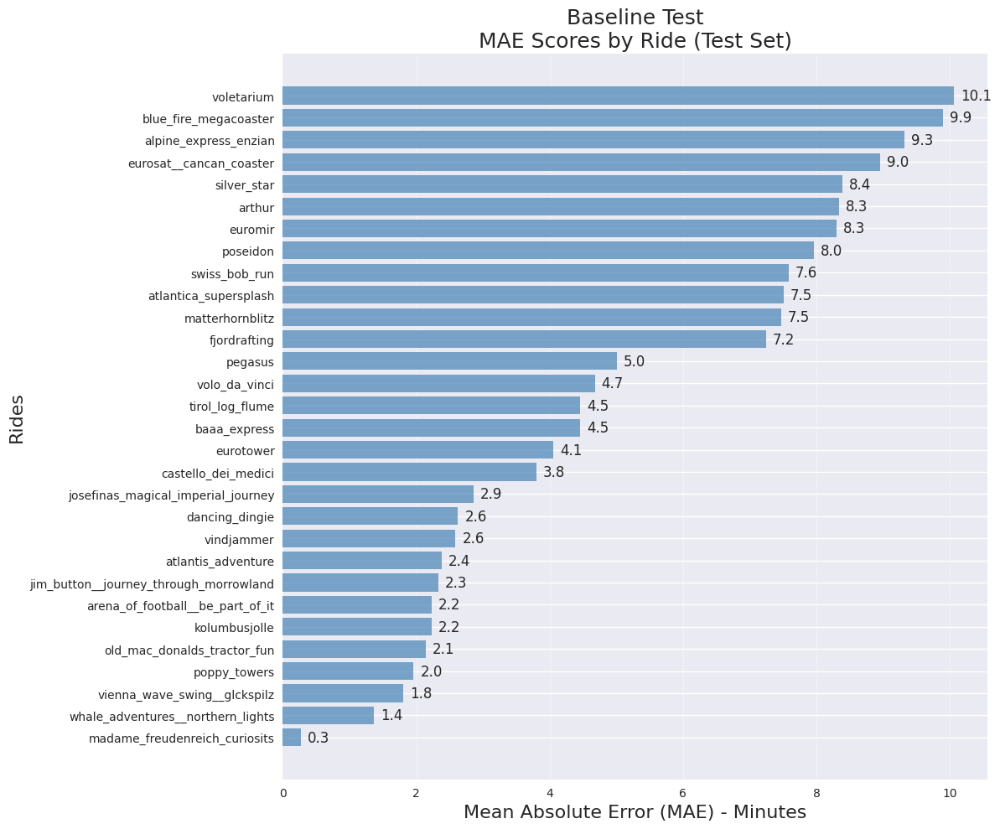


3. MAE by Ride (TCN Test Set):
Plot saved as: visualizations/mae_by_ride_test_tcn.svg


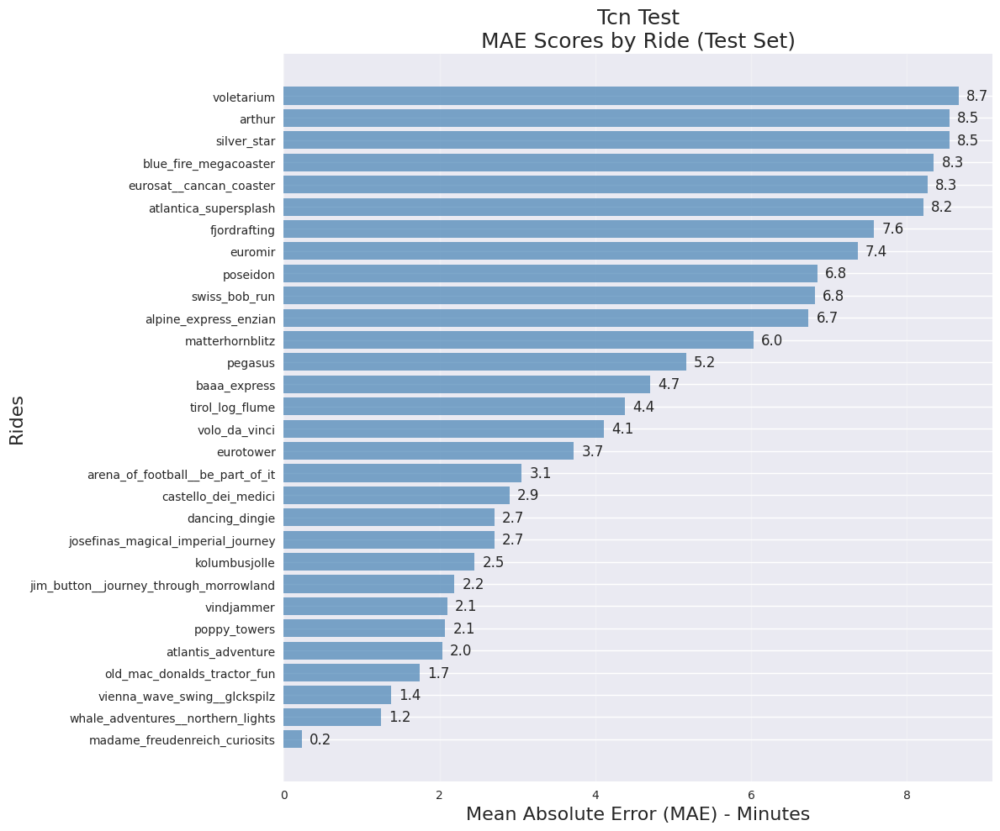


4. Scatter Comparison Plot:
Plot saved as: visualizations/scatter_comparison_alpine_express_enzian.svg


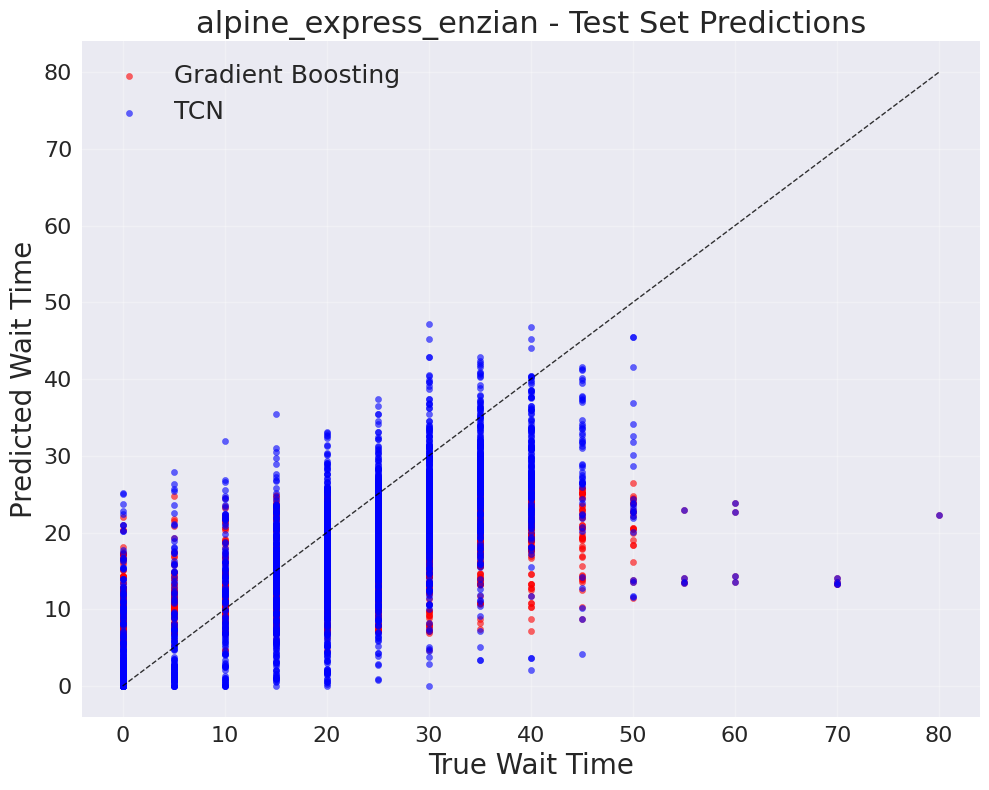

Plot saved as: visualizations/scatter_comparison_madame_freudenreich_curiosits.svg


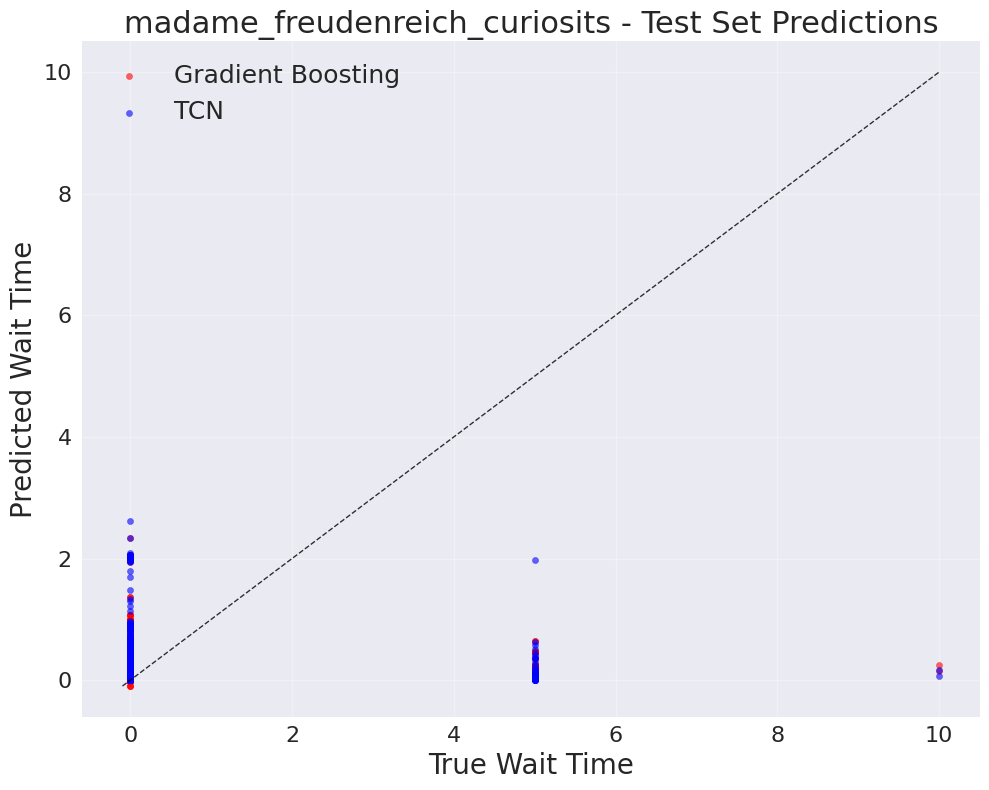

Plot saved as: visualizations/scatter_comparison_arena_of_football__be_part_of_it.svg


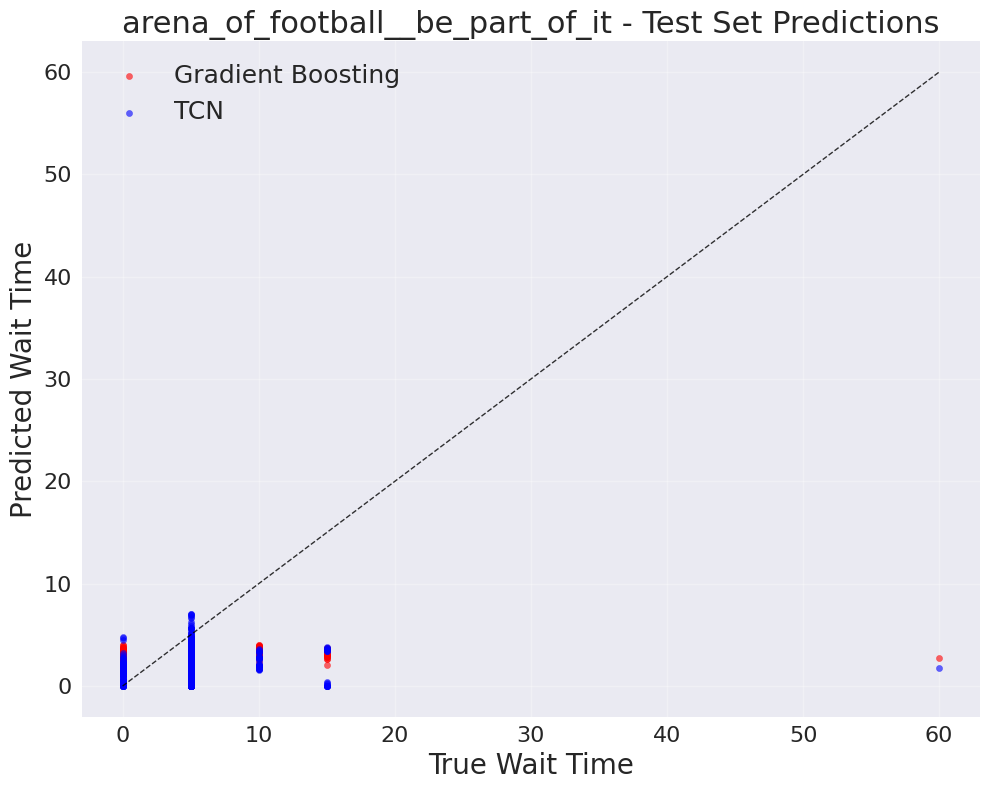

Plot saved as: visualizations/scatter_comparison_matterhornblitz.svg


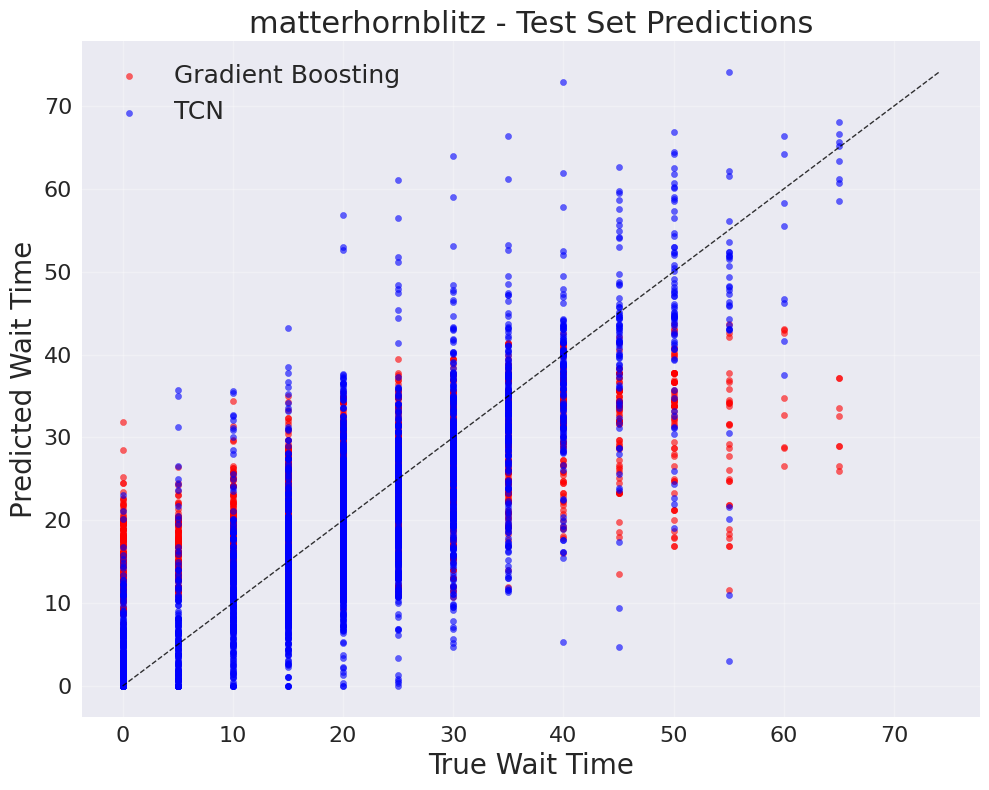

Plot saved as: visualizations/scatter_comparison_arthur.svg


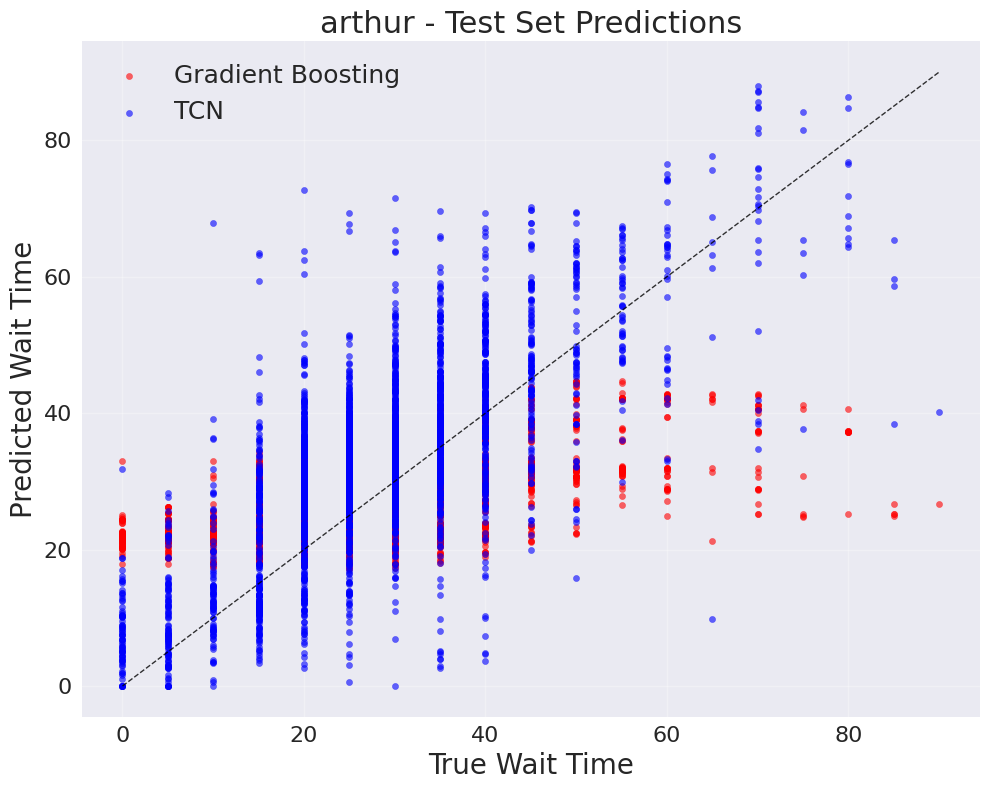

Plot saved as: visualizations/scatter_comparison_old_mac_donalds_tractor_fun.svg


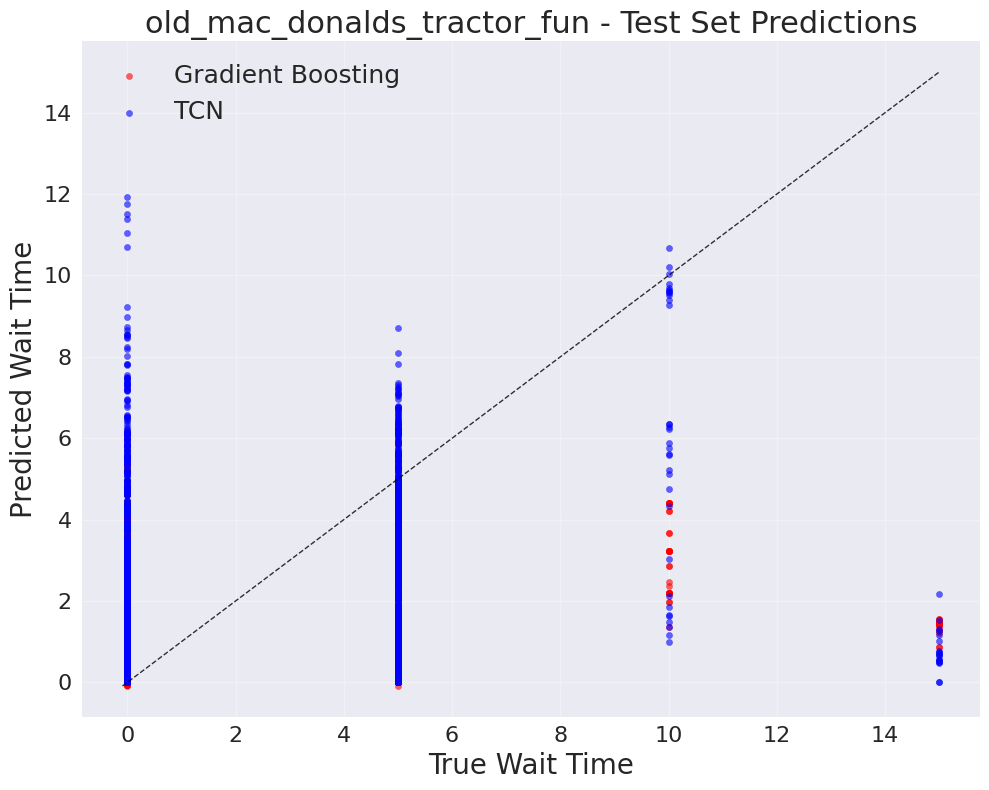

Plot saved as: visualizations/scatter_comparison_atlantica_supersplash.svg


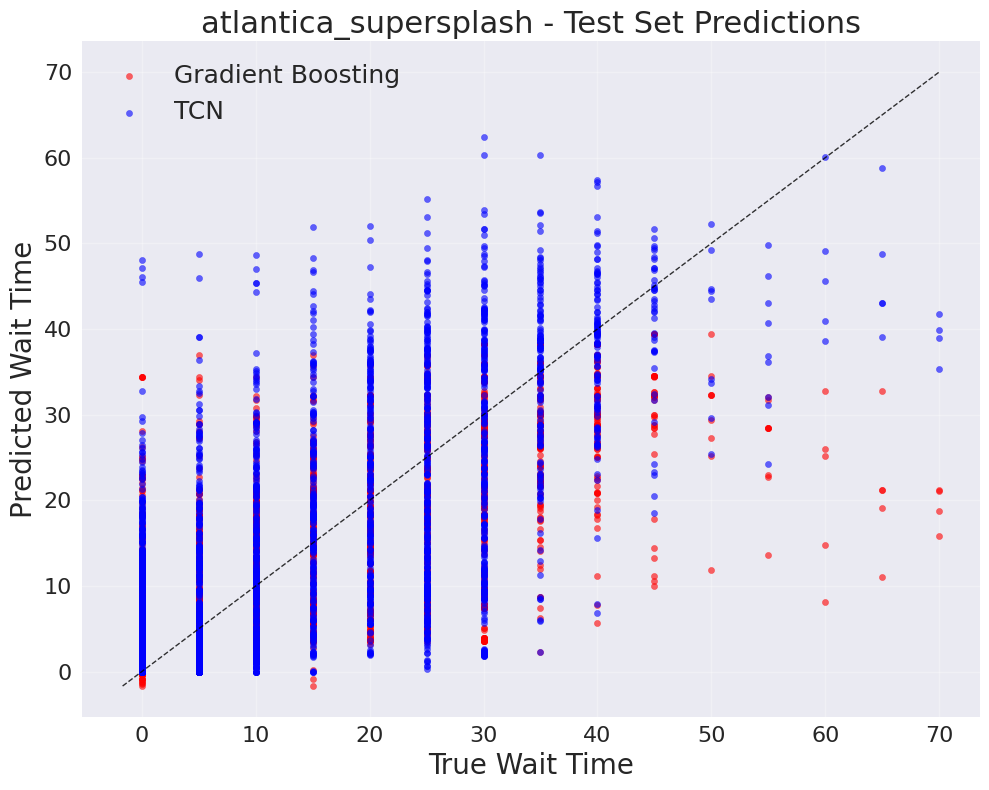

Plot saved as: visualizations/scatter_comparison_pegasus.svg


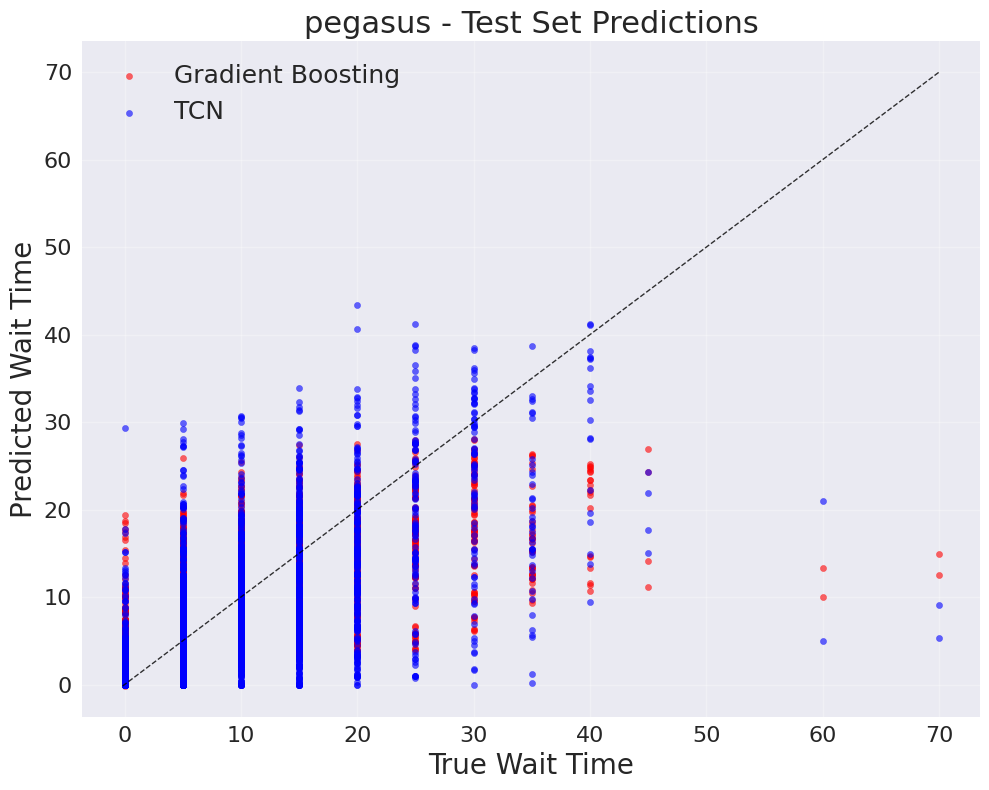

Plot saved as: visualizations/scatter_comparison_atlantis_adventure.svg


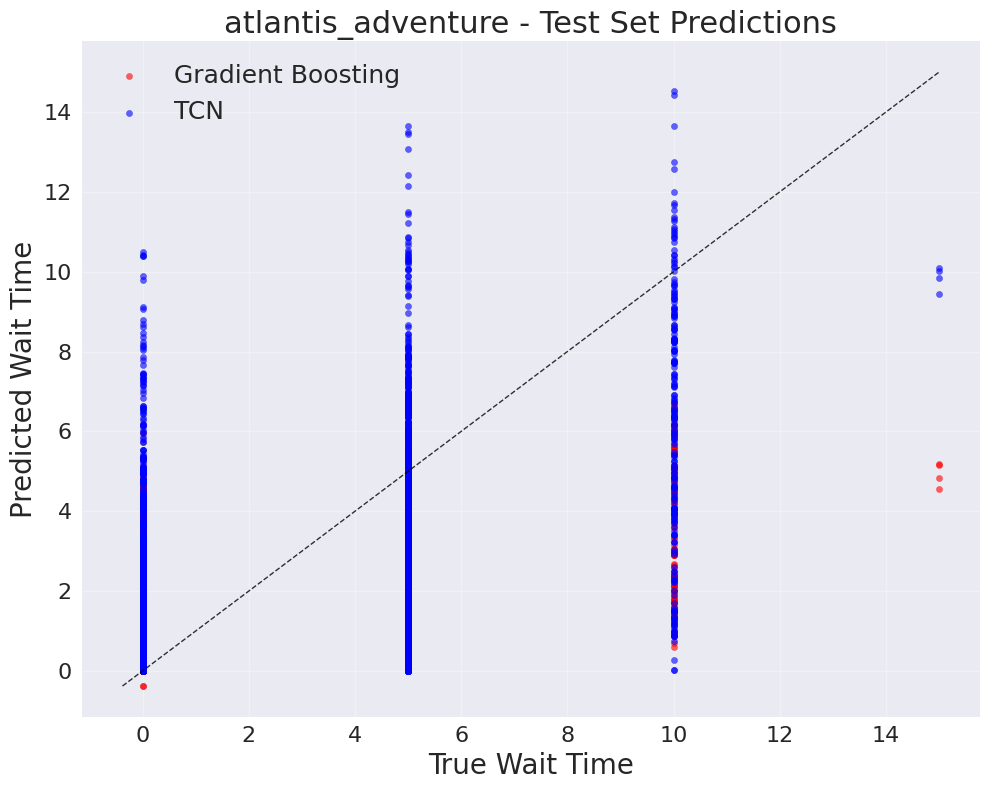

Plot saved as: visualizations/scatter_comparison_poppy_towers.svg


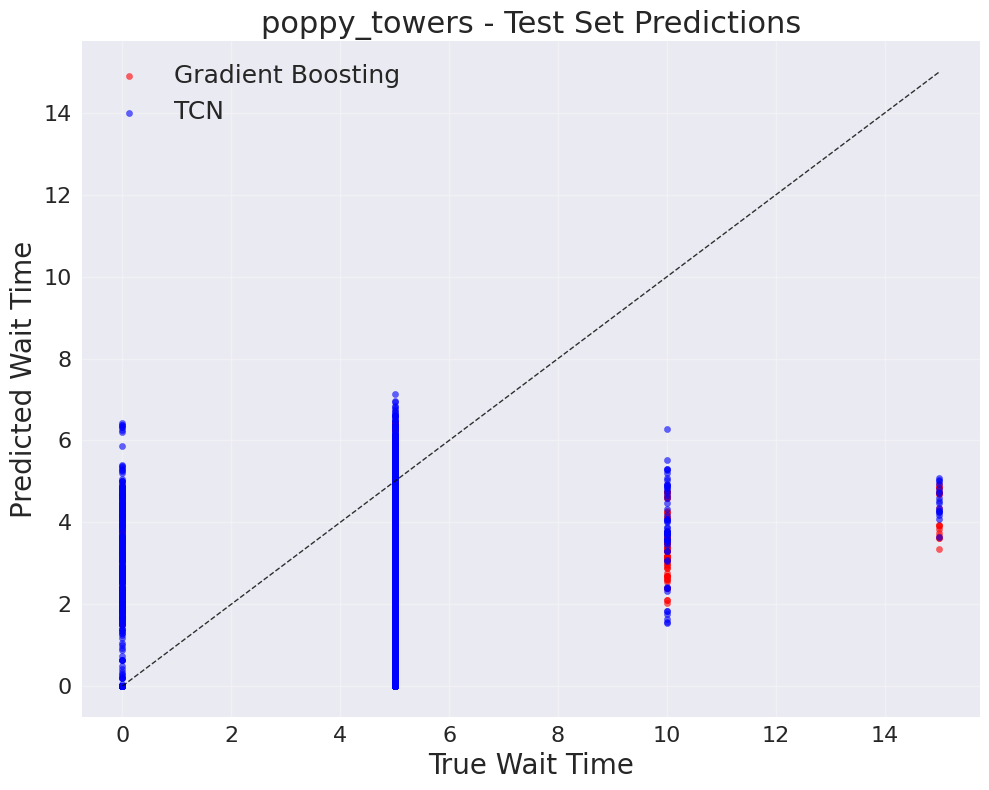

Plot saved as: visualizations/scatter_comparison_baaa_express.svg


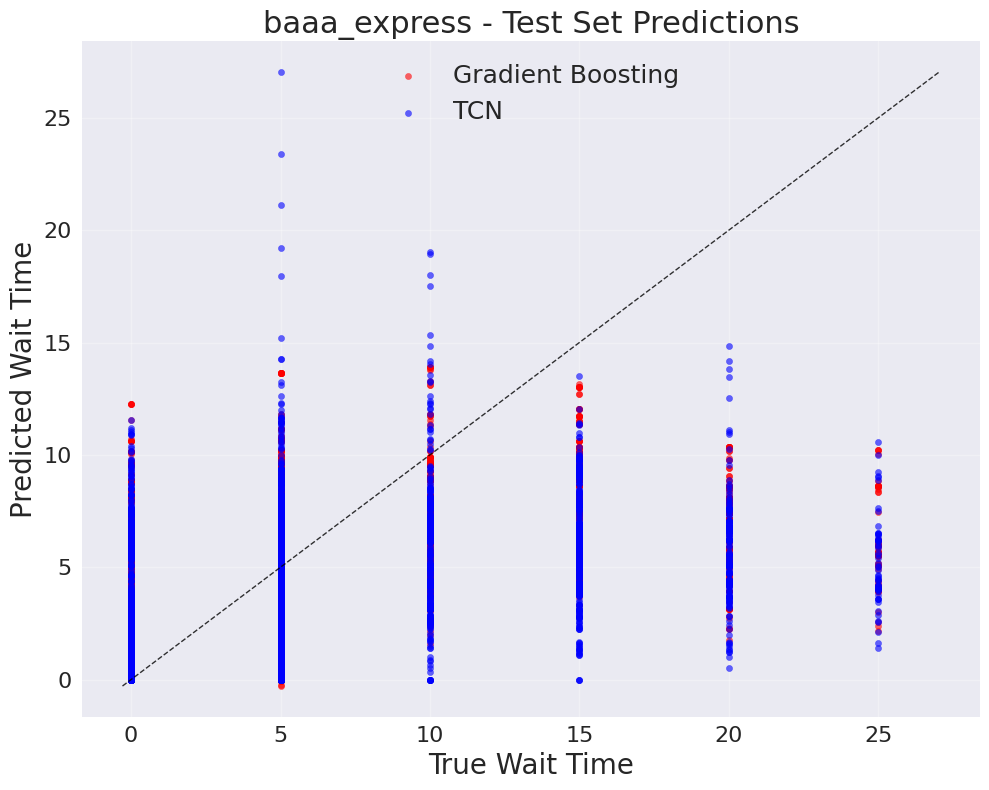

Plot saved as: visualizations/scatter_comparison_poseidon.svg


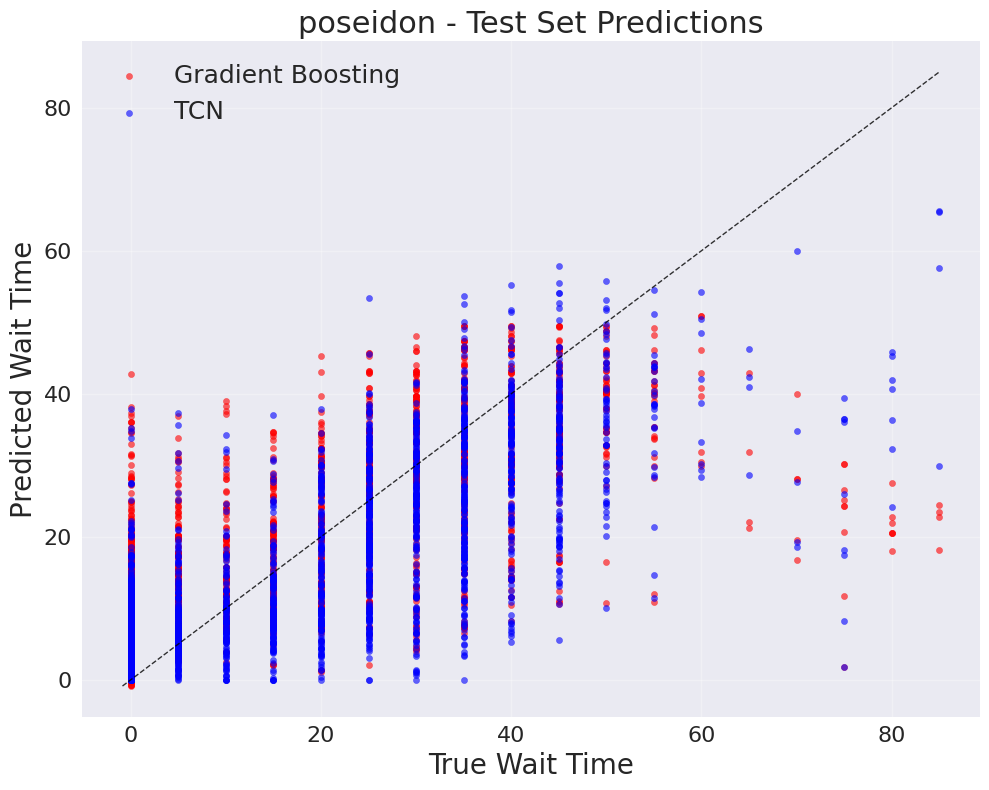

Plot saved as: visualizations/scatter_comparison_blue_fire_megacoaster.svg


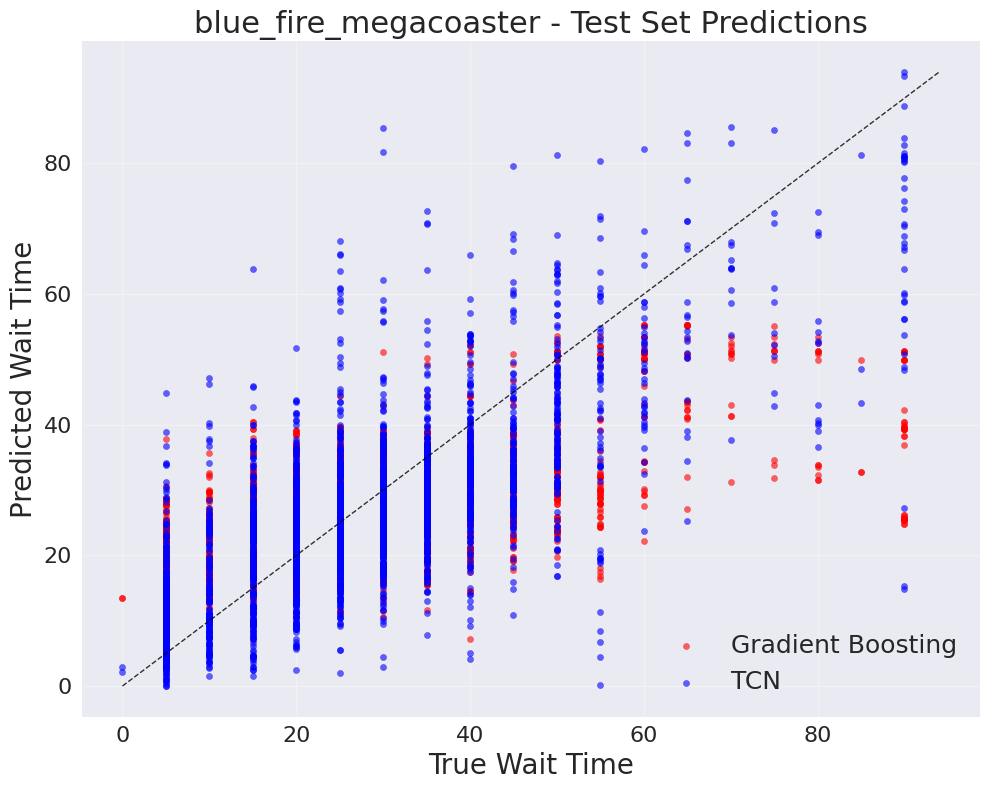

Plot saved as: visualizations/scatter_comparison_silver_star.svg


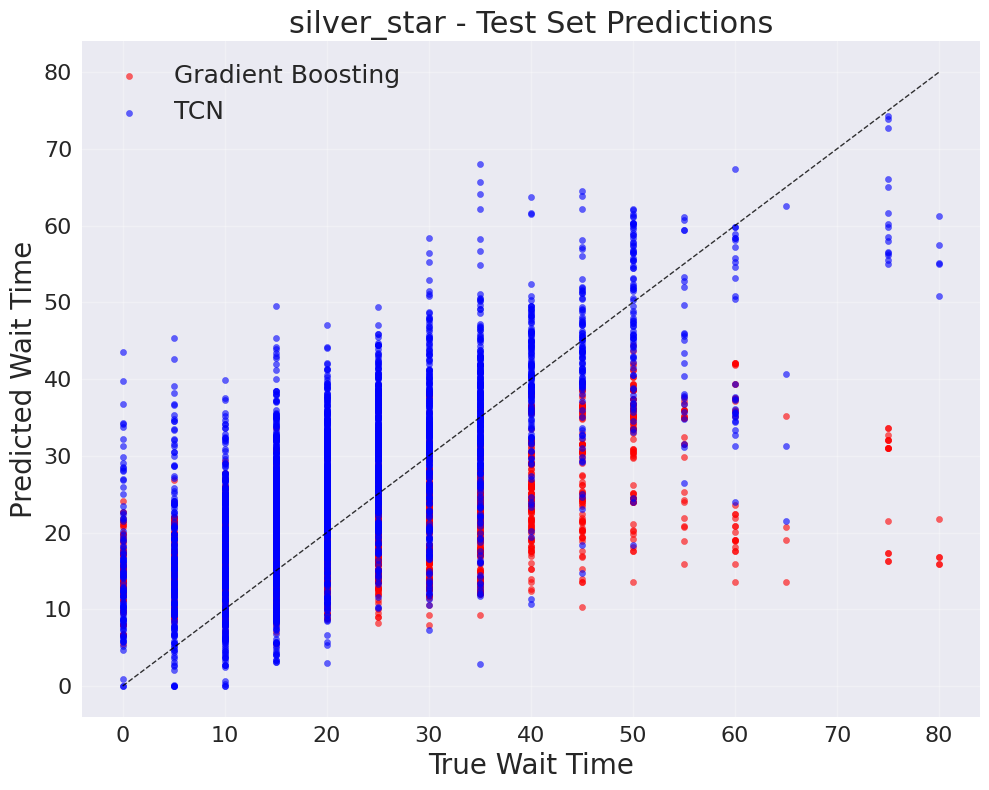

Plot saved as: visualizations/scatter_comparison_castello_dei_medici.svg


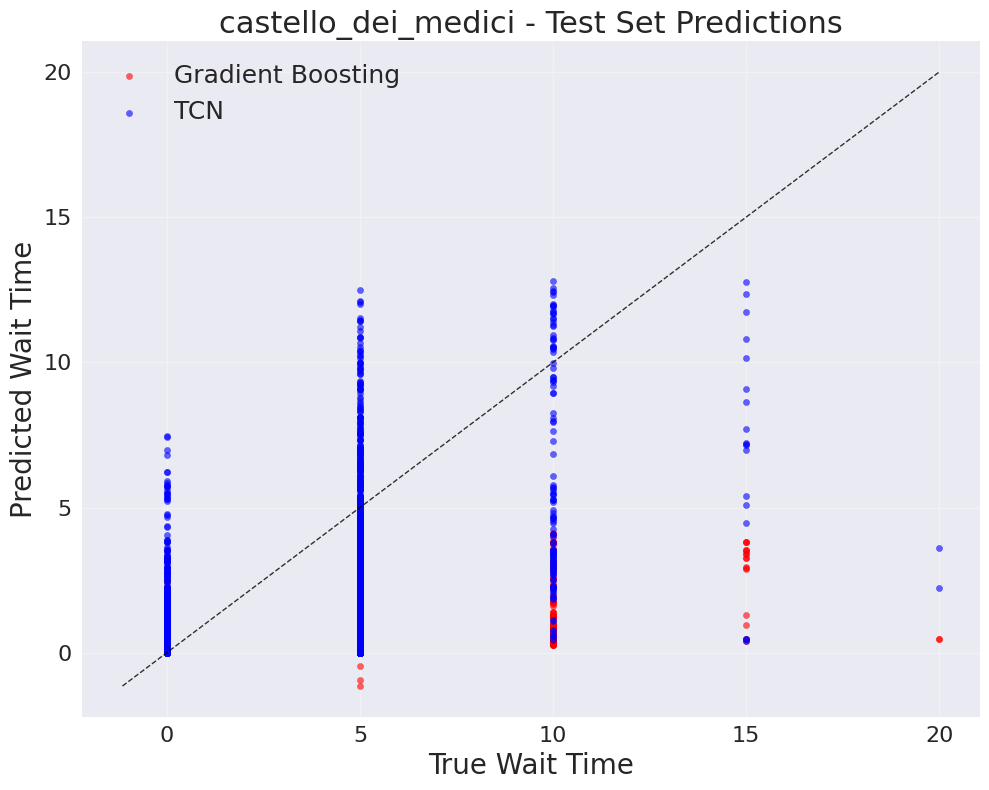

Plot saved as: visualizations/scatter_comparison_swiss_bob_run.svg


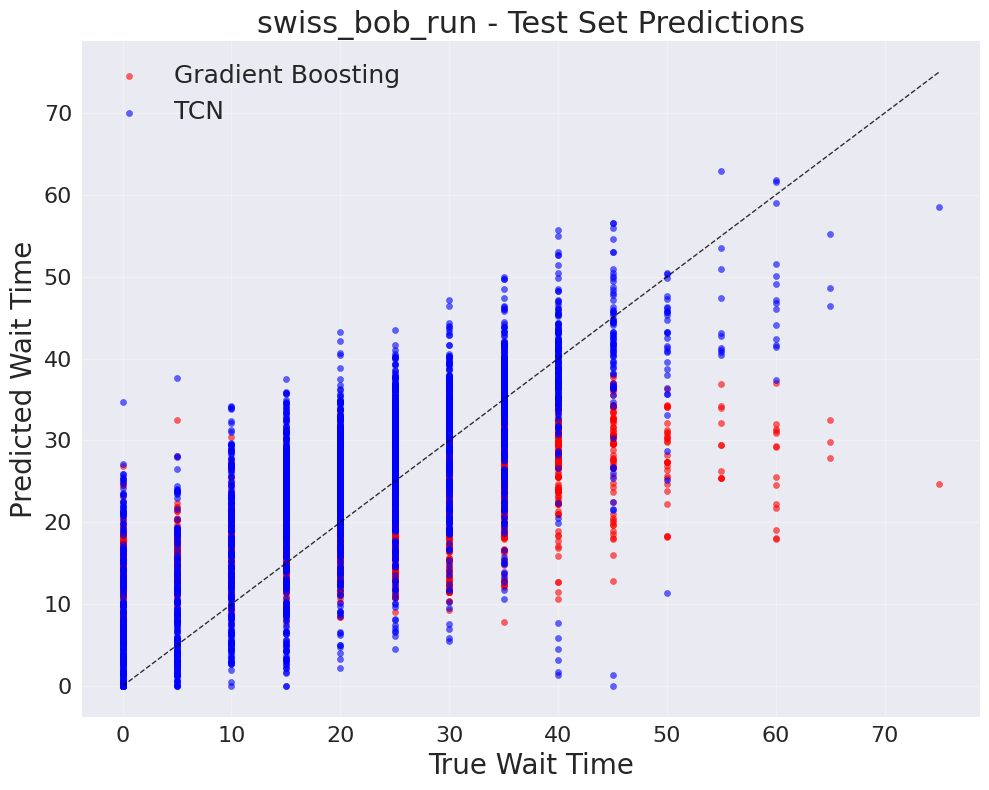

Plot saved as: visualizations/scatter_comparison_dancing_dingie.svg


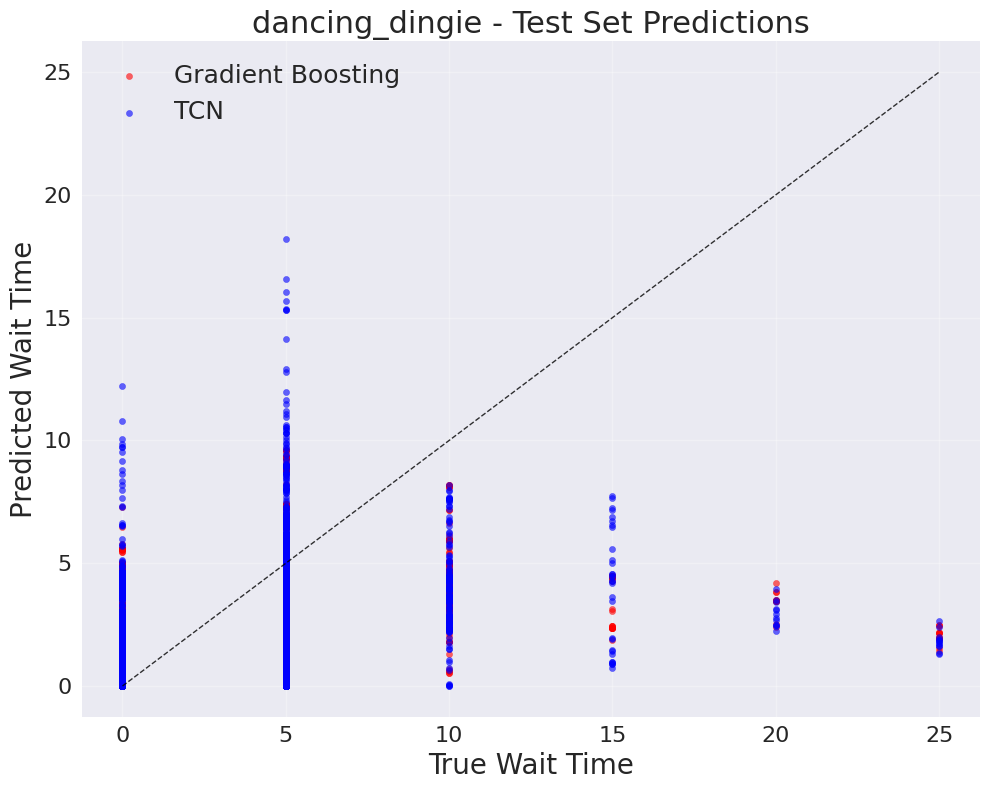

Plot saved as: visualizations/scatter_comparison_tirol_log_flume.svg


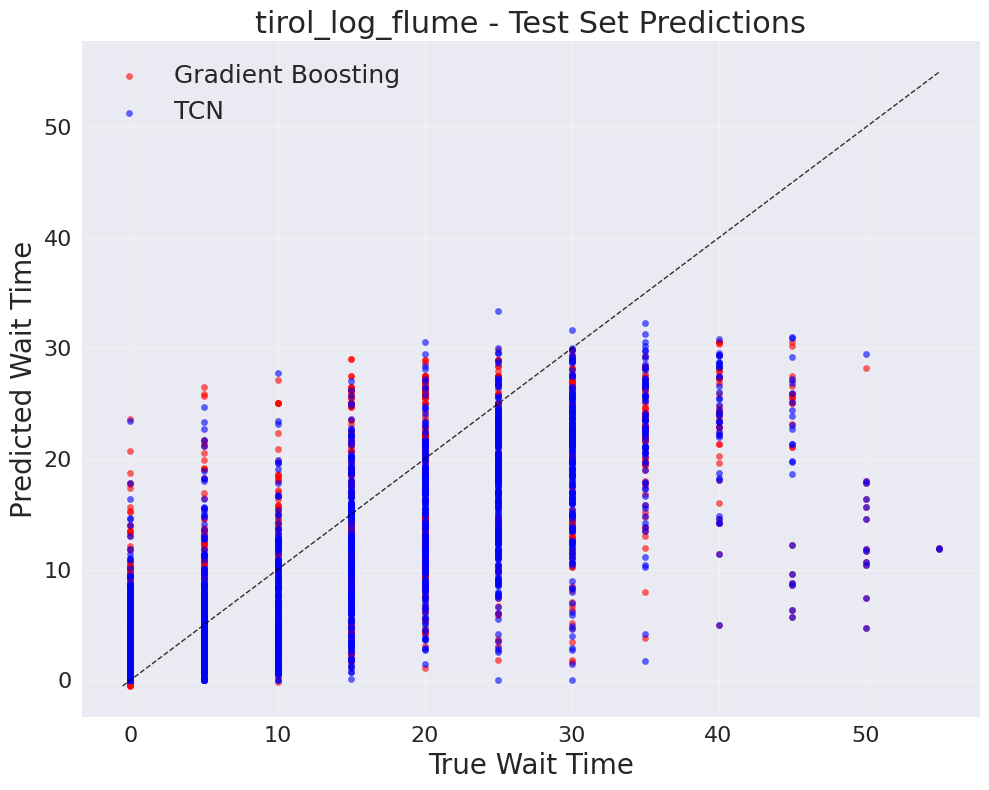

Plot saved as: visualizations/scatter_comparison_euromir.svg


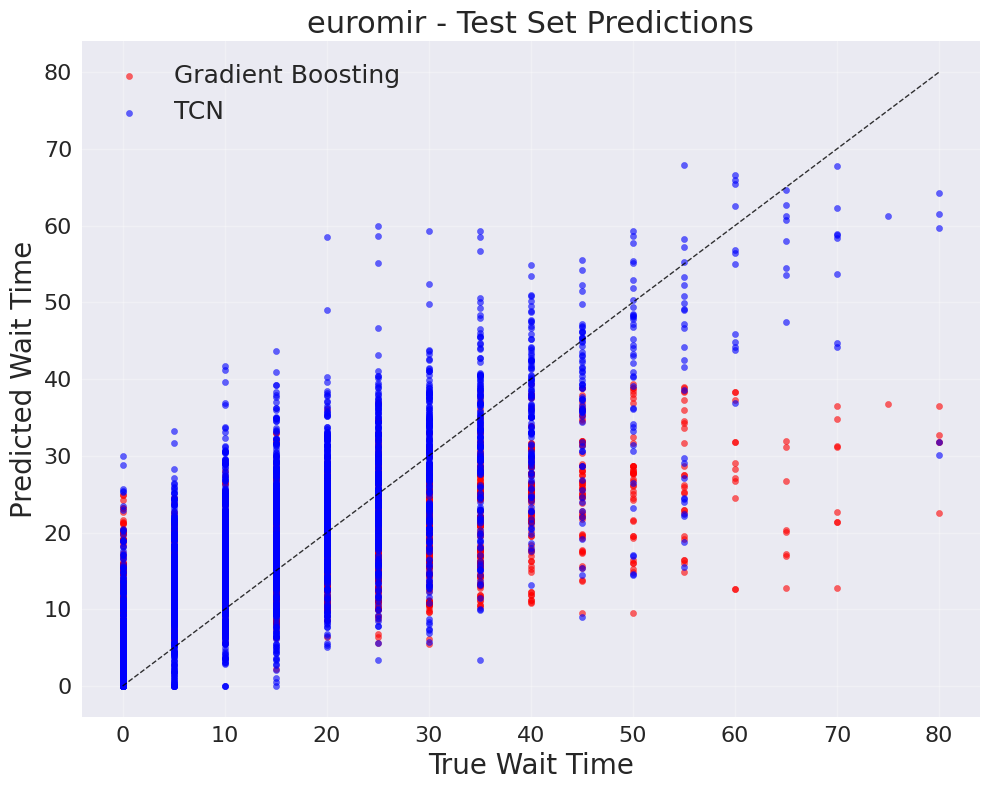

Plot saved as: visualizations/scatter_comparison_vienna_wave_swing__glckspilz.svg


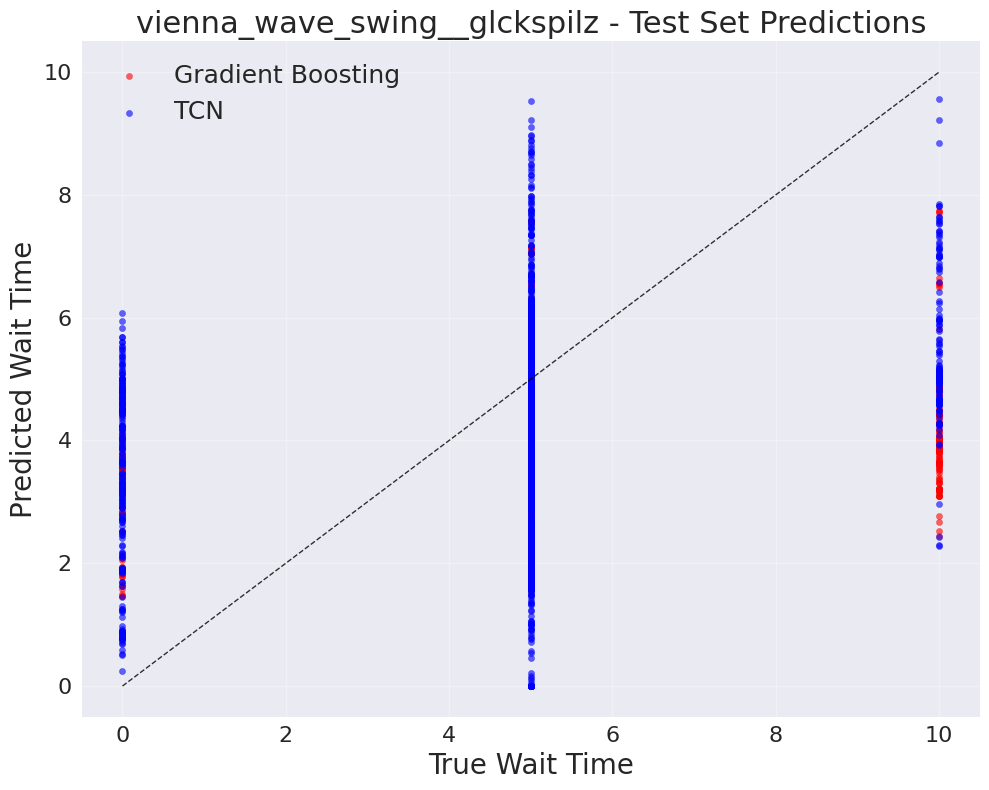

Plot saved as: visualizations/scatter_comparison_eurosat__cancan_coaster.svg


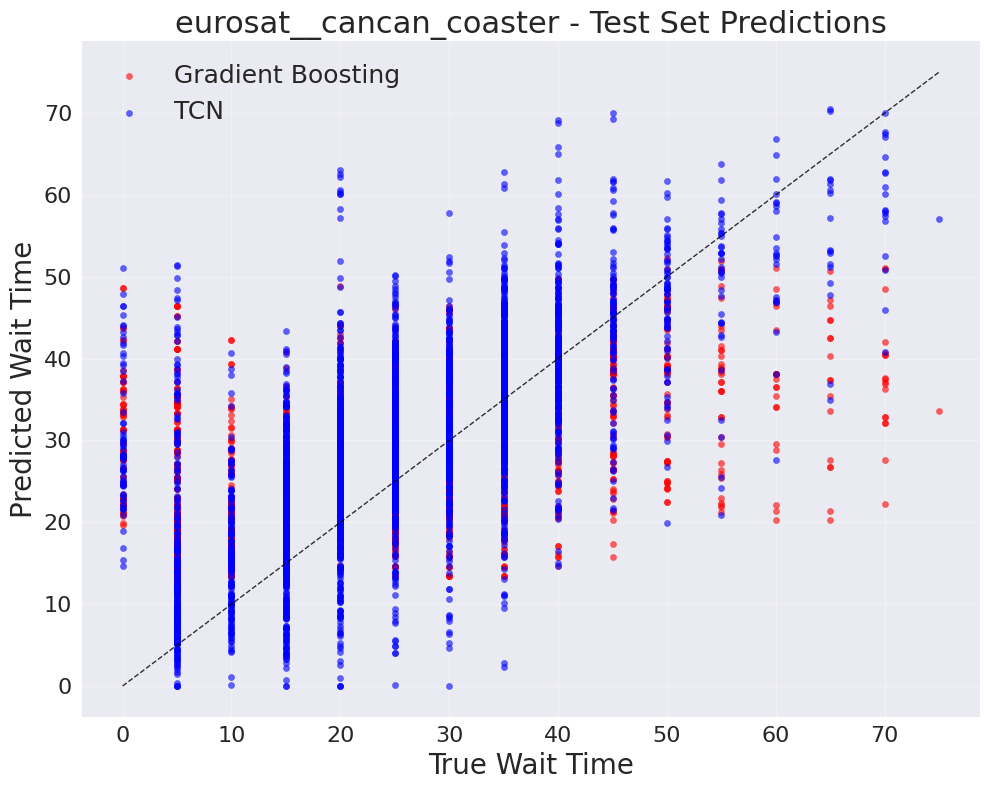

Plot saved as: visualizations/scatter_comparison_vindjammer.svg


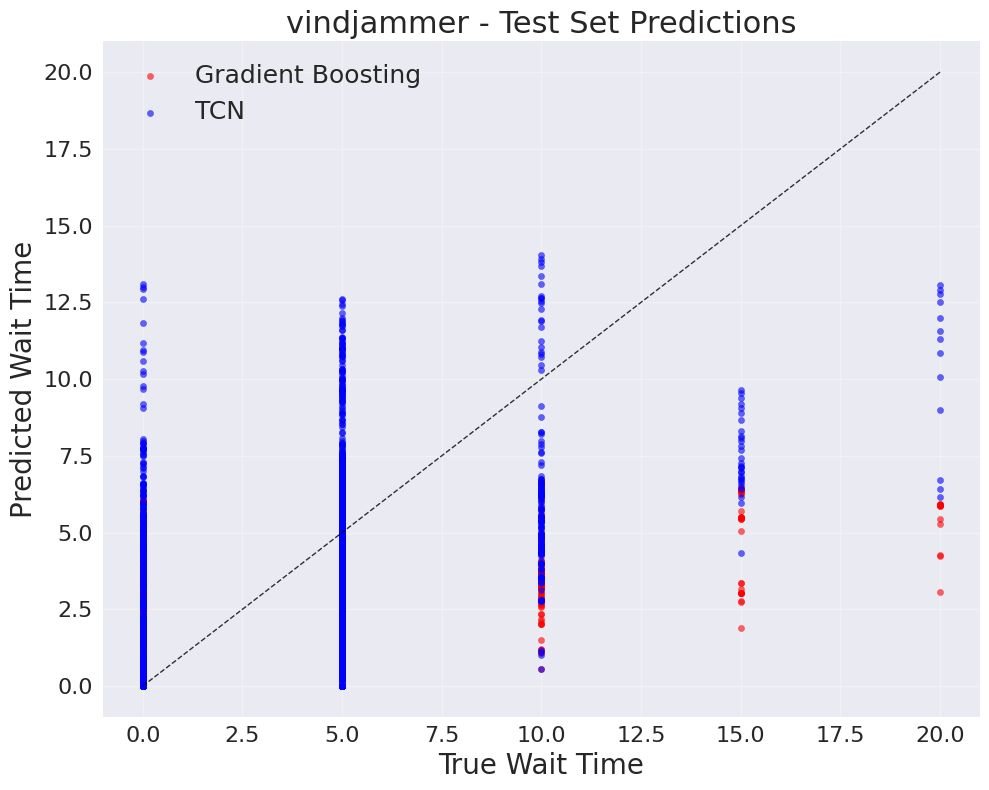

Plot saved as: visualizations/scatter_comparison_eurotower.svg


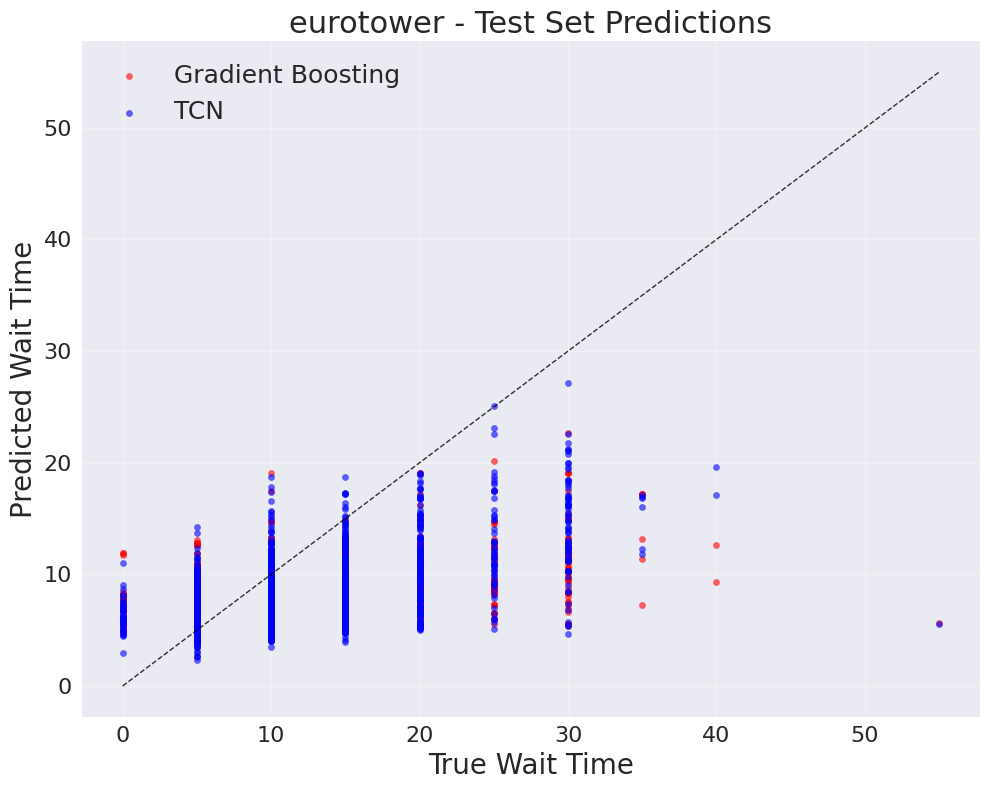

Plot saved as: visualizations/scatter_comparison_voletarium.svg


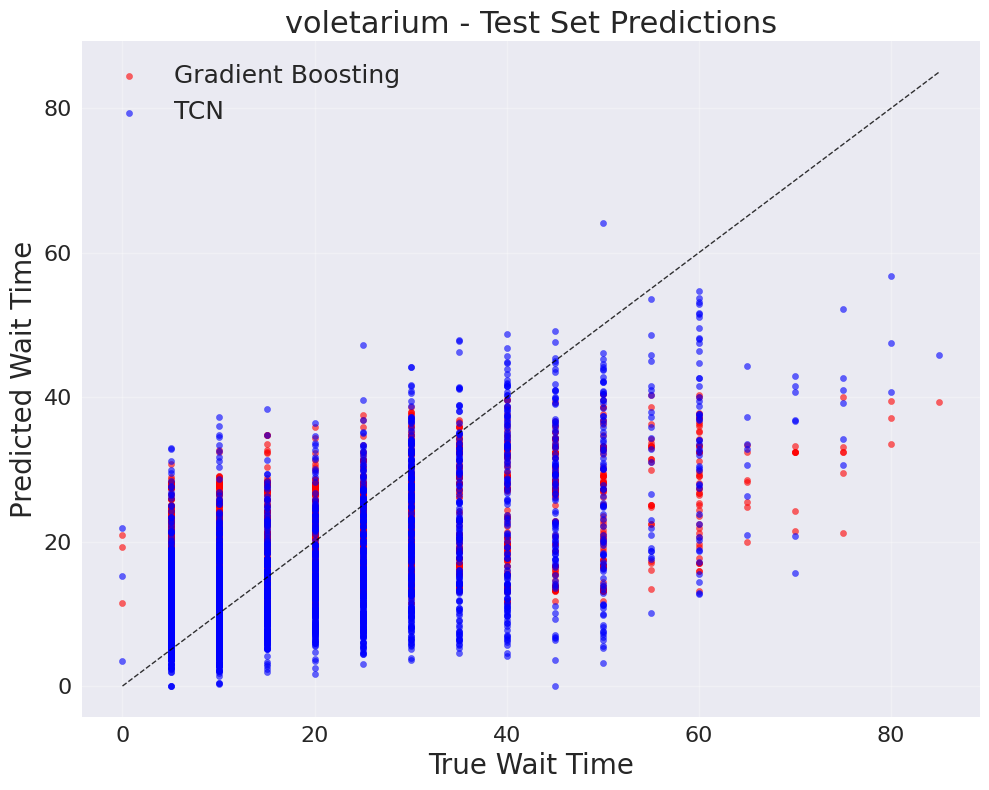

Plot saved as: visualizations/scatter_comparison_fjordrafting.svg


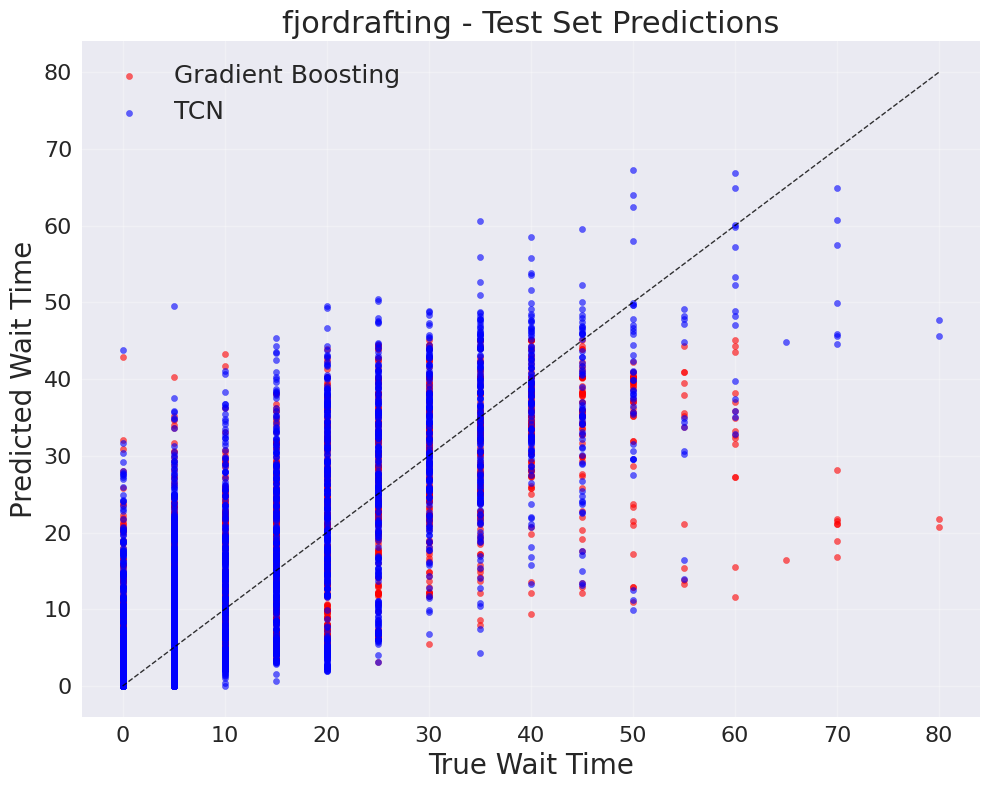

Plot saved as: visualizations/scatter_comparison_volo_da_vinci.svg


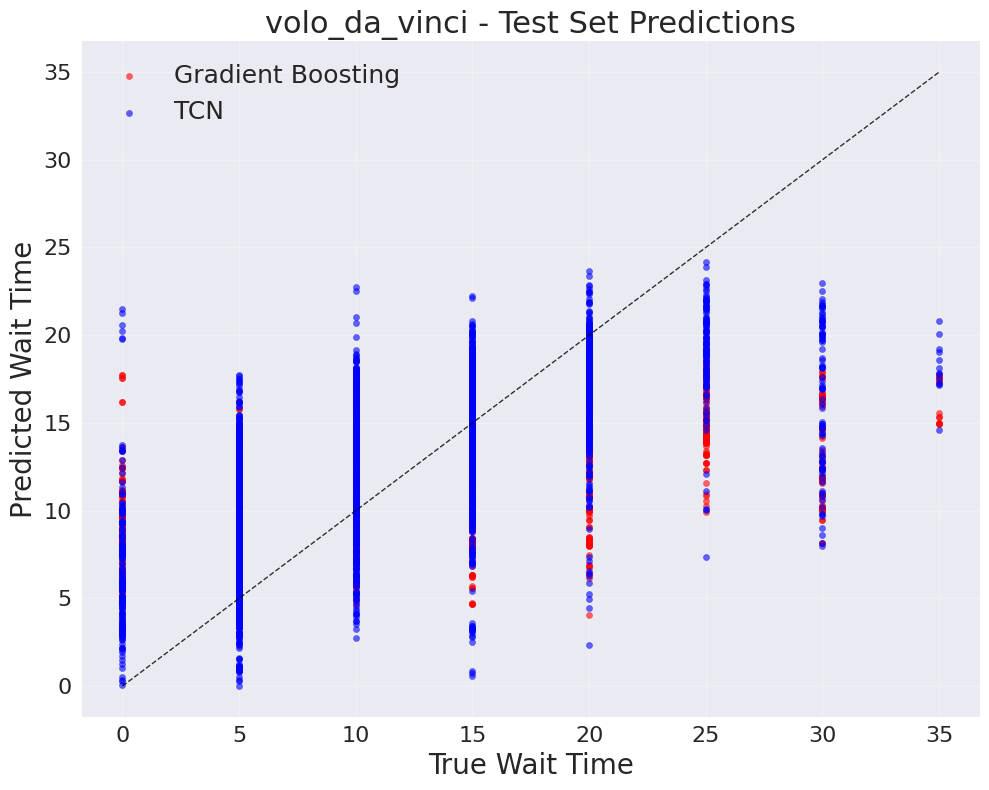

Plot saved as: visualizations/scatter_comparison_jim_button__journey_through_morrowland.svg


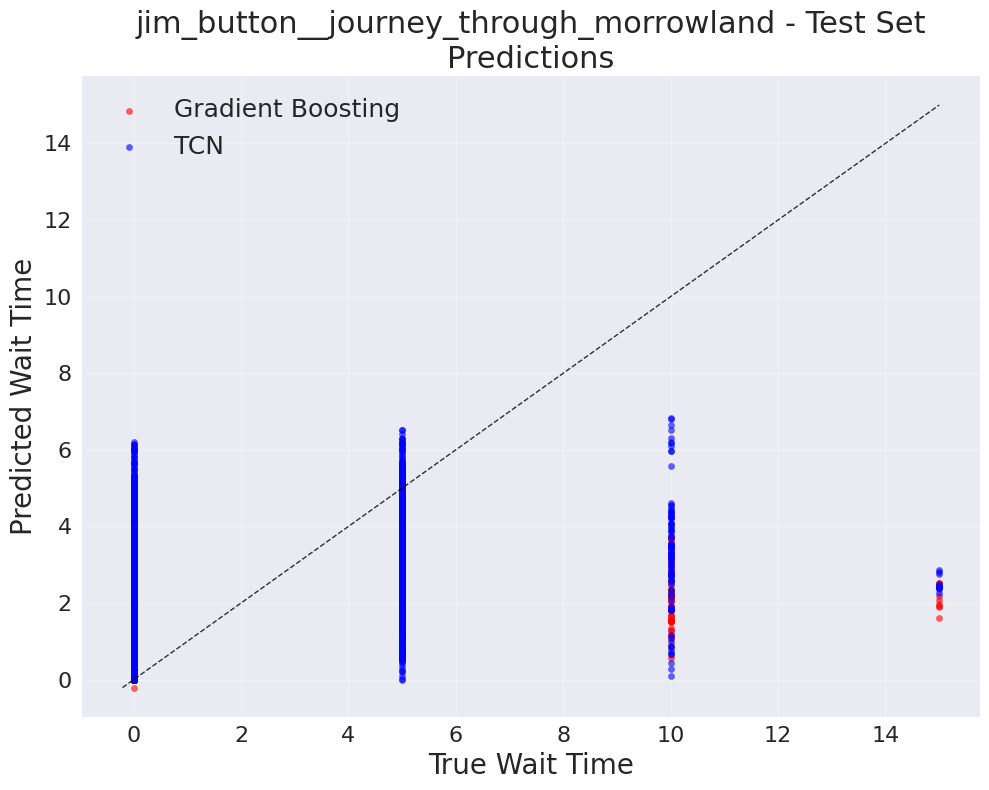

Plot saved as: visualizations/scatter_comparison_josefinas_magical_imperial_journey.svg


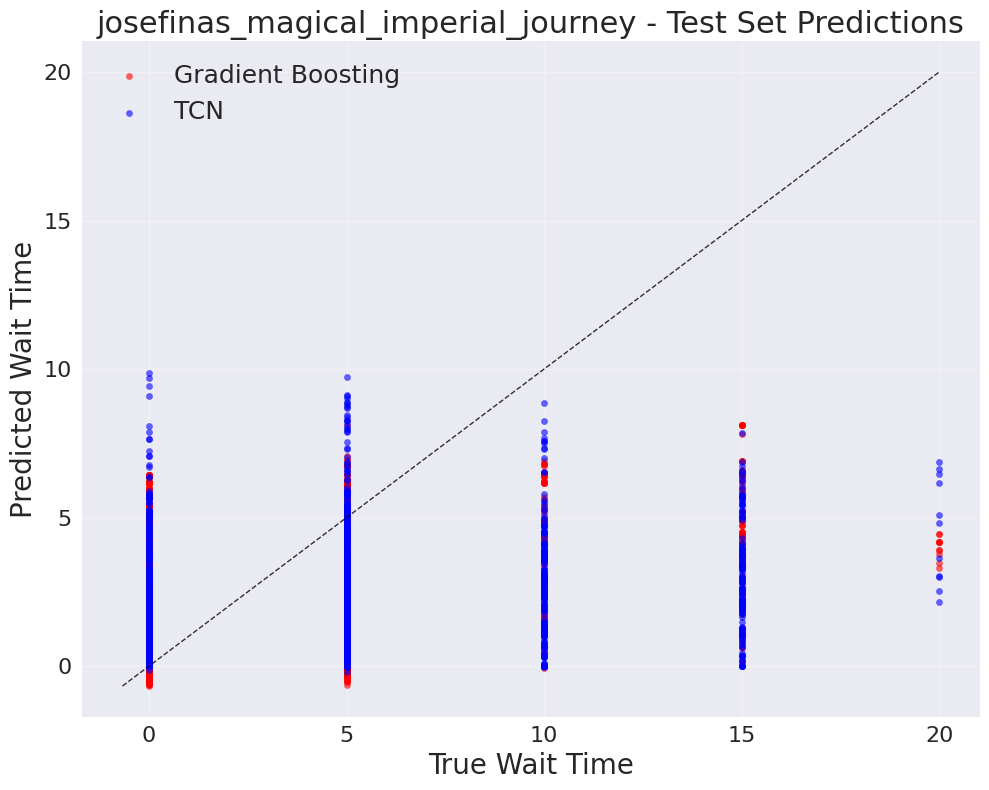

Plot saved as: visualizations/scatter_comparison_whale_adventures__northern_lights.svg


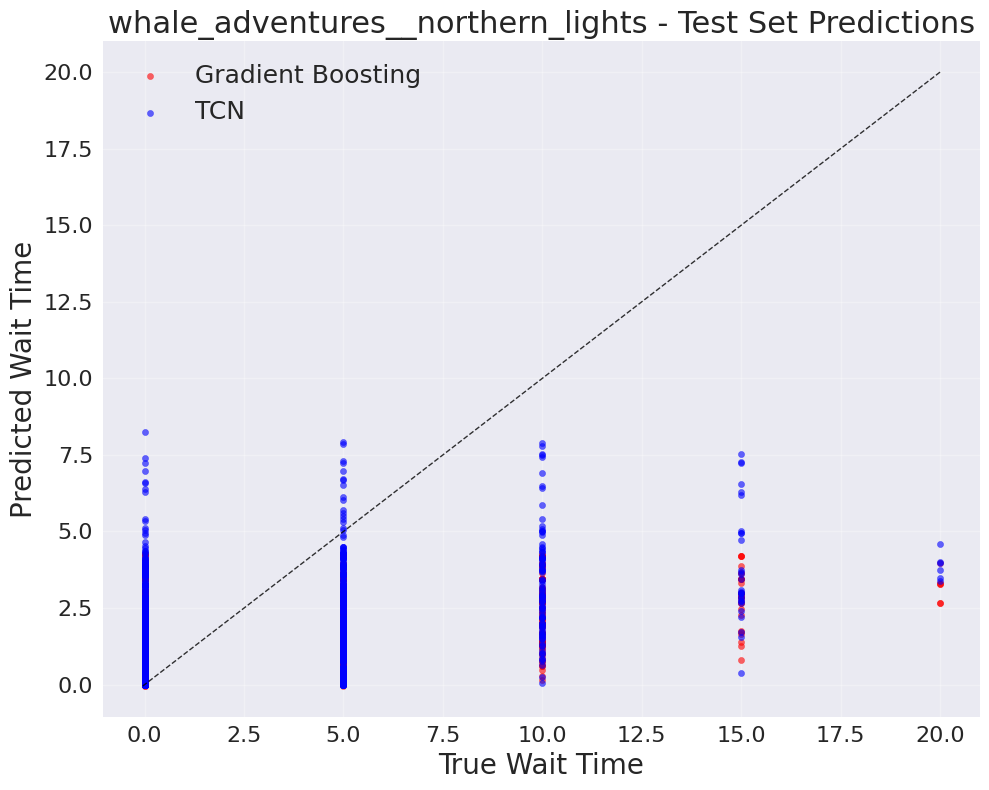

Plot saved as: visualizations/scatter_comparison_kolumbusjolle.svg


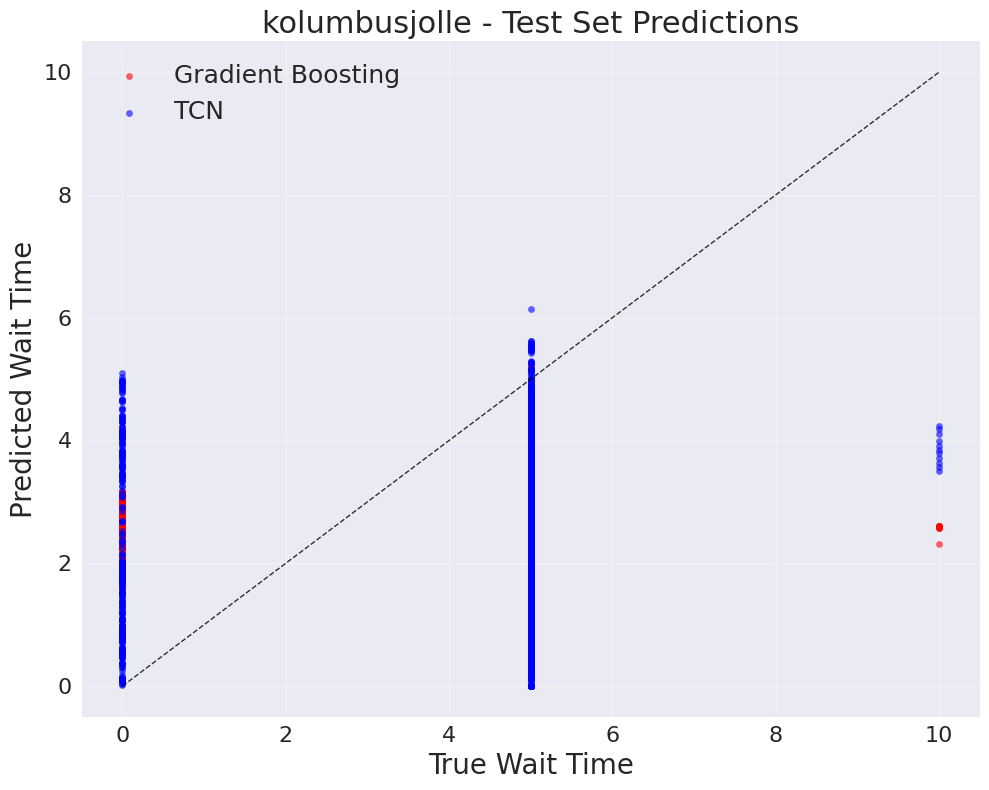

Plot saved as: visualizations/scatter_comparison_combined.svg


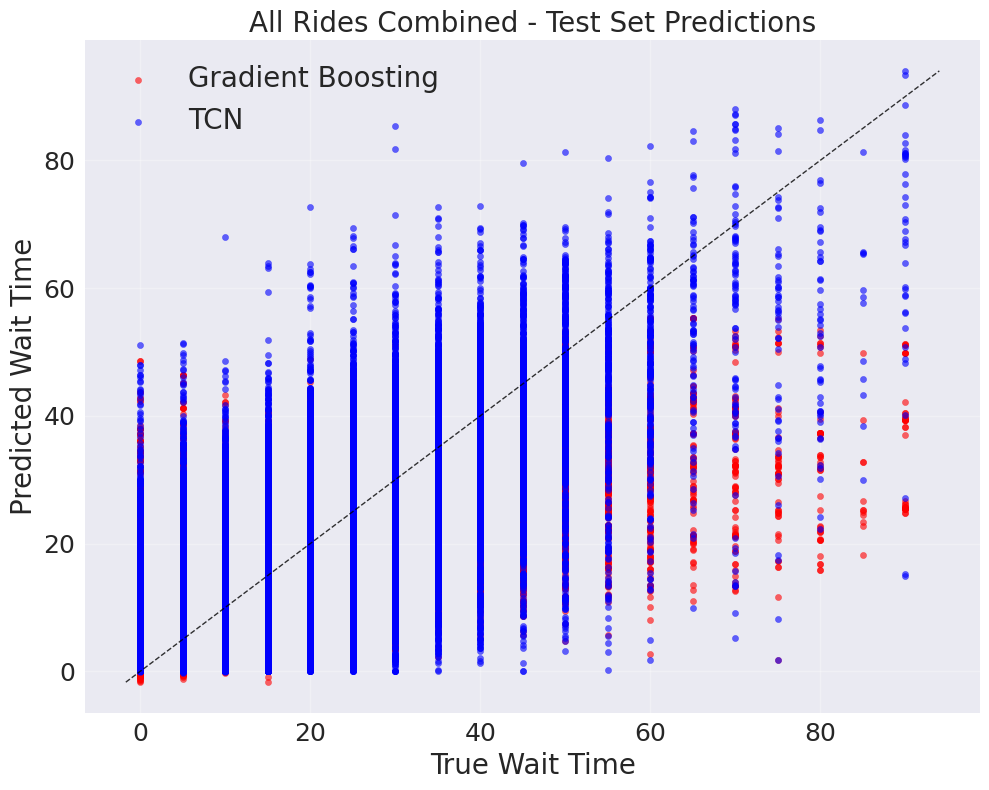


5. Error Distribution Plot:
Plot saved as: visualizations/error_distribution_alpine_express_enzian.svg


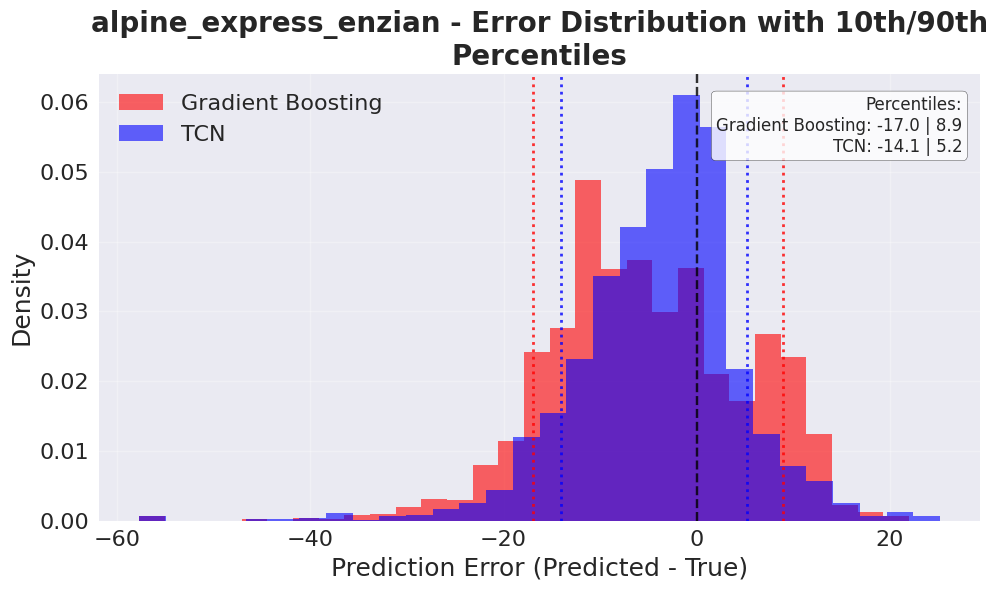

Plot saved as: visualizations/error_distribution_madame_freudenreich_curiosits.svg


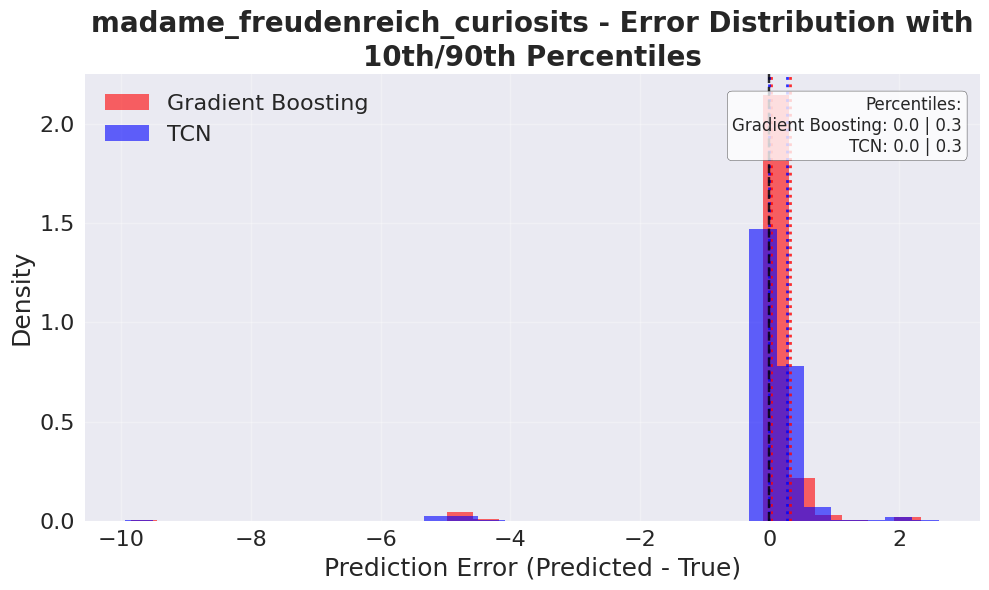

Plot saved as: visualizations/error_distribution_arena_of_football__be_part_of_it.svg


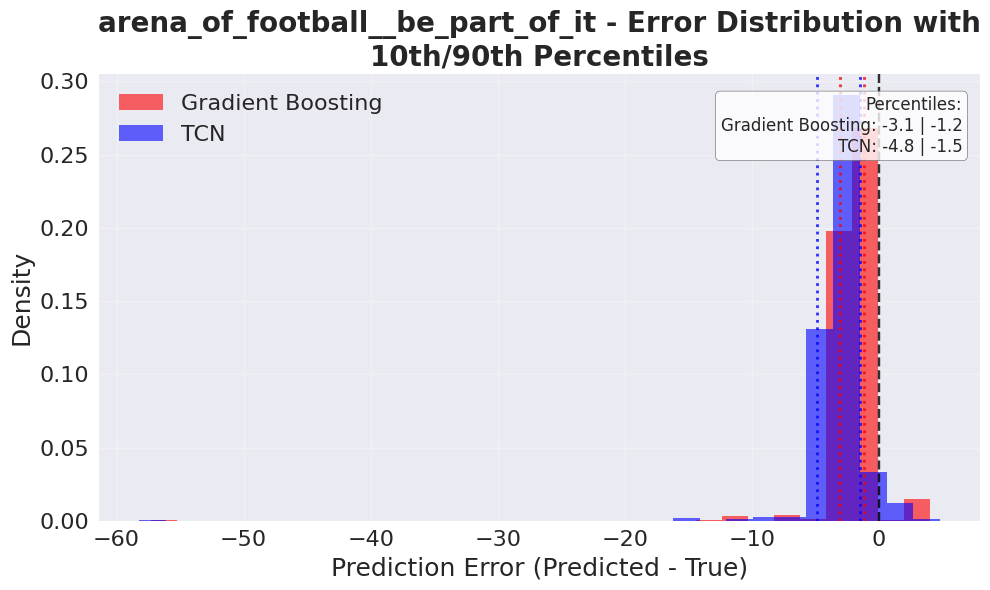

Plot saved as: visualizations/error_distribution_matterhornblitz.svg


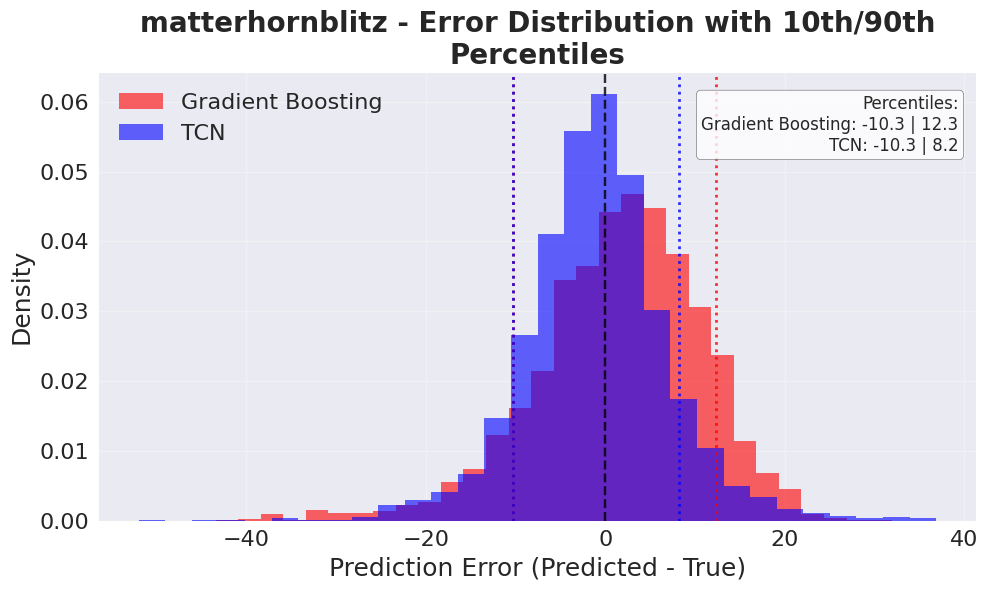

Plot saved as: visualizations/error_distribution_arthur.svg


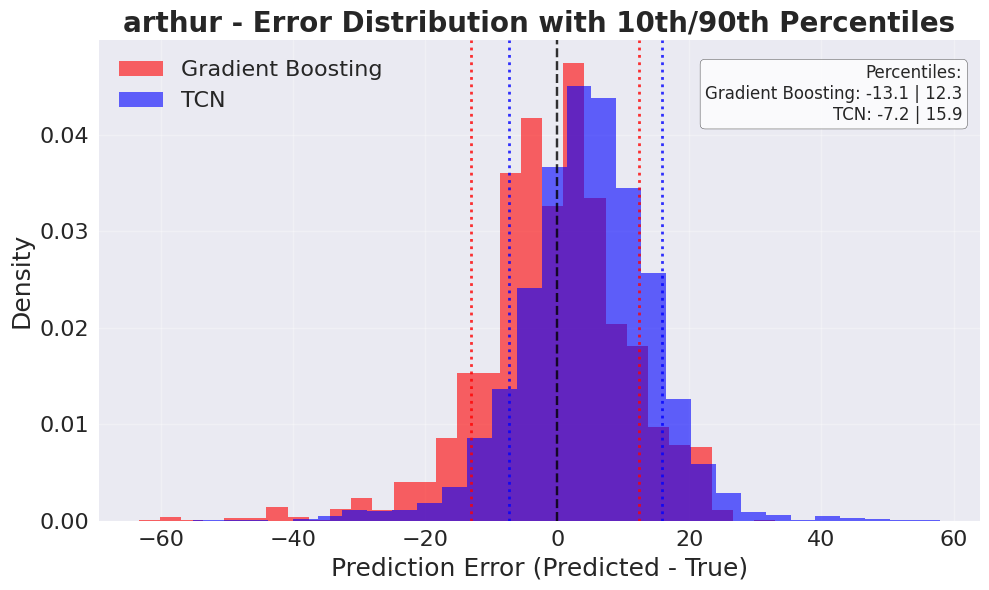

Plot saved as: visualizations/error_distribution_old_mac_donalds_tractor_fun.svg


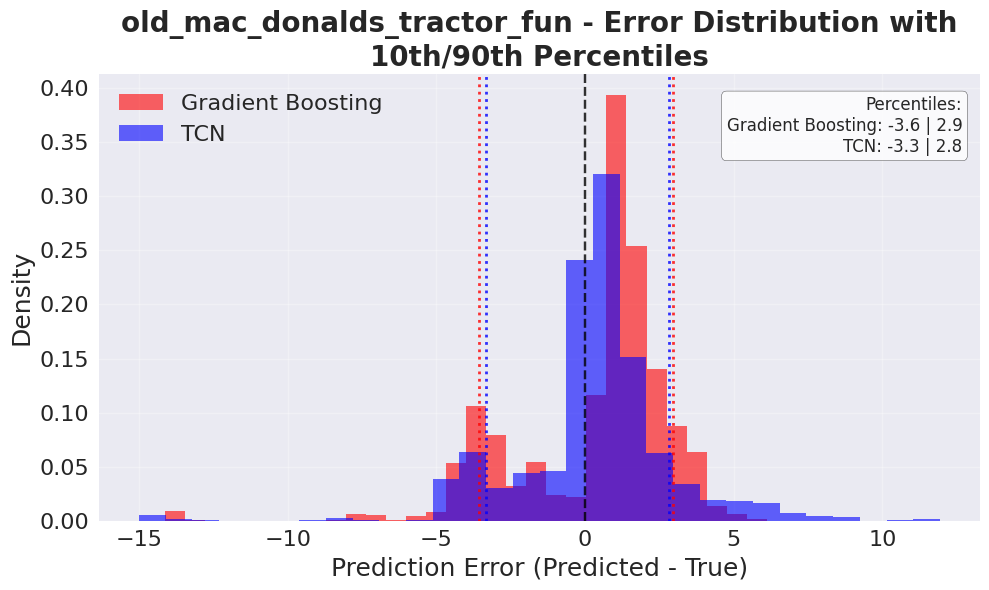

Plot saved as: visualizations/error_distribution_atlantica_supersplash.svg


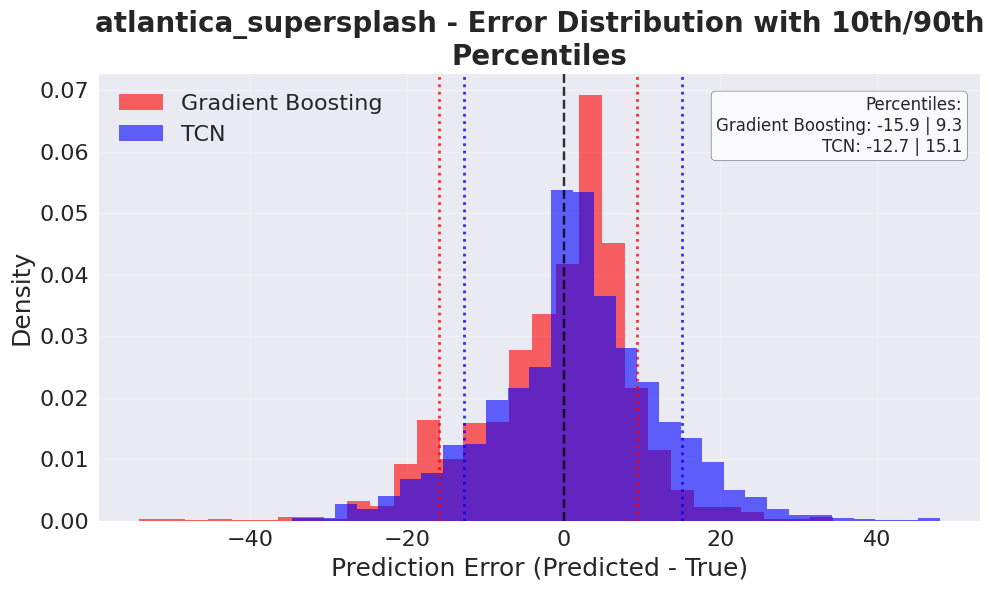

Plot saved as: visualizations/error_distribution_pegasus.svg


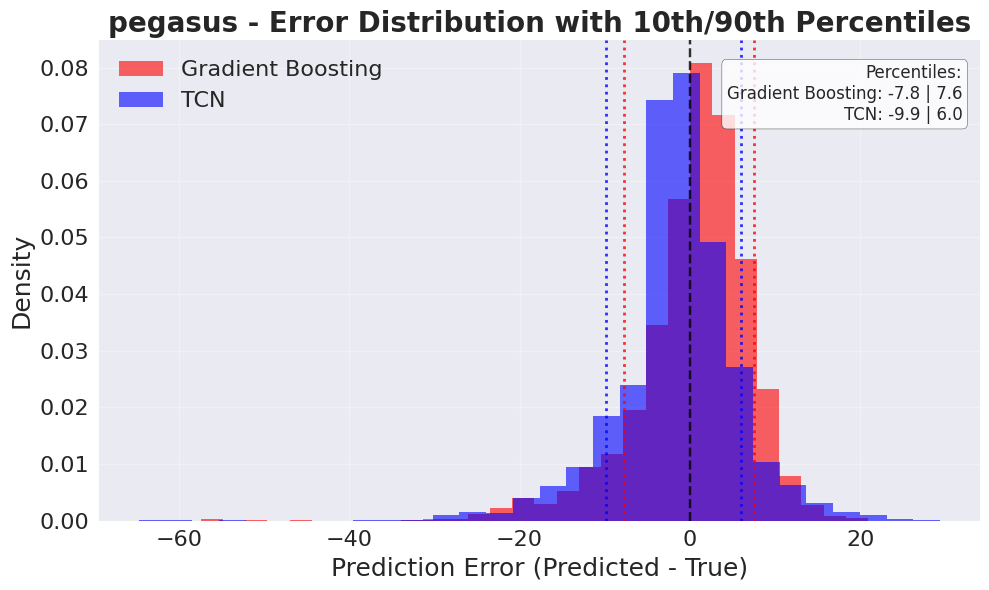

Plot saved as: visualizations/error_distribution_atlantis_adventure.svg


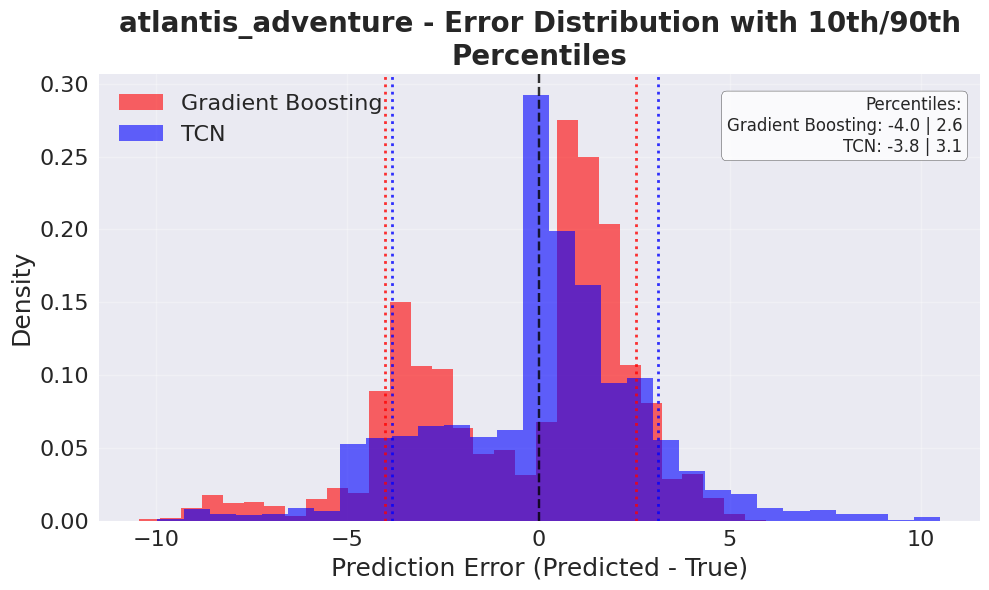

Plot saved as: visualizations/error_distribution_poppy_towers.svg


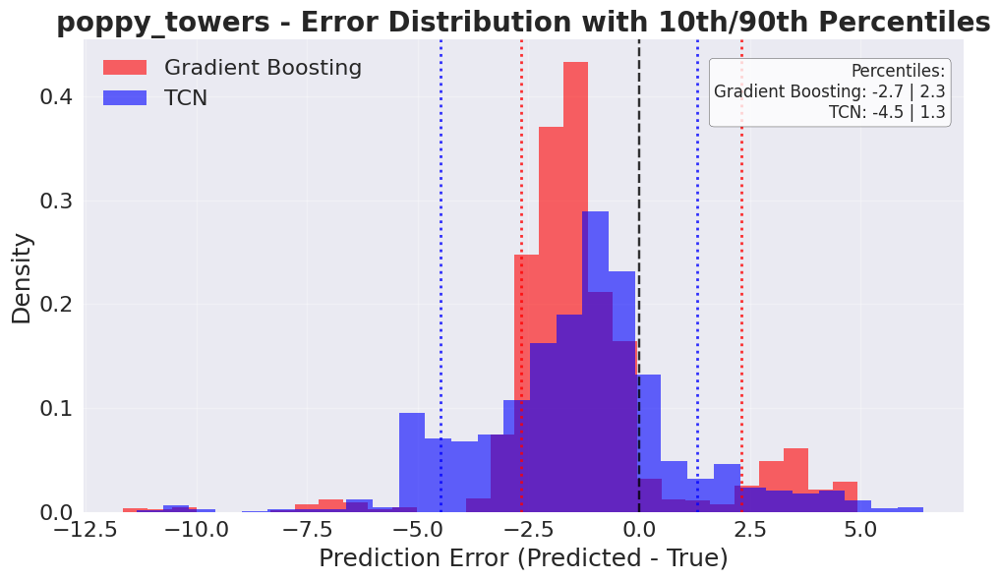

Plot saved as: visualizations/error_distribution_baaa_express.svg


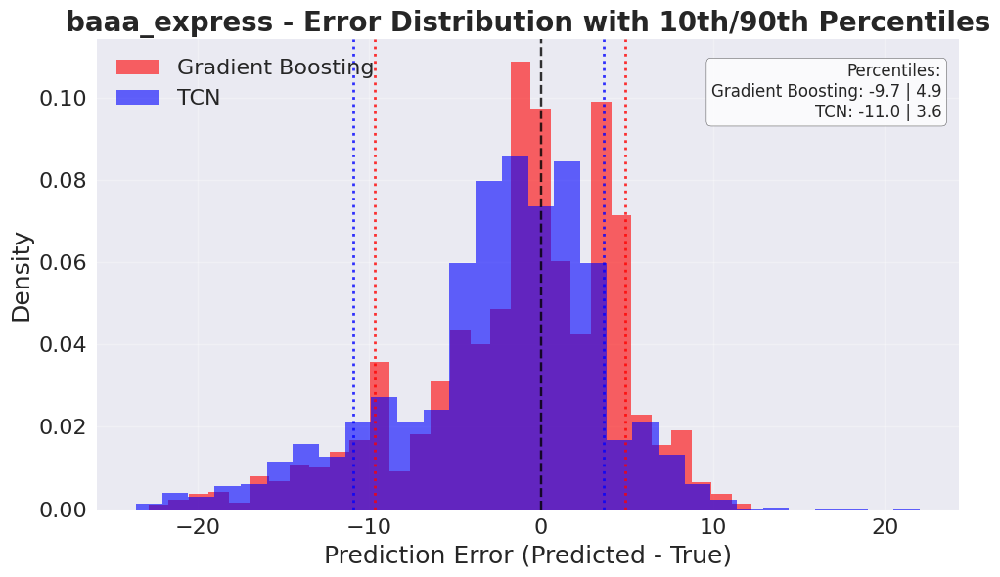

Plot saved as: visualizations/error_distribution_poseidon.svg


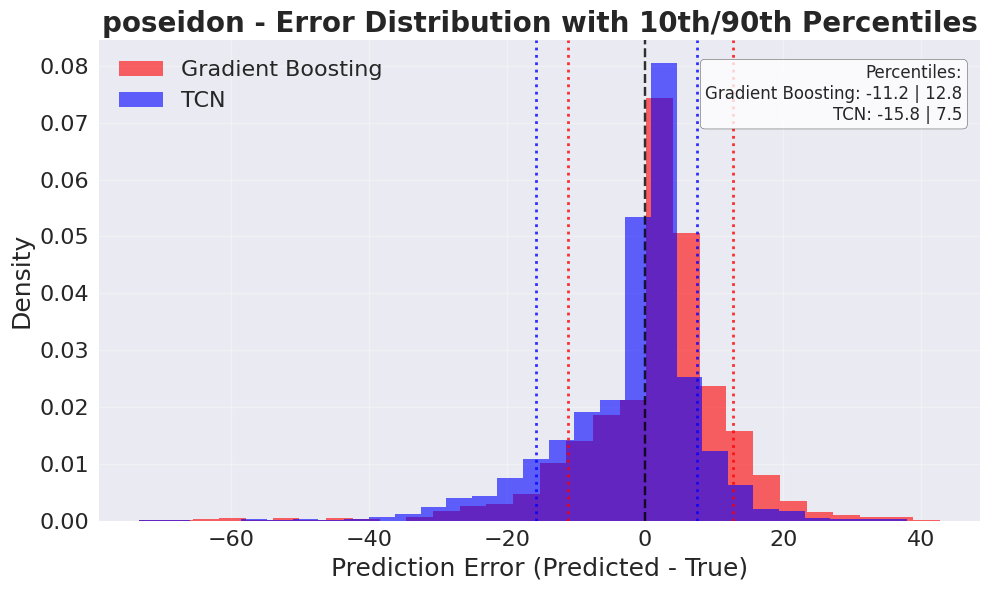

Plot saved as: visualizations/error_distribution_blue_fire_megacoaster.svg


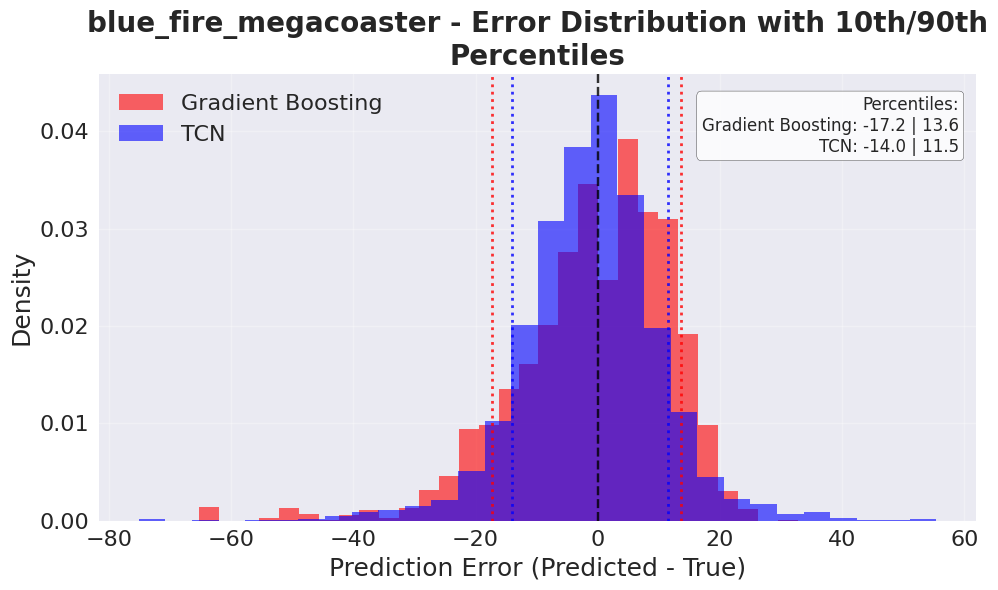

Plot saved as: visualizations/error_distribution_silver_star.svg


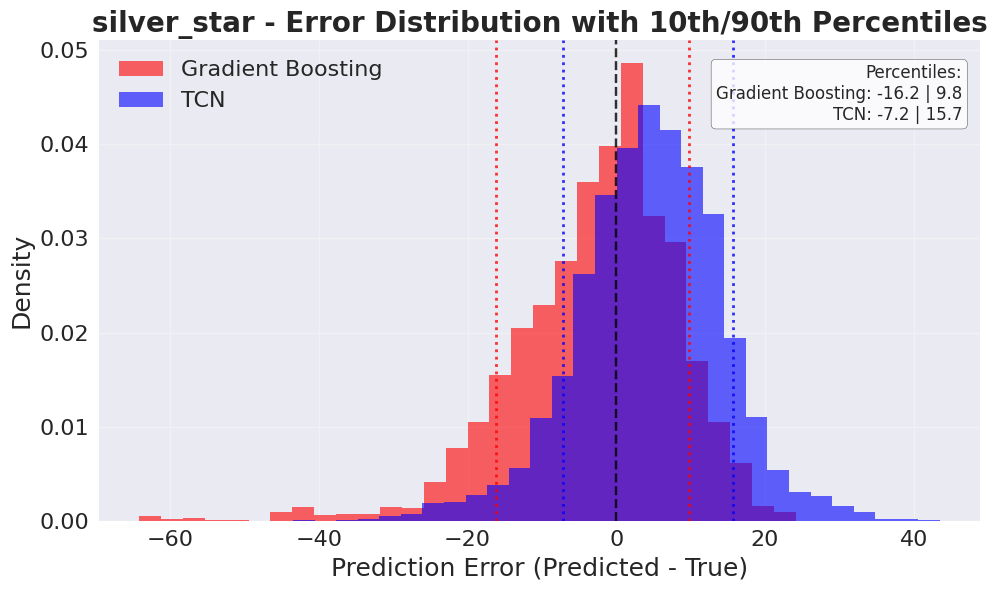

Plot saved as: visualizations/error_distribution_castello_dei_medici.svg


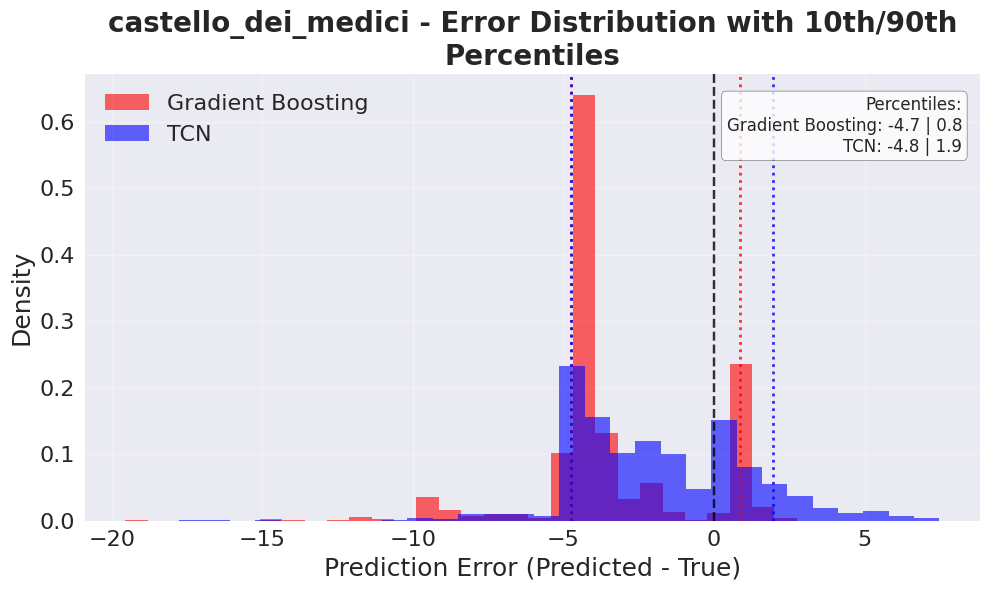

Plot saved as: visualizations/error_distribution_swiss_bob_run.svg


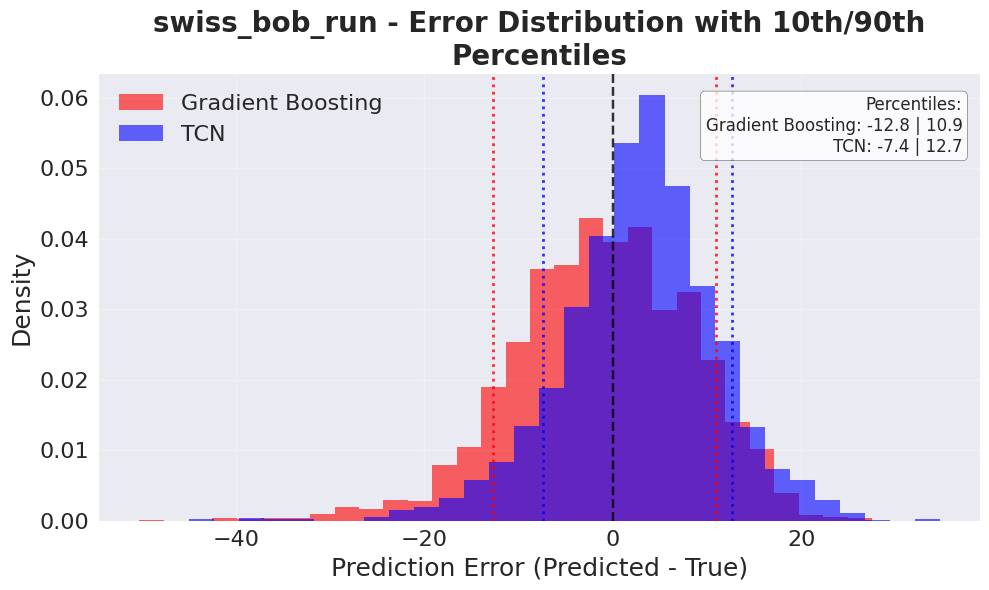

Plot saved as: visualizations/error_distribution_dancing_dingie.svg


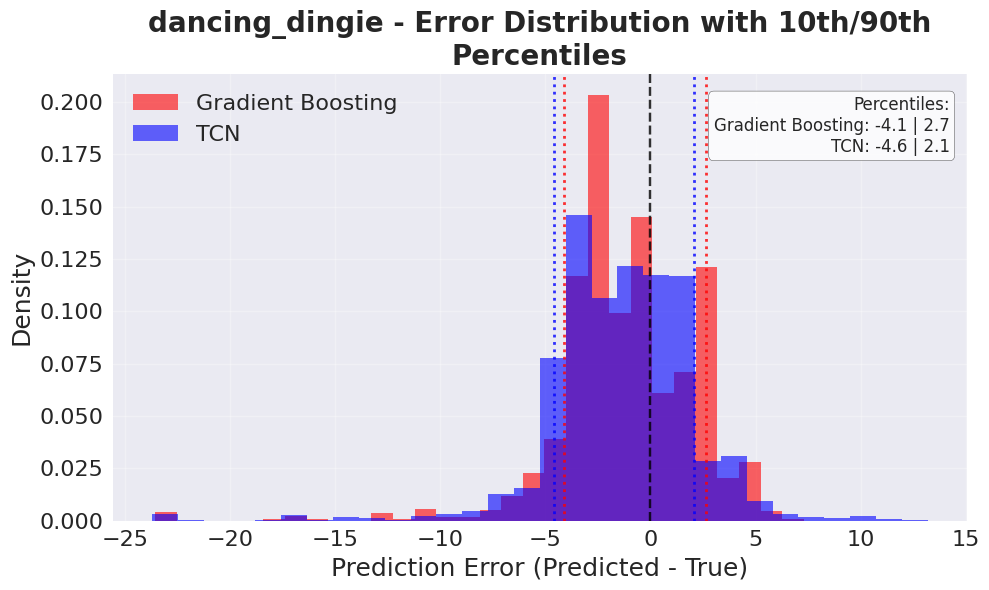

Plot saved as: visualizations/error_distribution_tirol_log_flume.svg


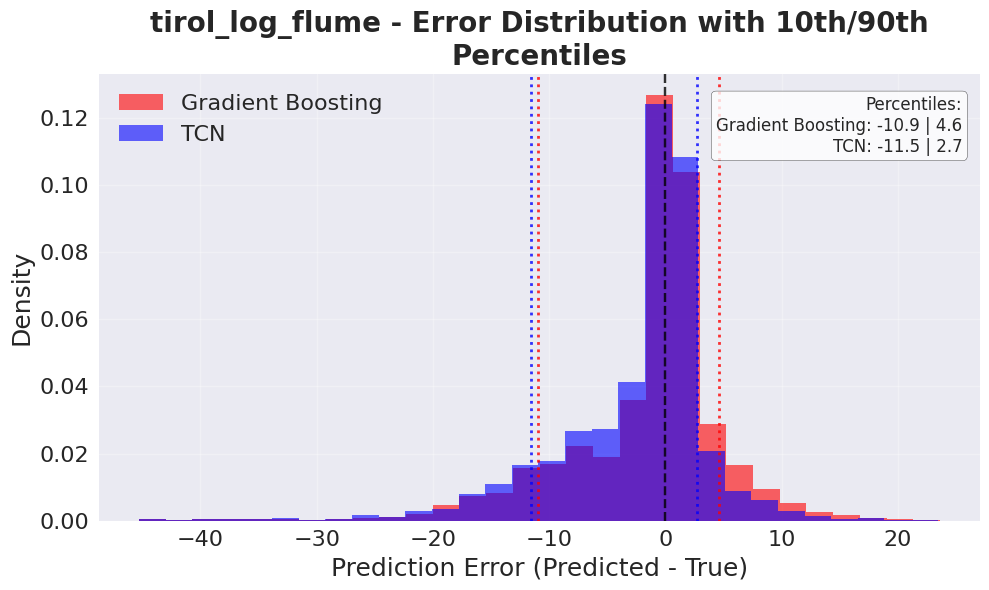

Plot saved as: visualizations/error_distribution_euromir.svg


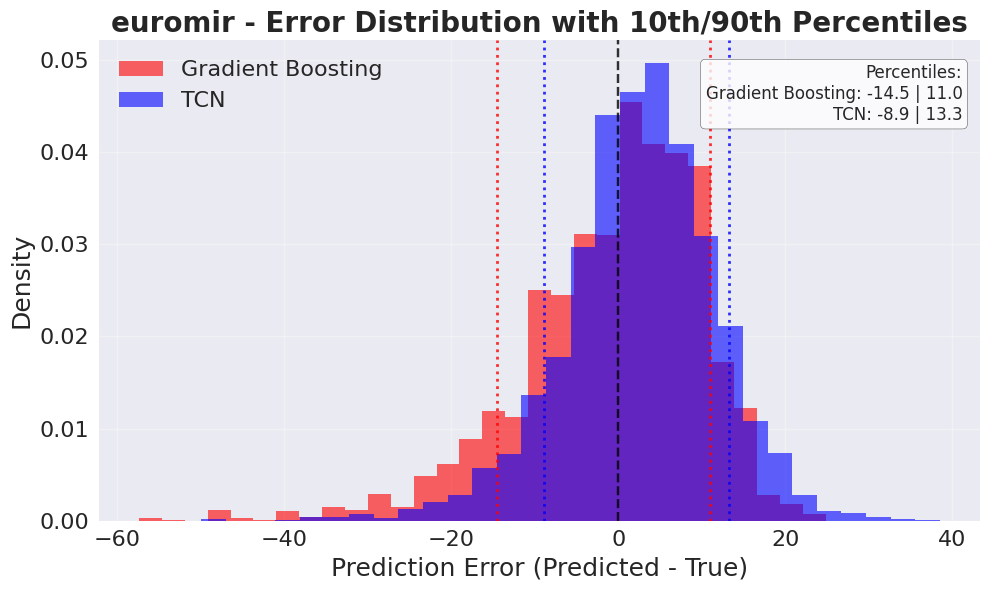

Plot saved as: visualizations/error_distribution_vienna_wave_swing__glckspilz.svg


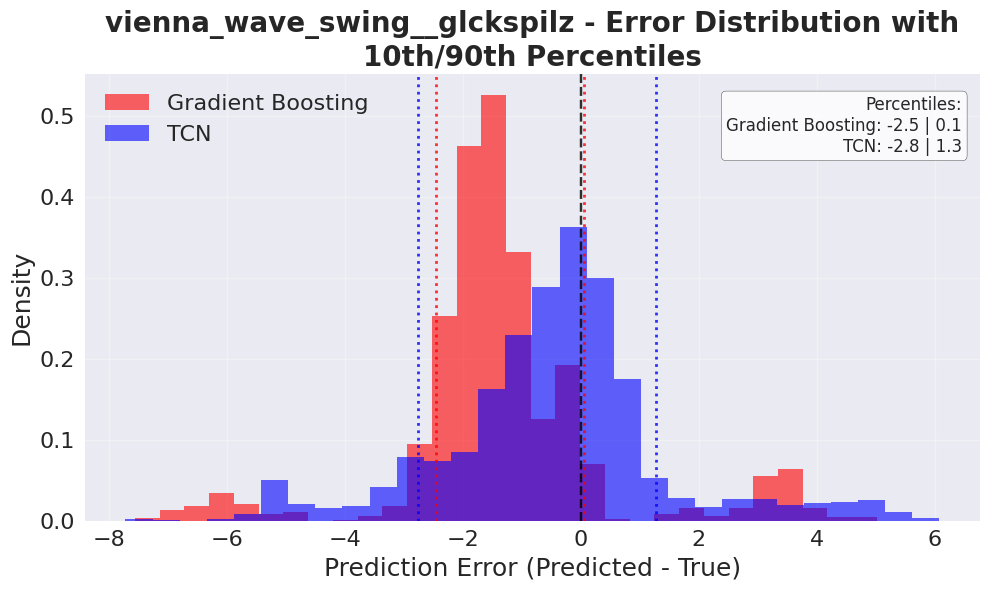

Plot saved as: visualizations/error_distribution_eurosat__cancan_coaster.svg


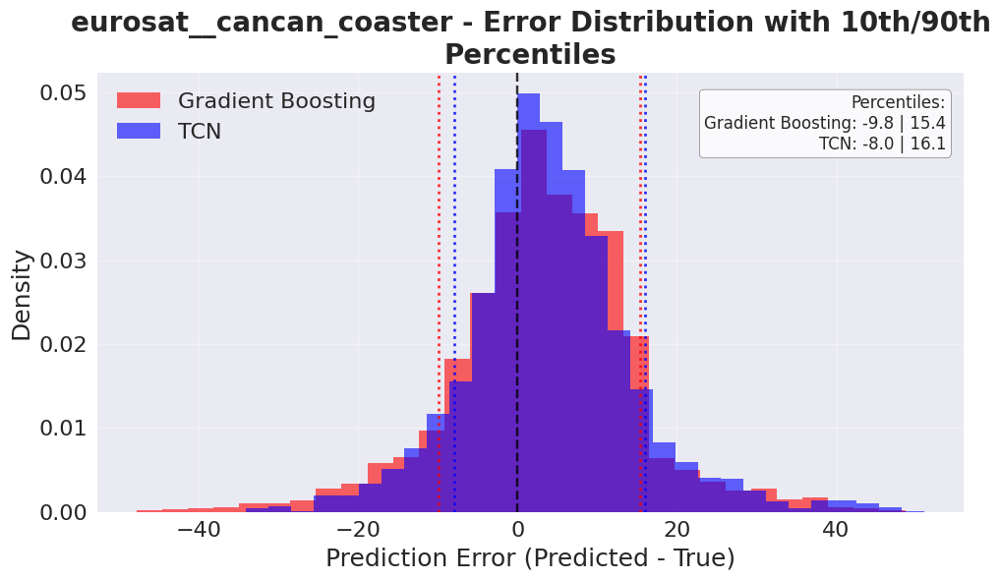

Plot saved as: visualizations/error_distribution_vindjammer.svg


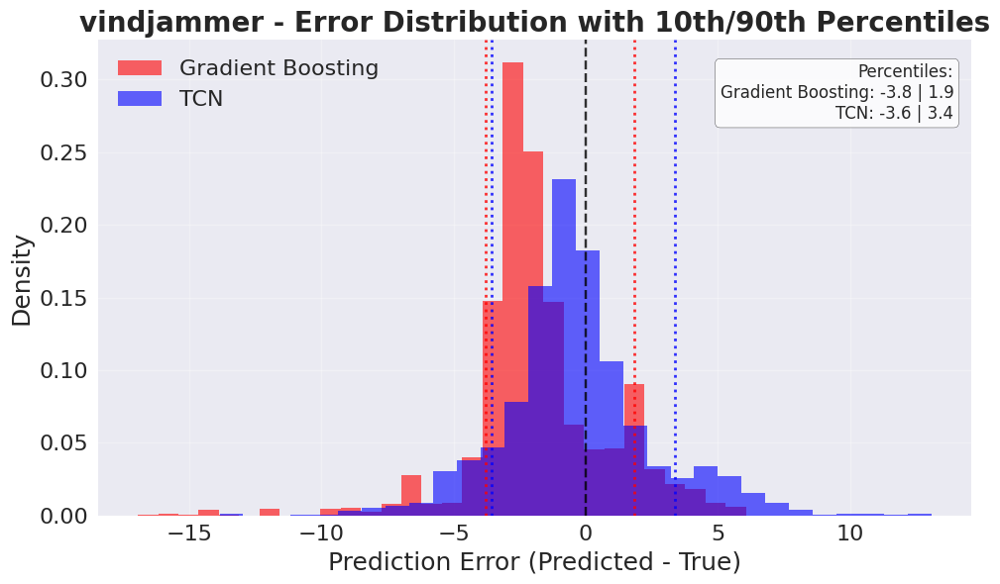

Plot saved as: visualizations/error_distribution_eurotower.svg


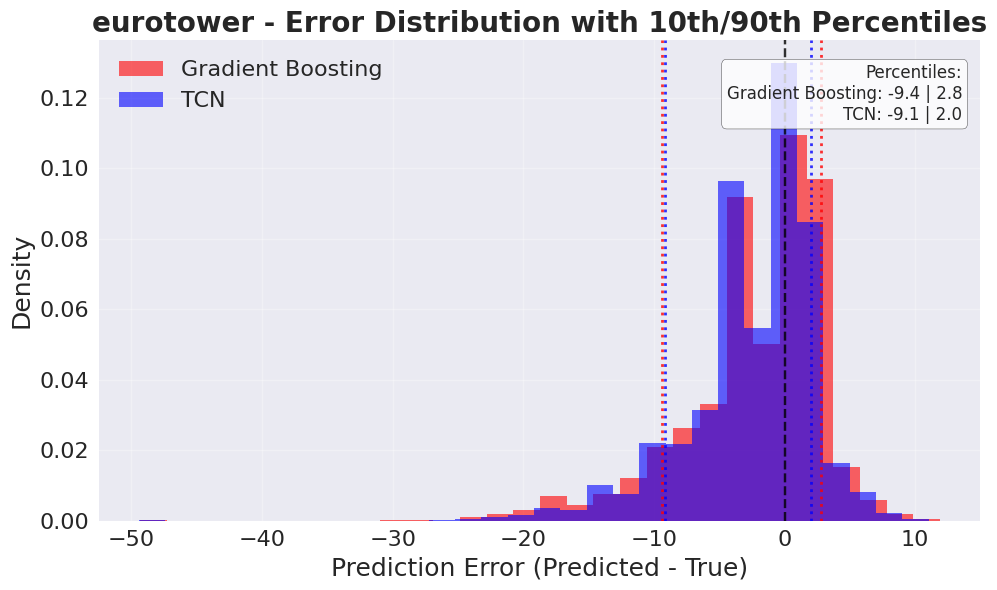

Plot saved as: visualizations/error_distribution_voletarium.svg


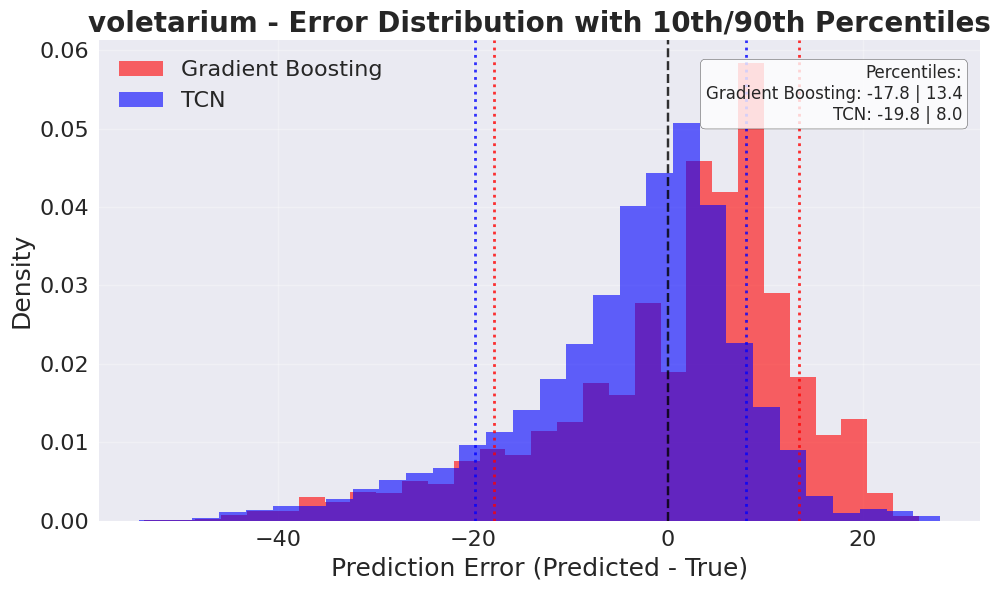

Plot saved as: visualizations/error_distribution_fjordrafting.svg


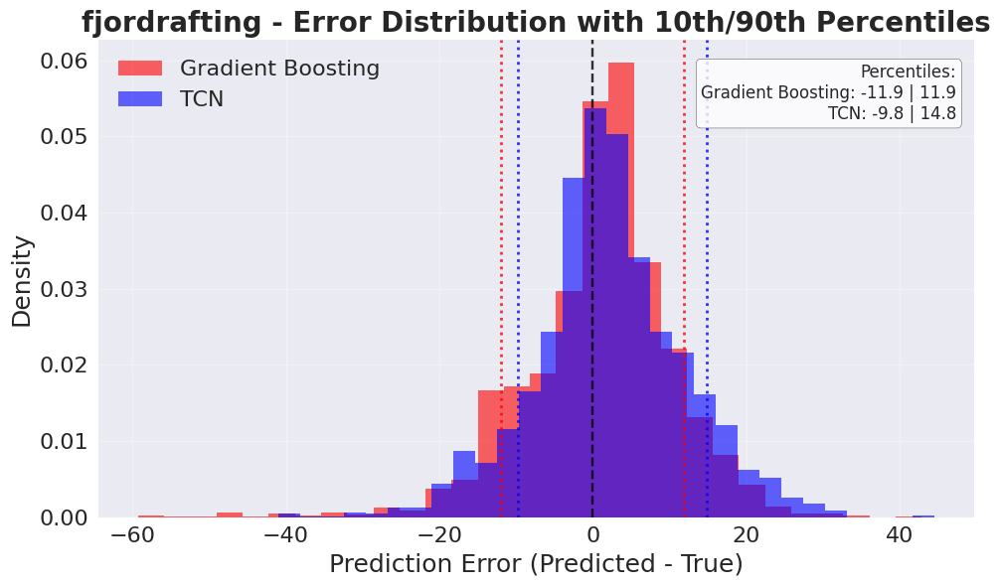

Plot saved as: visualizations/error_distribution_volo_da_vinci.svg


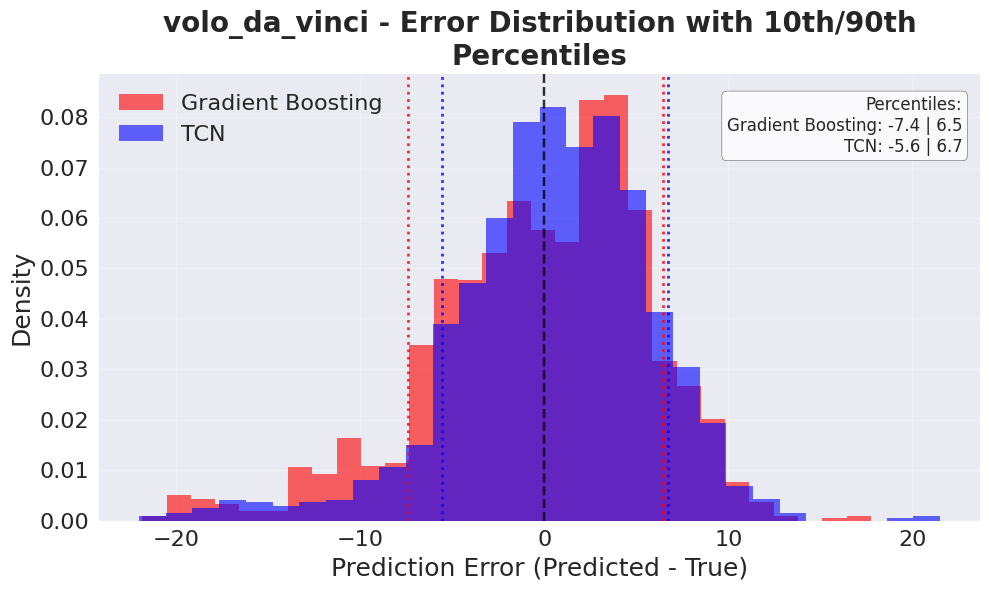

Plot saved as: visualizations/error_distribution_jim_button__journey_through_morrowland.svg


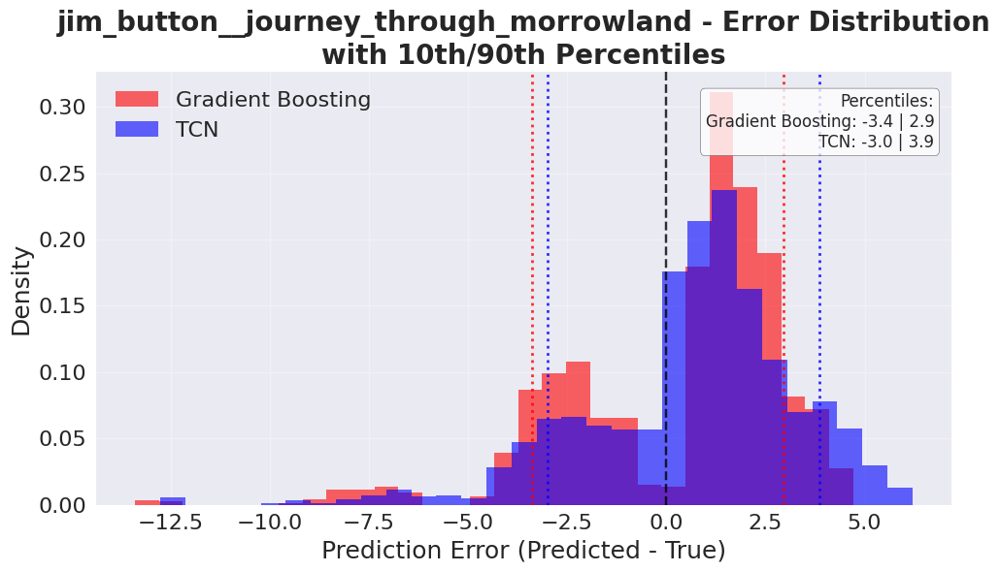

Plot saved as: visualizations/error_distribution_josefinas_magical_imperial_journey.svg


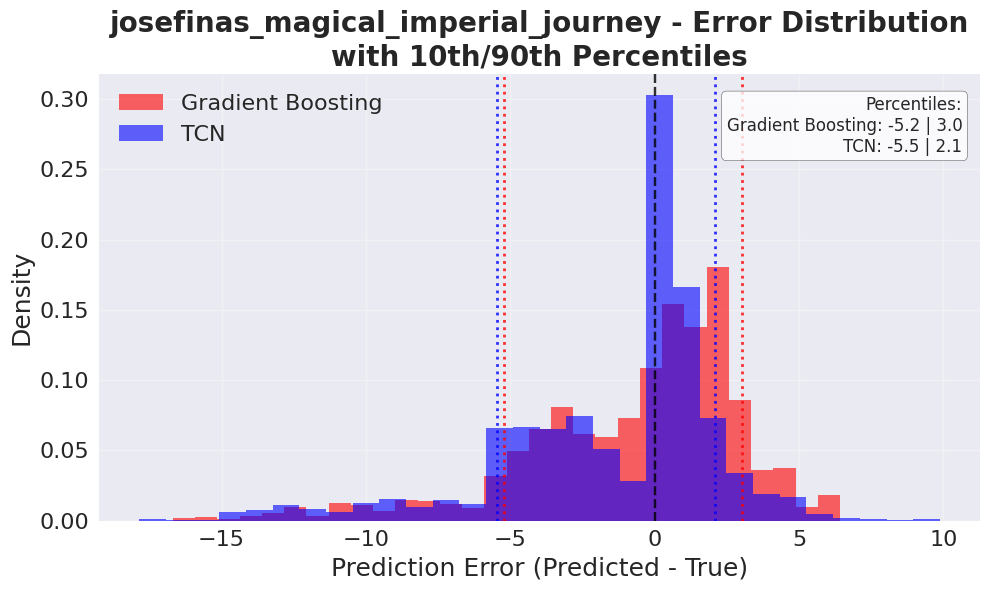

Plot saved as: visualizations/error_distribution_whale_adventures__northern_lights.svg


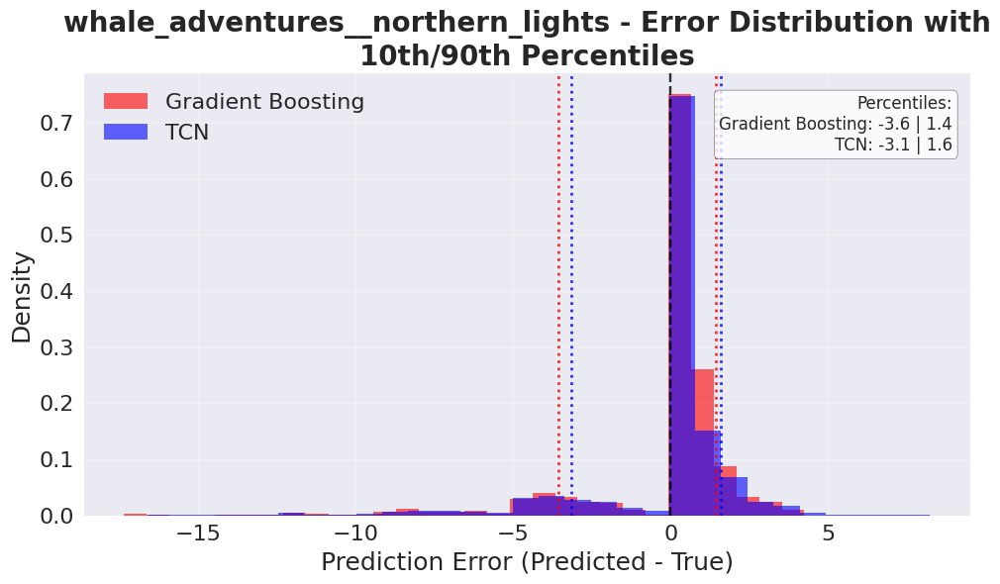

Plot saved as: visualizations/error_distribution_kolumbusjolle.svg


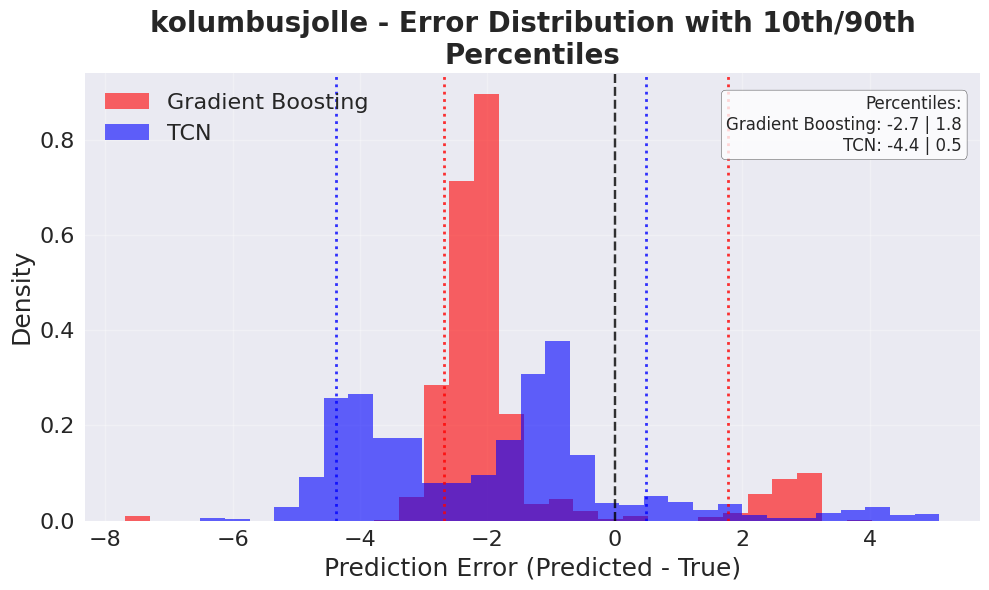

Plot saved as: visualizations/error_distribution_combined.svg


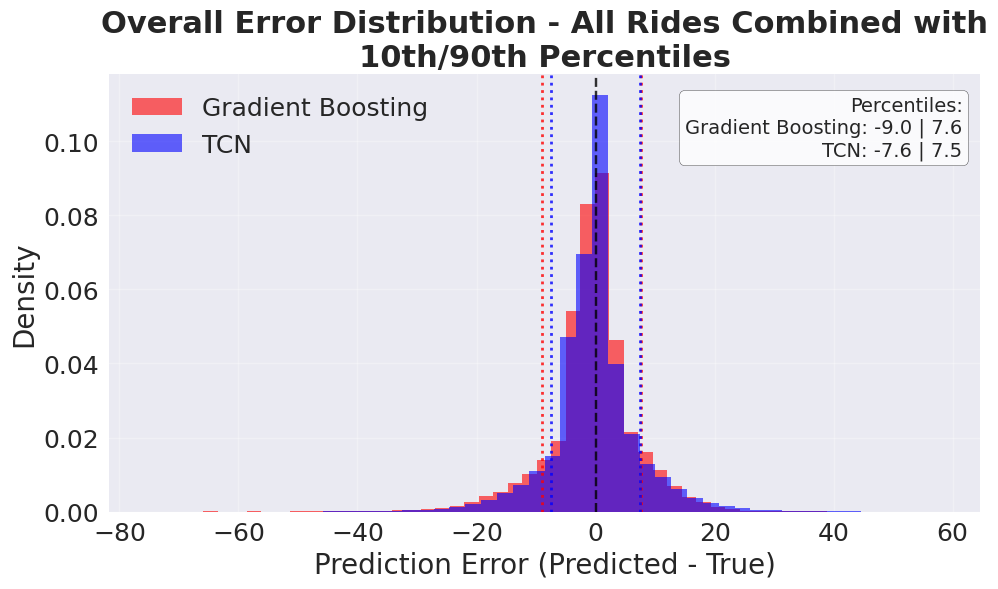


6. Absolute vs Relative Errors:
Plot saved as: visualizations/absolute_error_distribution.svg


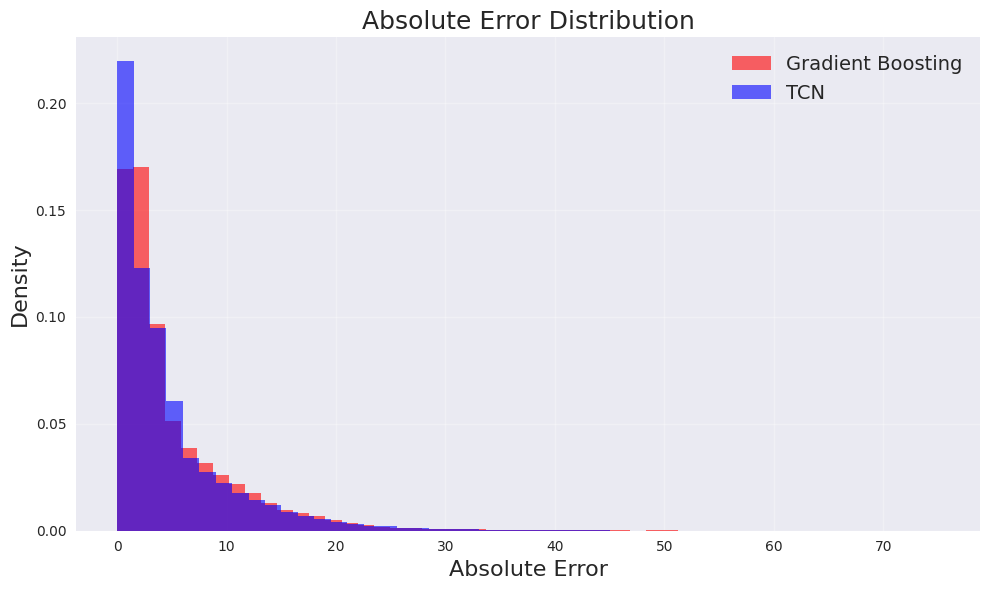

Plot saved as: visualizations/relative_error_distribution.svg


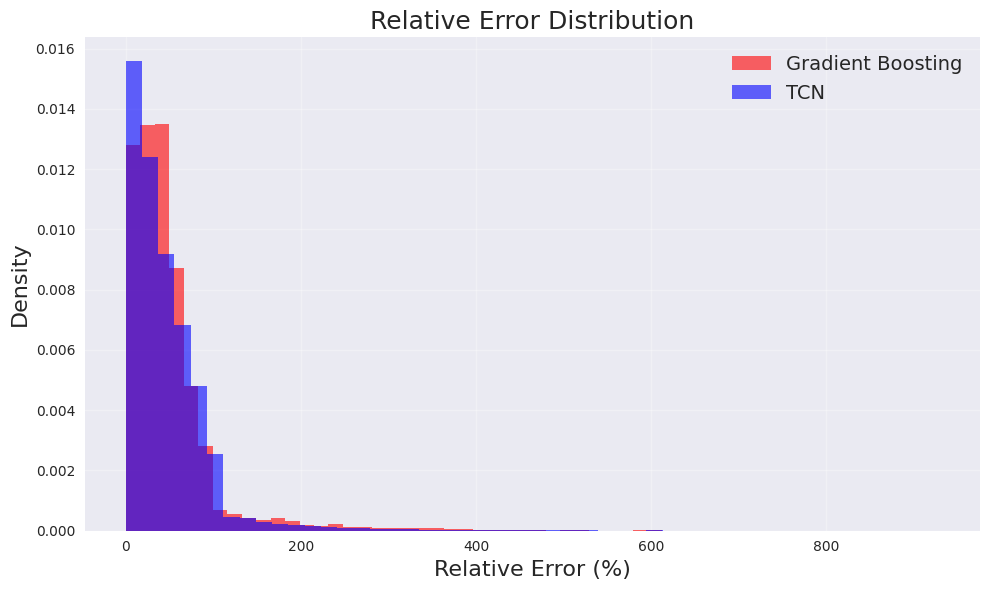

Plot saved as: visualizations/error_vs_true_value.svg


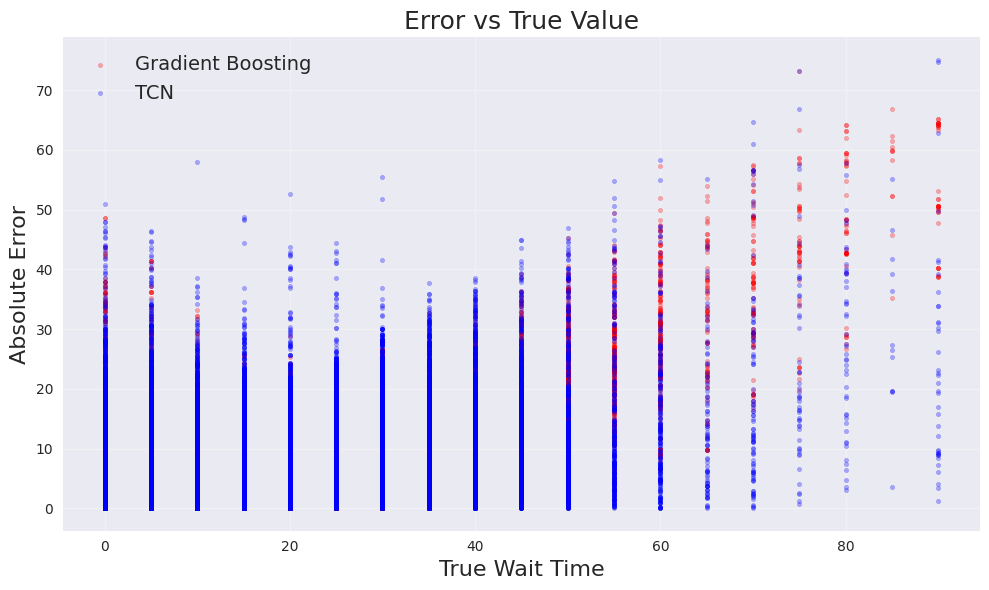


7. Residual Analysis:
Plot saved as: visualizations/residual_analysis.svg


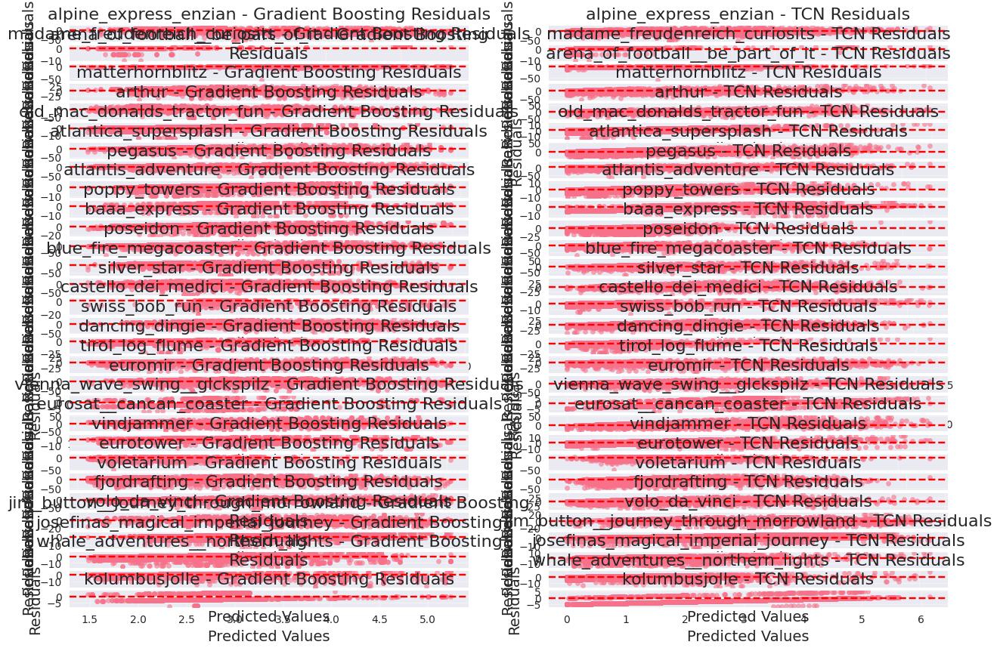


8. Temporal Analysis:
Plot saved as: visualizations/temporal_analysis_alpine_express_enzian.svg


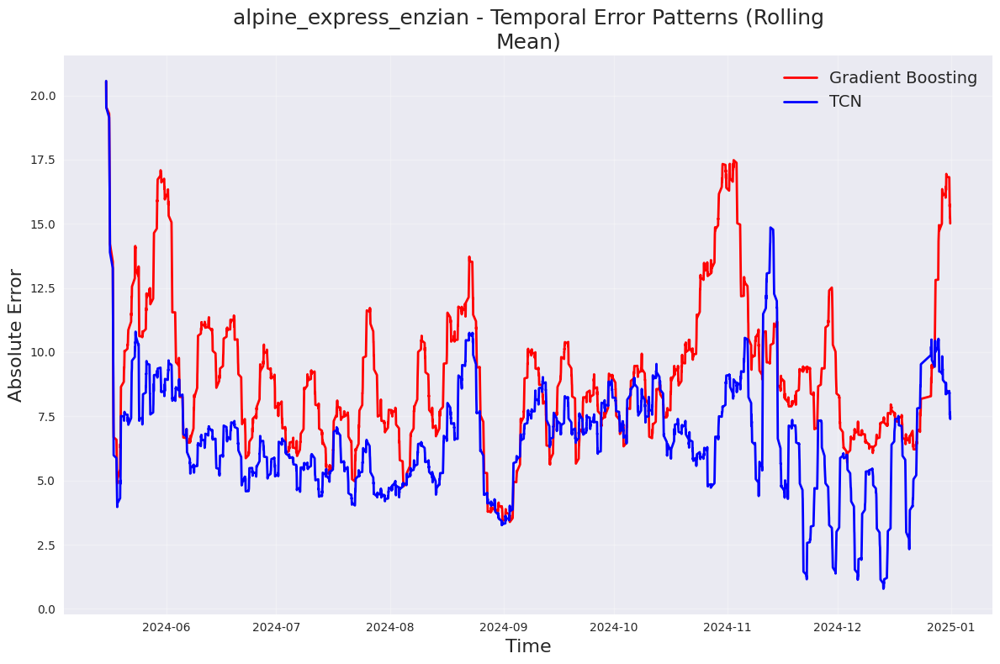

Plot saved as: visualizations/temporal_analysis_madame_freudenreich_curiosits.svg


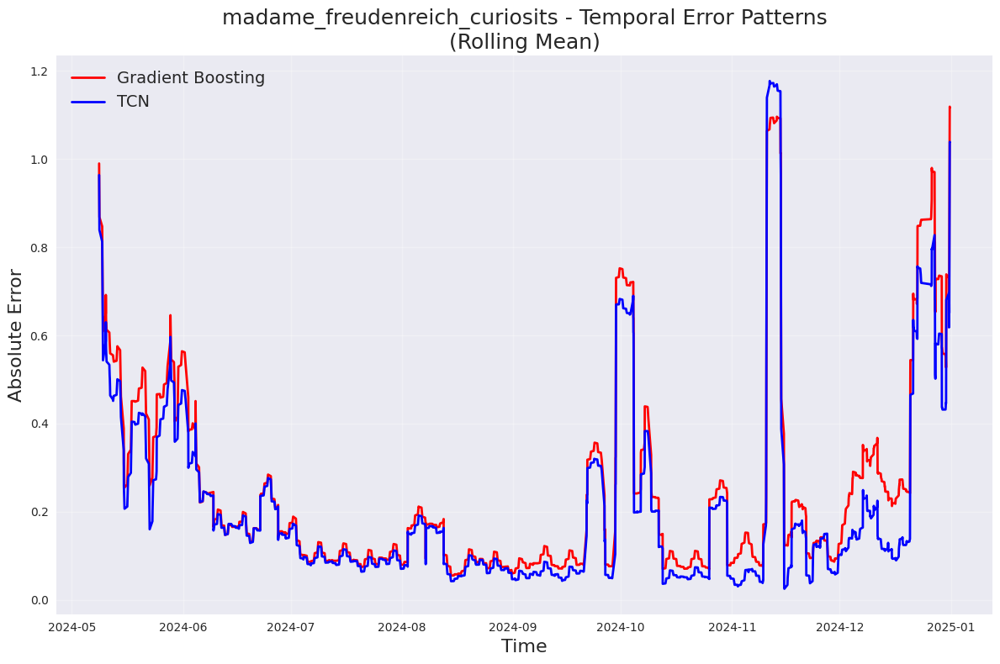

Plot saved as: visualizations/temporal_analysis_arena_of_football__be_part_of_it.svg


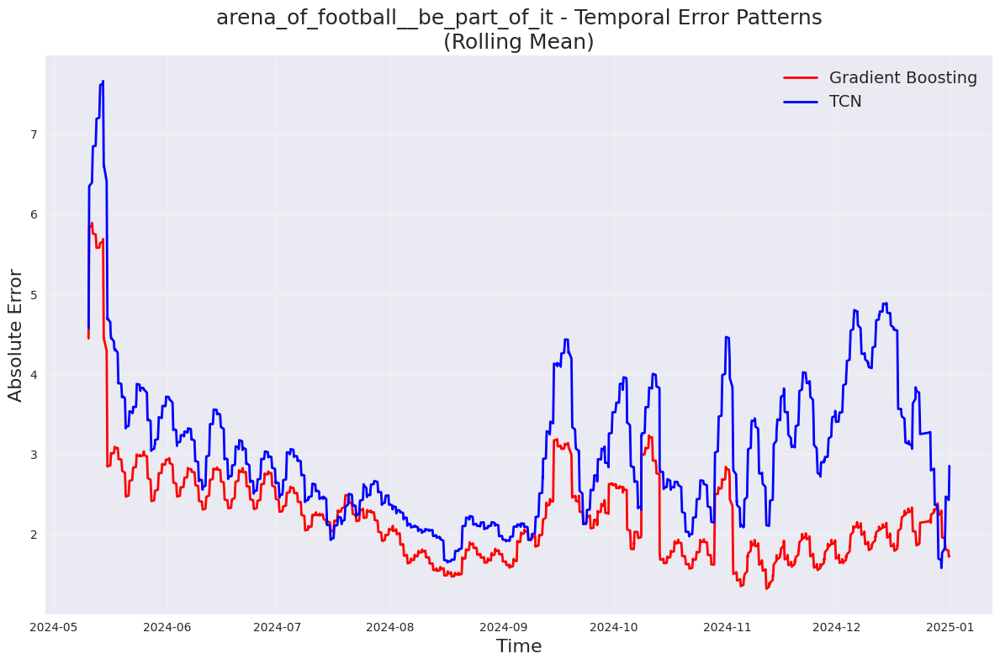

Plot saved as: visualizations/temporal_analysis_matterhornblitz.svg


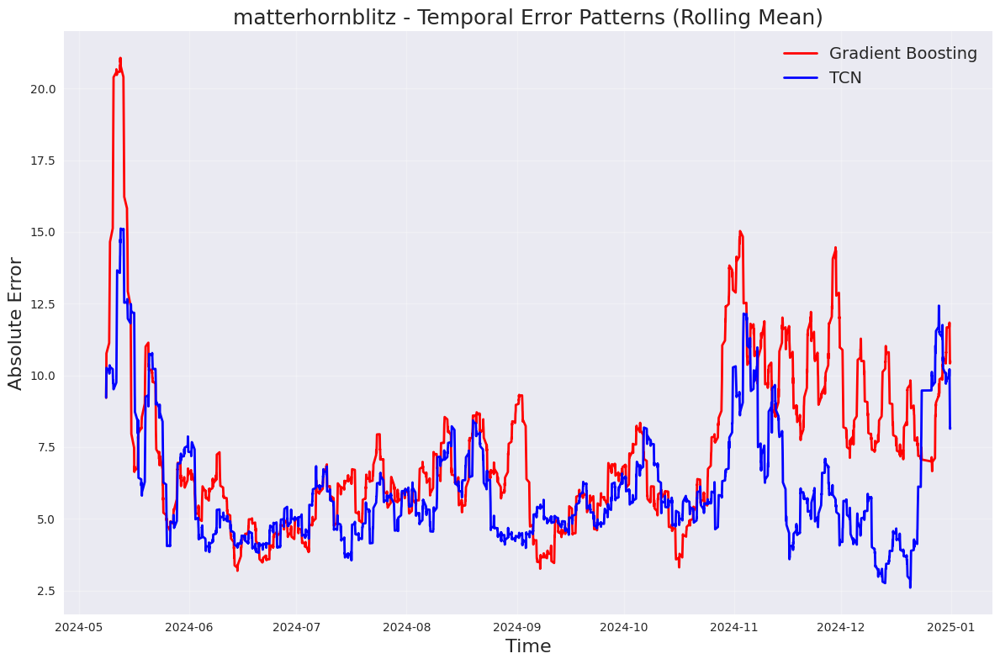

Plot saved as: visualizations/temporal_analysis_arthur.svg


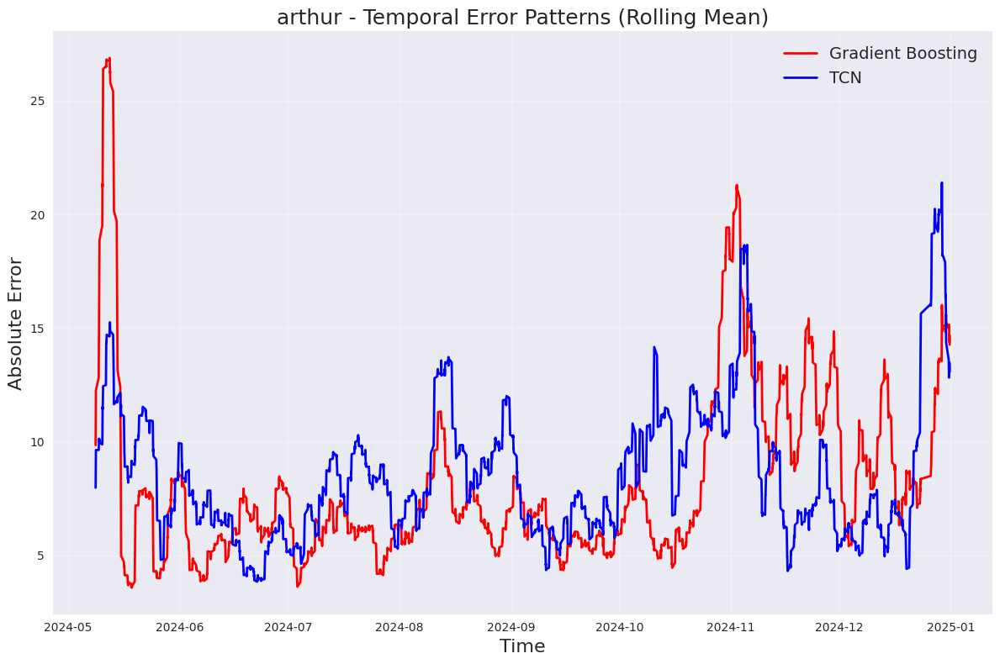

Plot saved as: visualizations/temporal_analysis_old_mac_donalds_tractor_fun.svg


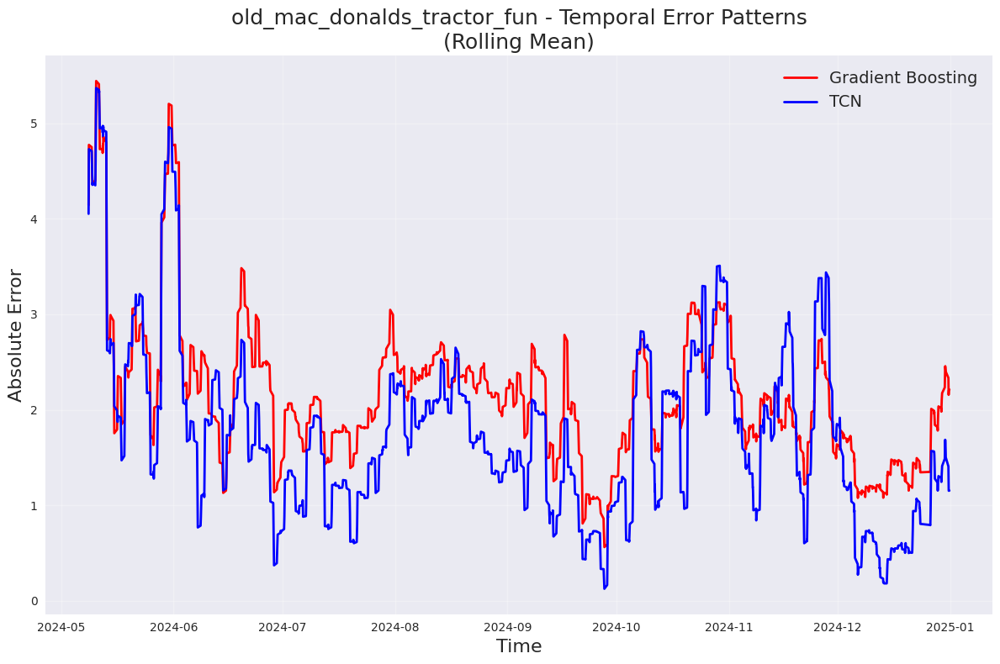

Plot saved as: visualizations/temporal_analysis_atlantica_supersplash.svg


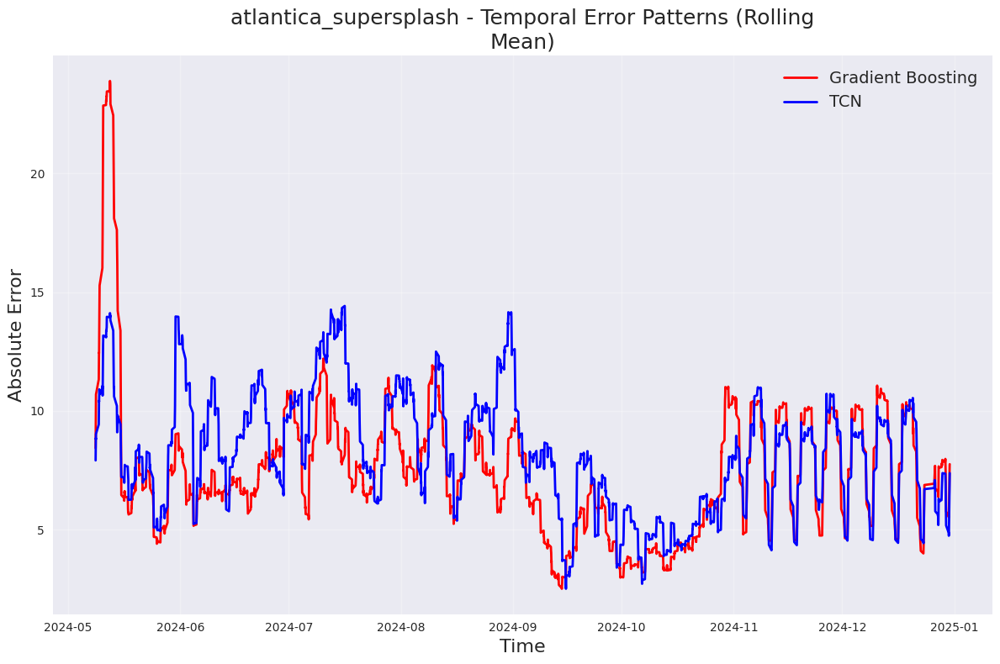

Plot saved as: visualizations/temporal_analysis_pegasus.svg


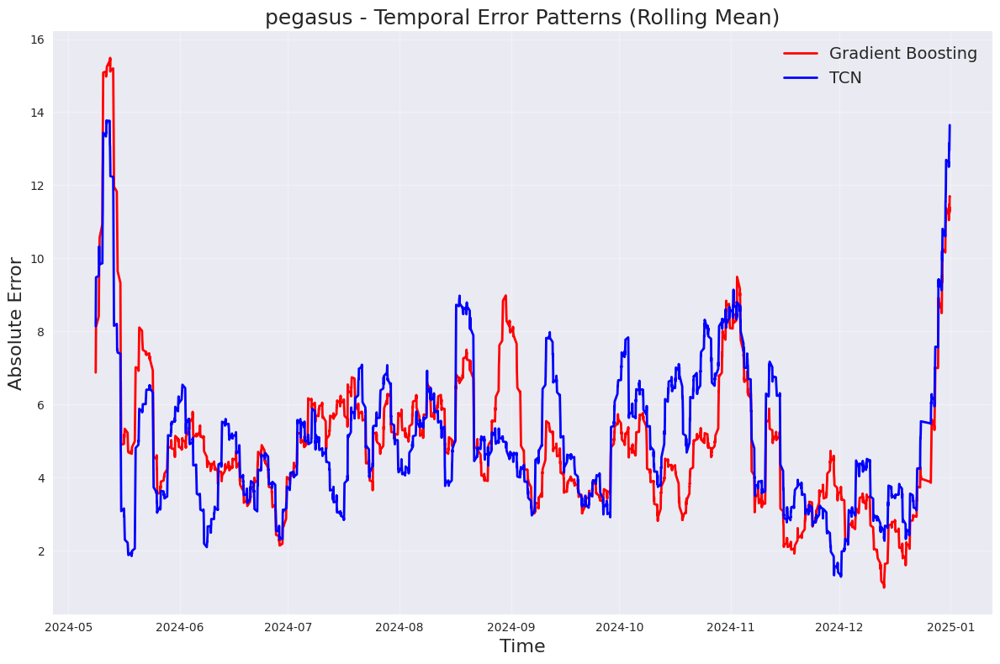

Plot saved as: visualizations/temporal_analysis_atlantis_adventure.svg


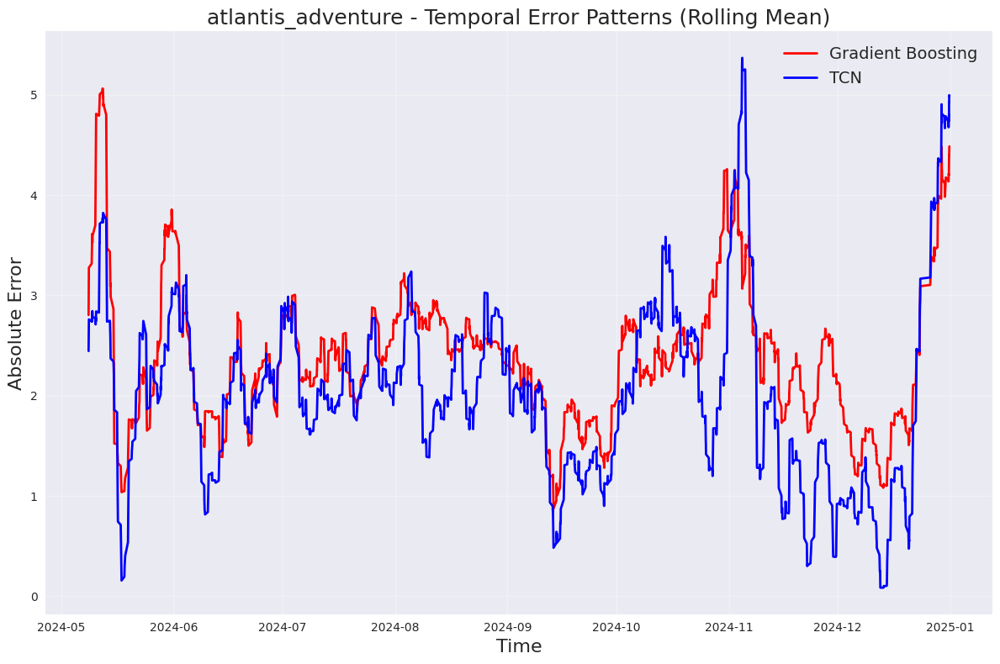

Plot saved as: visualizations/temporal_analysis_poppy_towers.svg


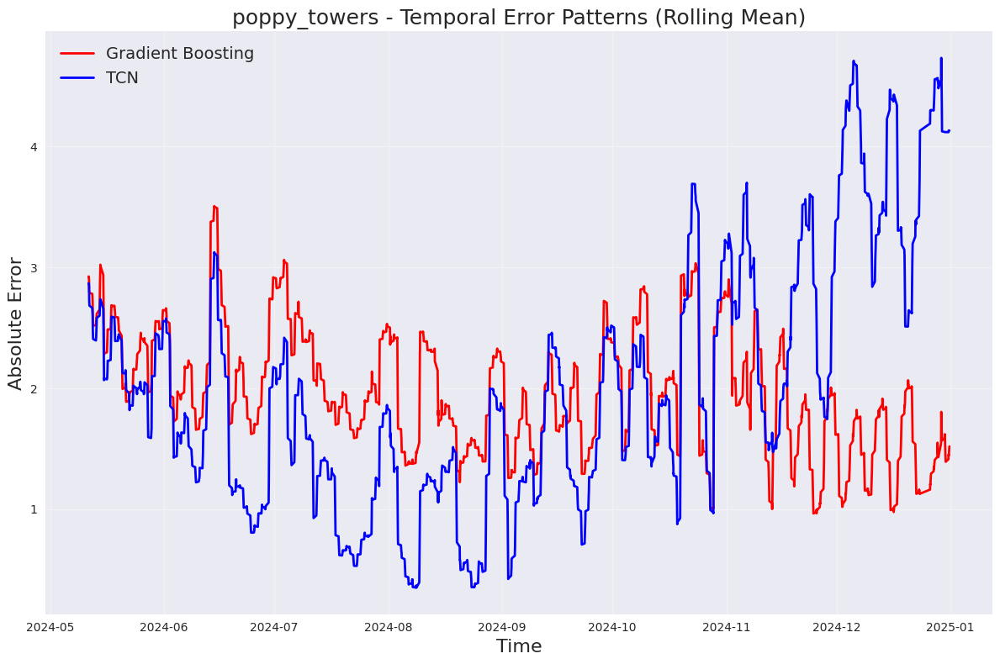

Plot saved as: visualizations/temporal_analysis_baaa_express.svg


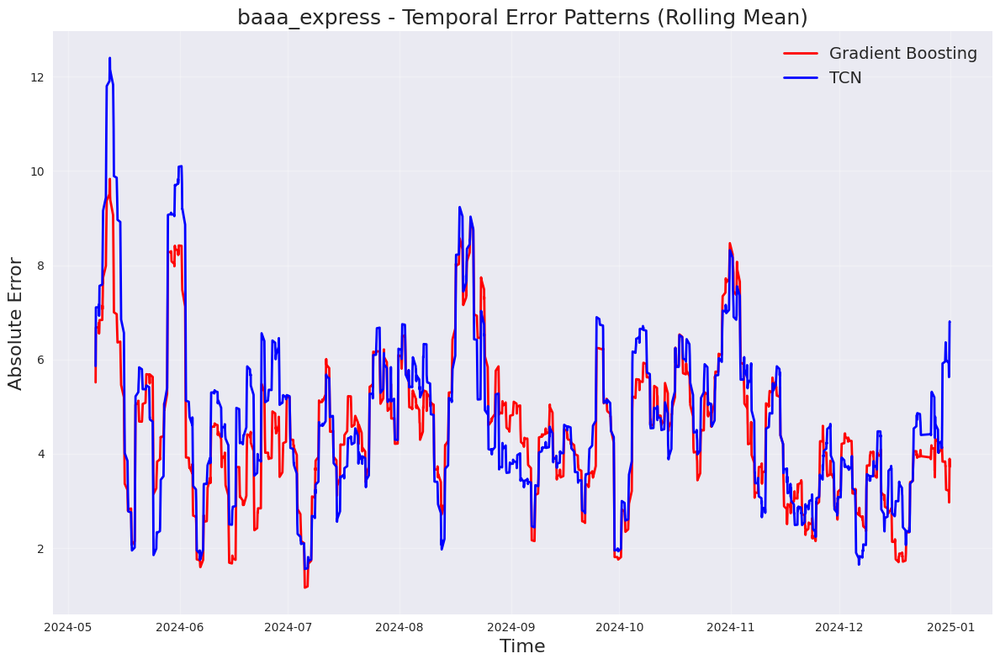

Plot saved as: visualizations/temporal_analysis_poseidon.svg


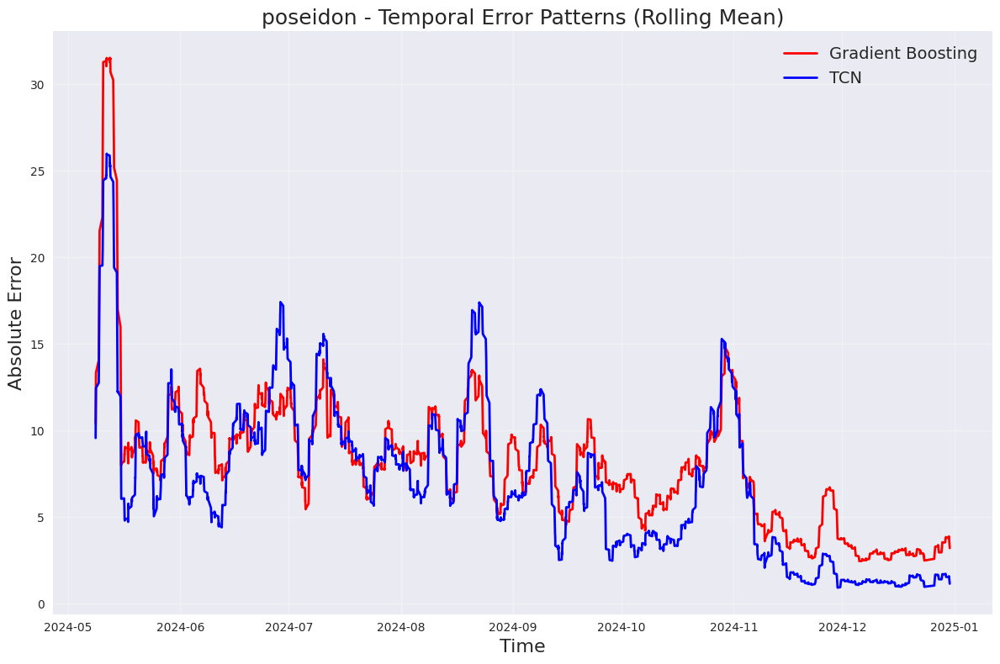

Plot saved as: visualizations/temporal_analysis_blue_fire_megacoaster.svg


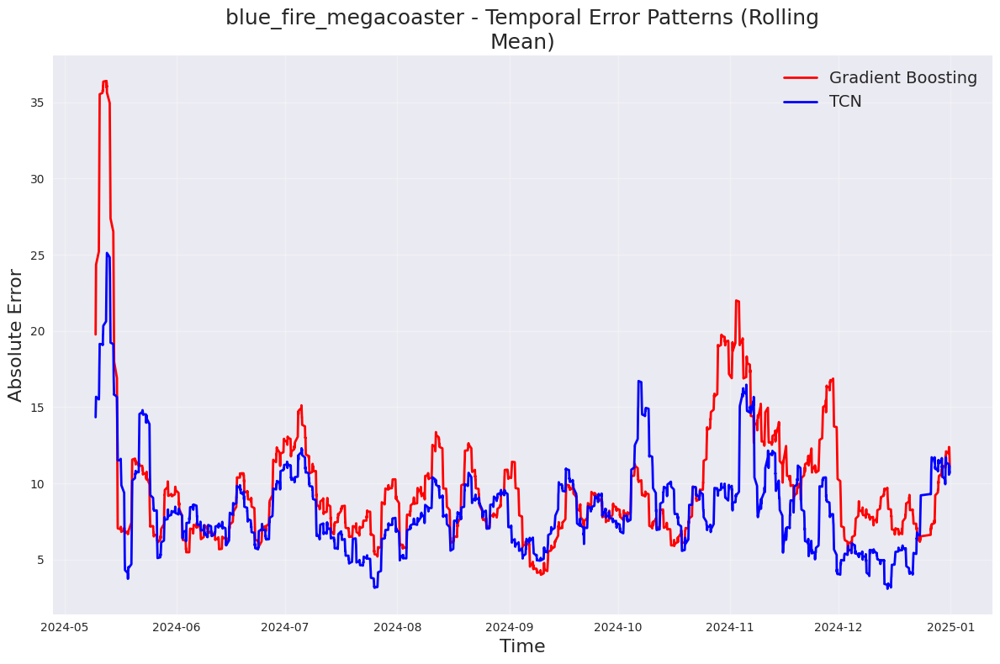

Plot saved as: visualizations/temporal_analysis_silver_star.svg


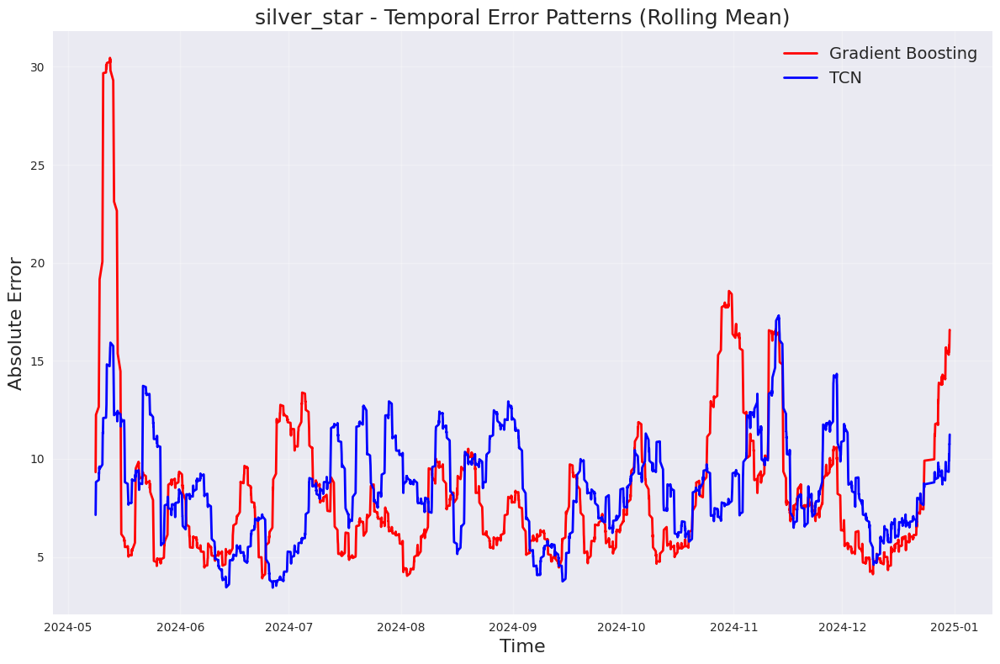

Plot saved as: visualizations/temporal_analysis_castello_dei_medici.svg


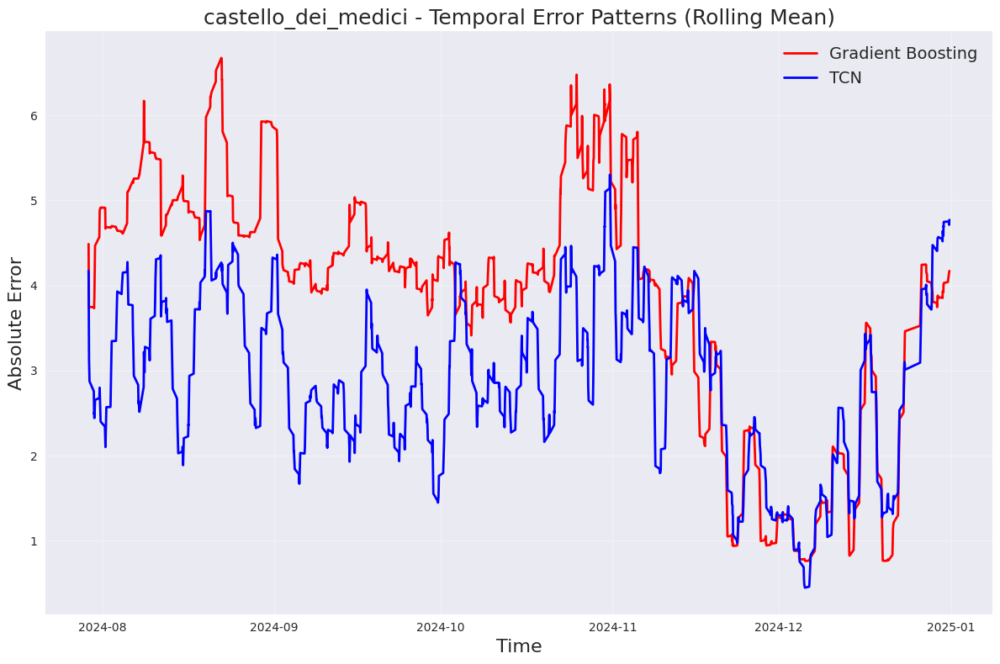

Plot saved as: visualizations/temporal_analysis_swiss_bob_run.svg


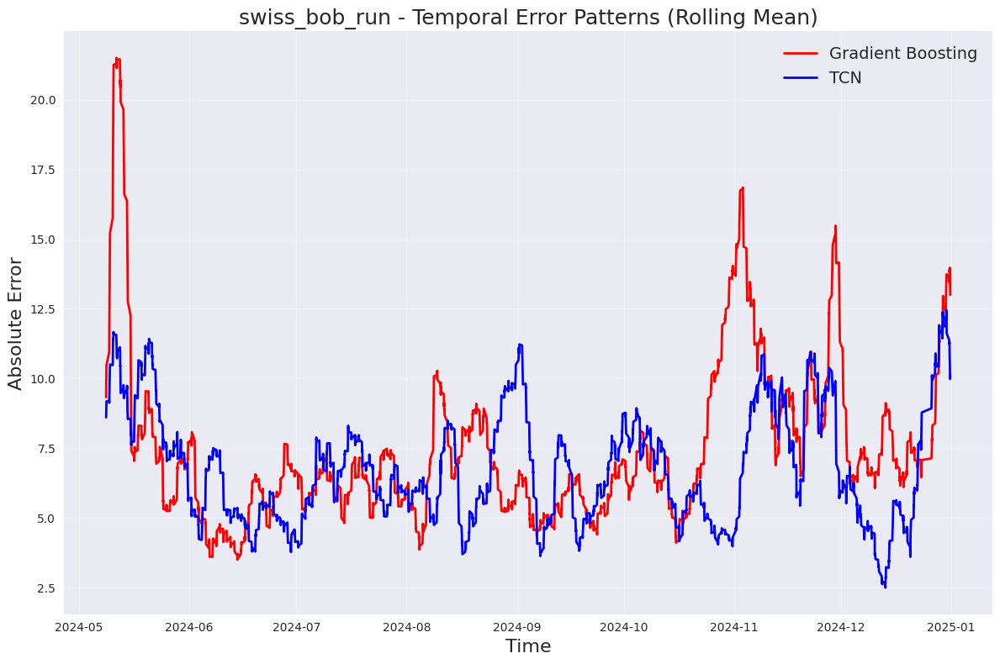

Plot saved as: visualizations/temporal_analysis_dancing_dingie.svg


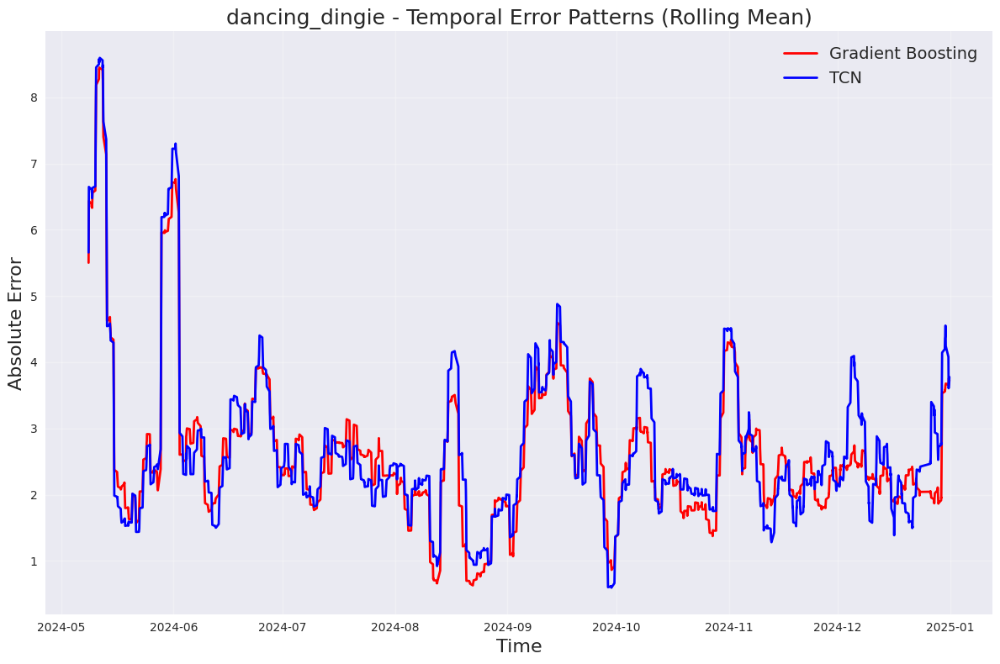

Plot saved as: visualizations/temporal_analysis_tirol_log_flume.svg


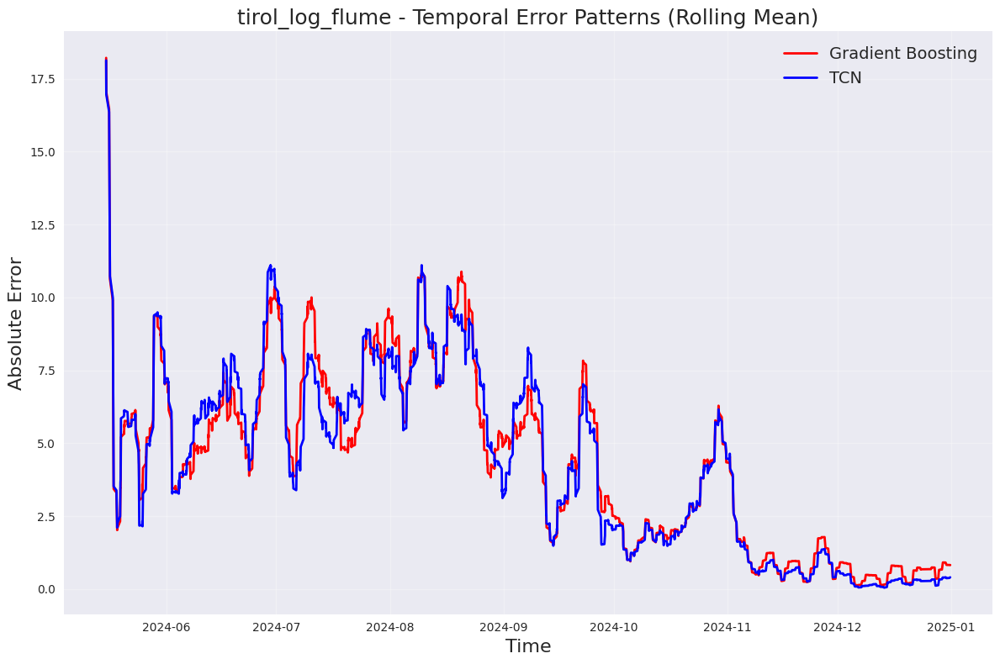

Plot saved as: visualizations/temporal_analysis_euromir.svg


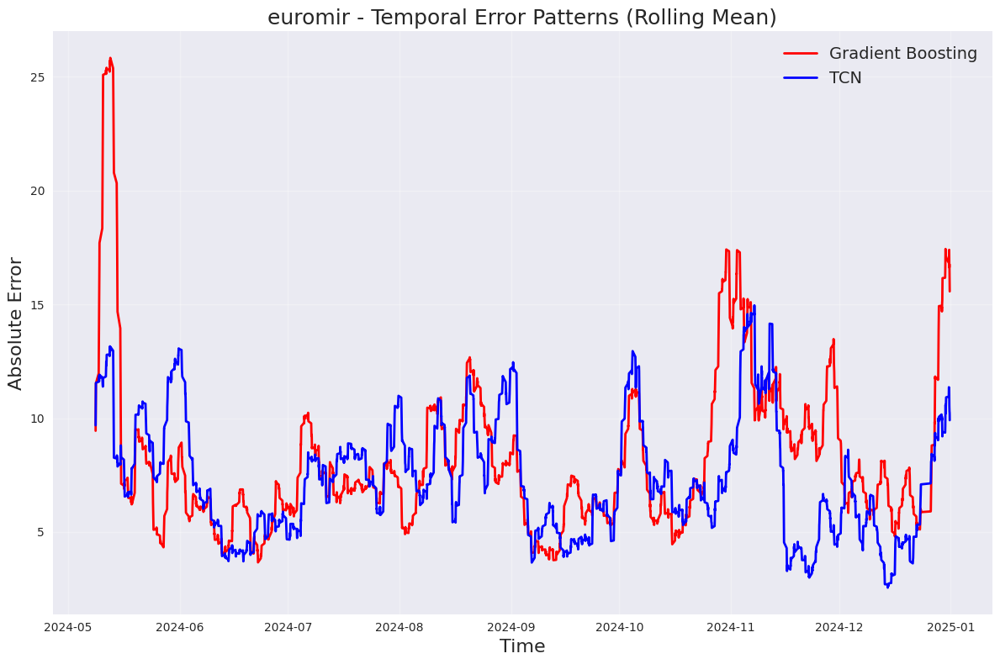

Plot saved as: visualizations/temporal_analysis_vienna_wave_swing__glckspilz.svg


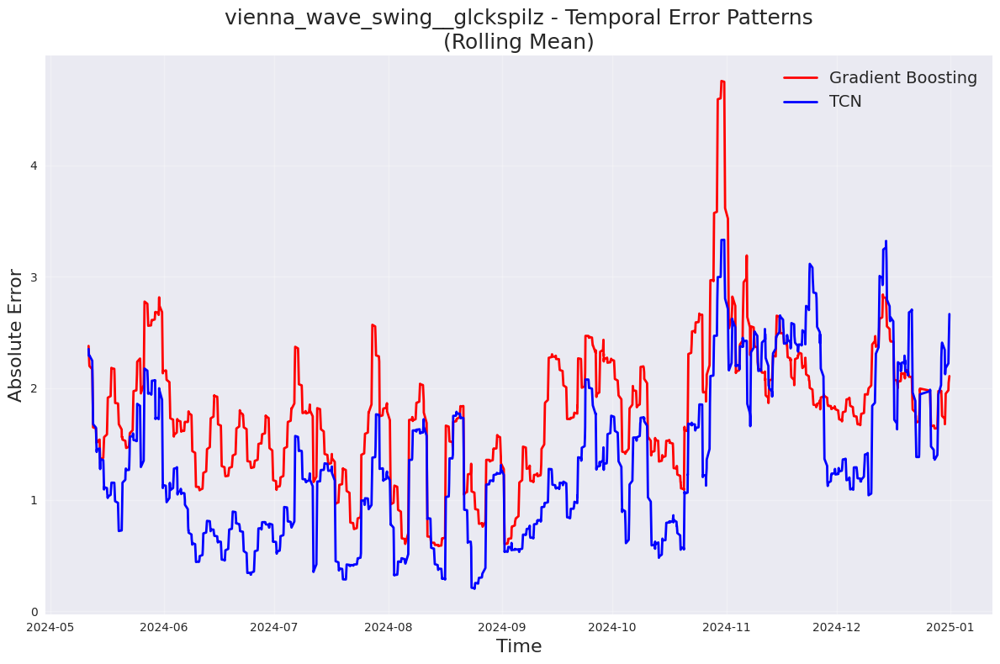

Plot saved as: visualizations/temporal_analysis_eurosat__cancan_coaster.svg


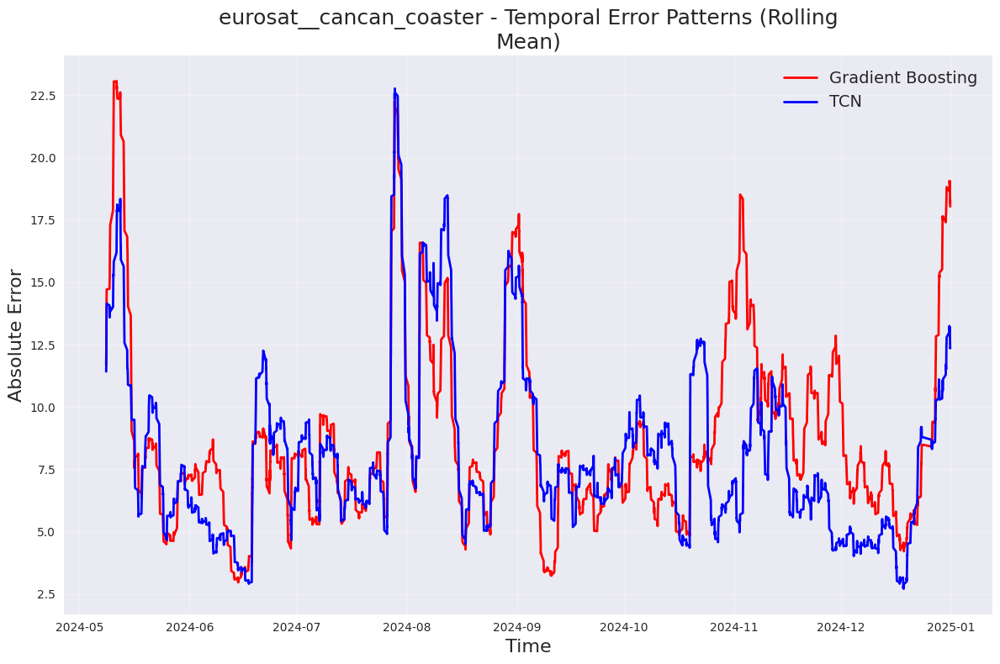

Plot saved as: visualizations/temporal_analysis_vindjammer.svg


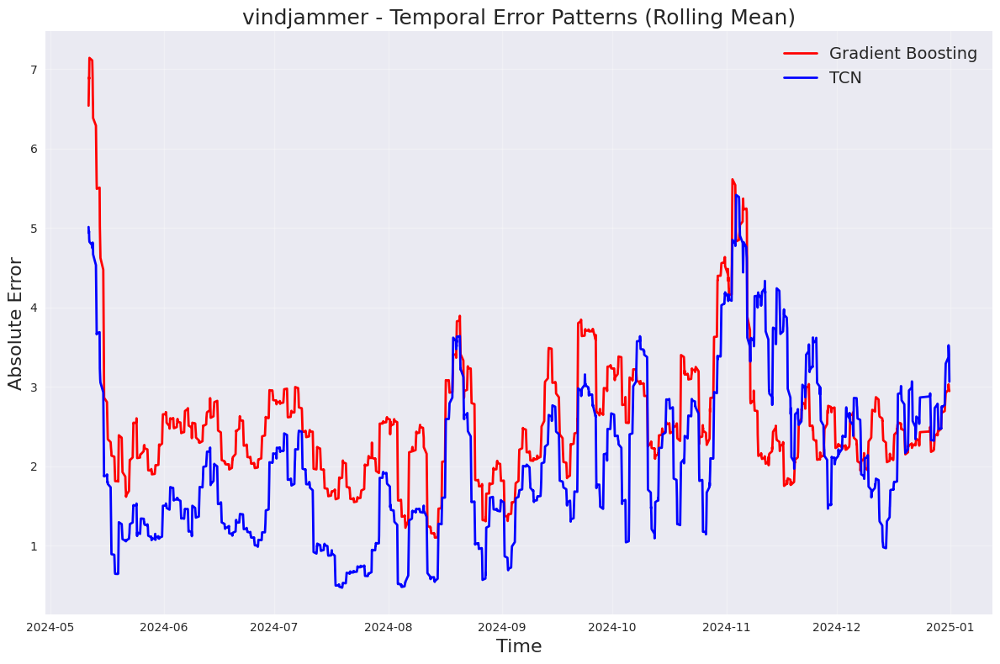

Plot saved as: visualizations/temporal_analysis_eurotower.svg


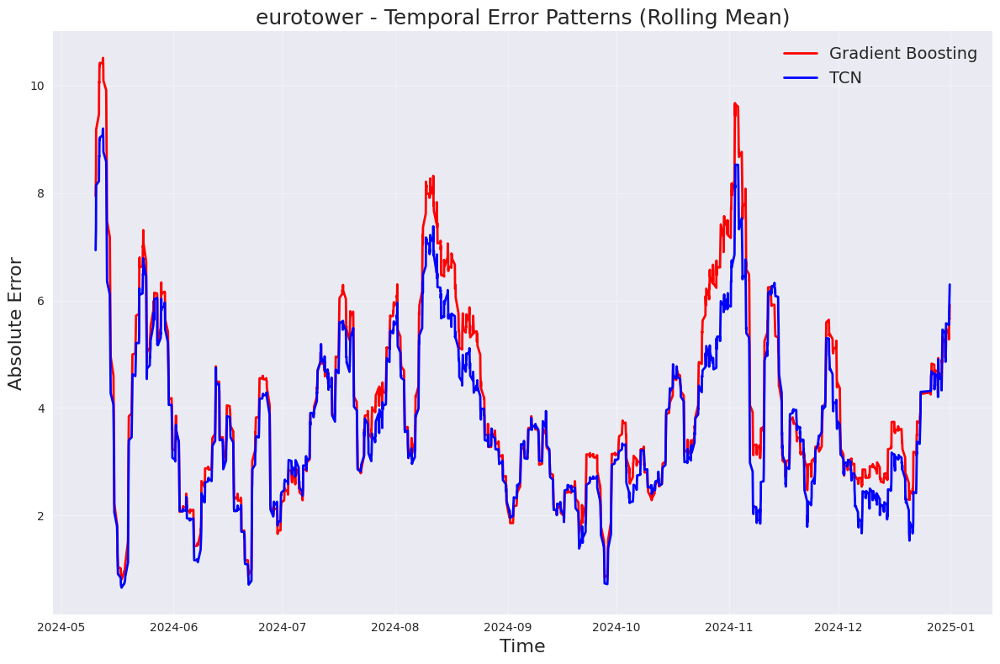

Plot saved as: visualizations/temporal_analysis_voletarium.svg


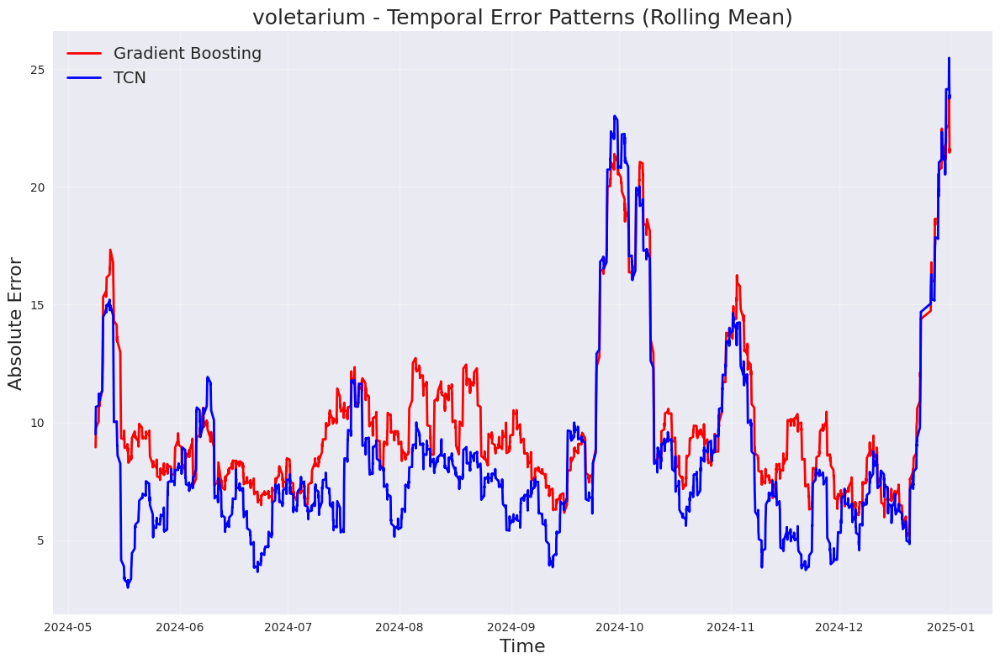

Plot saved as: visualizations/temporal_analysis_fjordrafting.svg


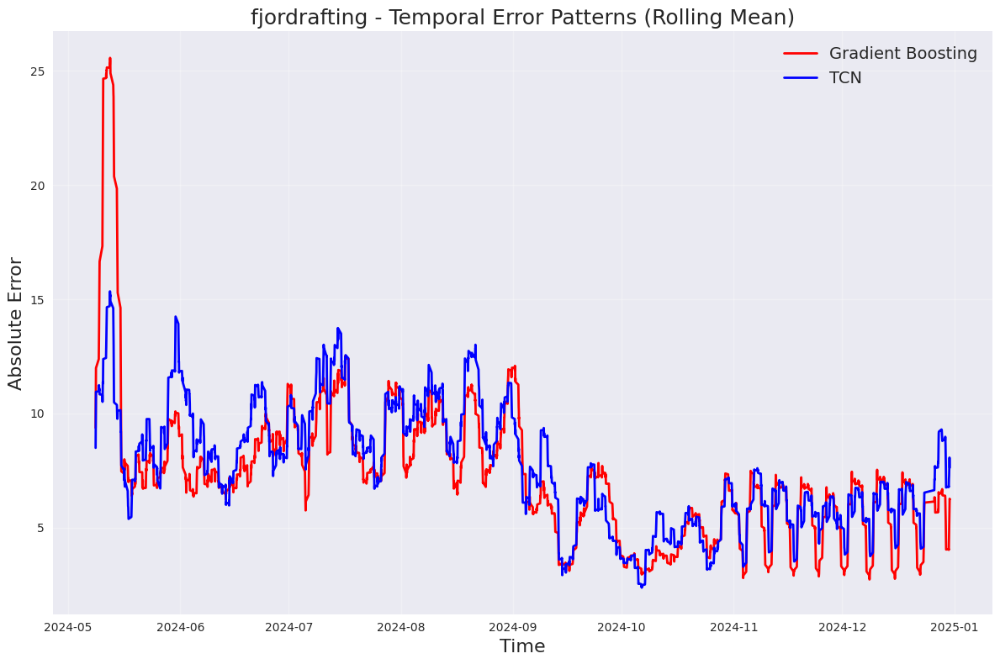

Plot saved as: visualizations/temporal_analysis_volo_da_vinci.svg


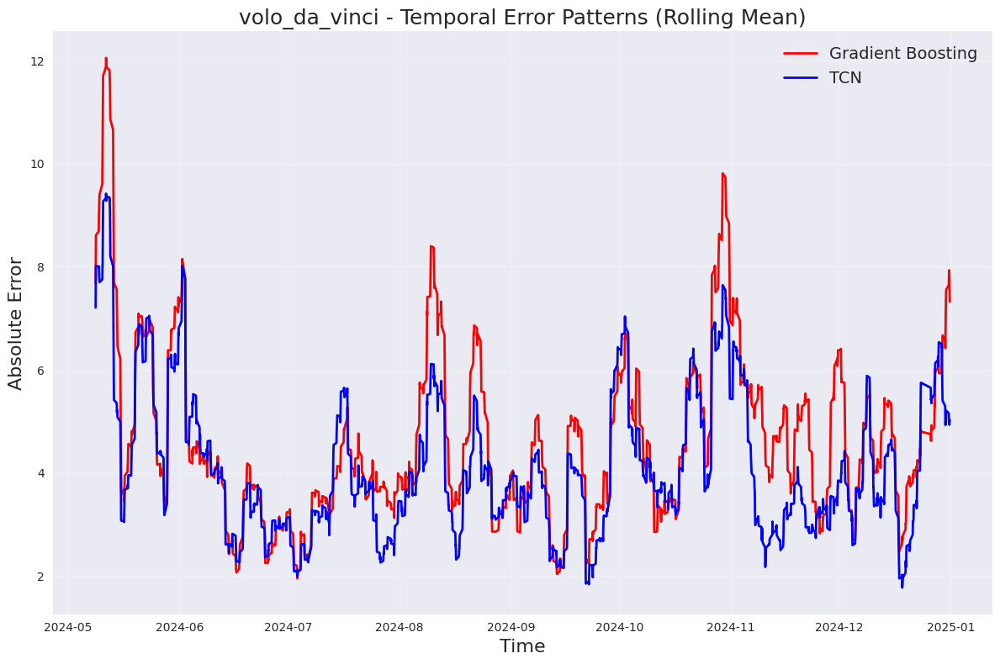

Plot saved as: visualizations/temporal_analysis_jim_button__journey_through_morrowland.svg


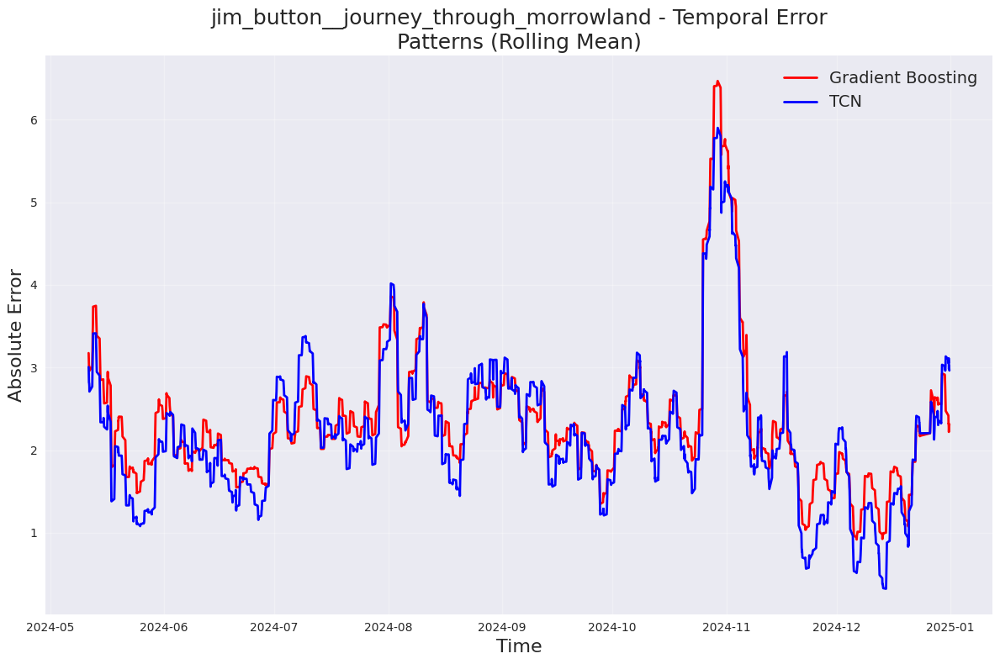

Plot saved as: visualizations/temporal_analysis_josefinas_magical_imperial_journey.svg


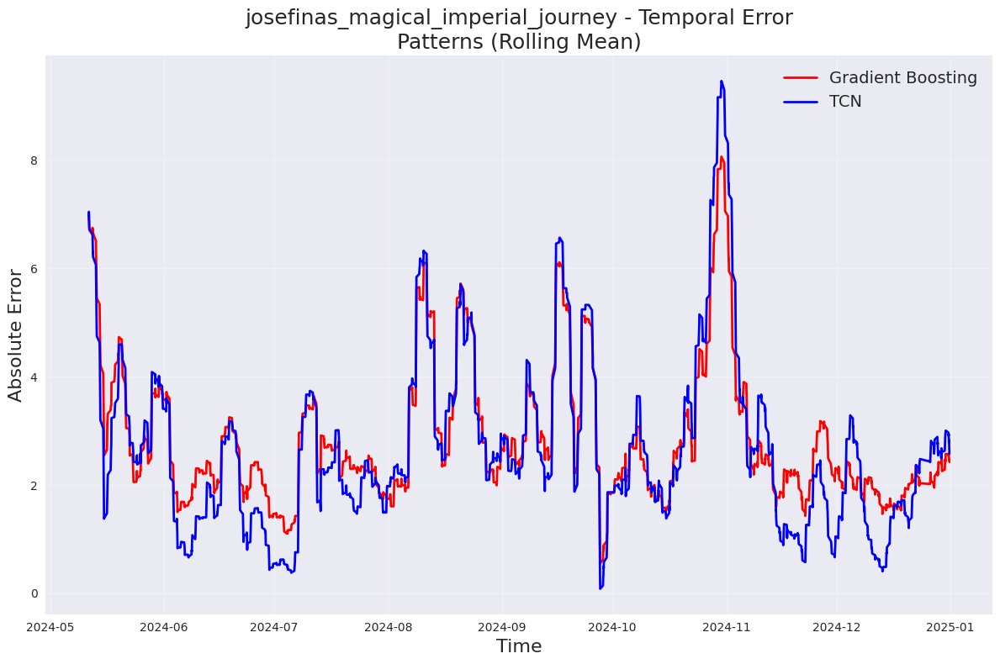

Plot saved as: visualizations/temporal_analysis_whale_adventures__northern_lights.svg


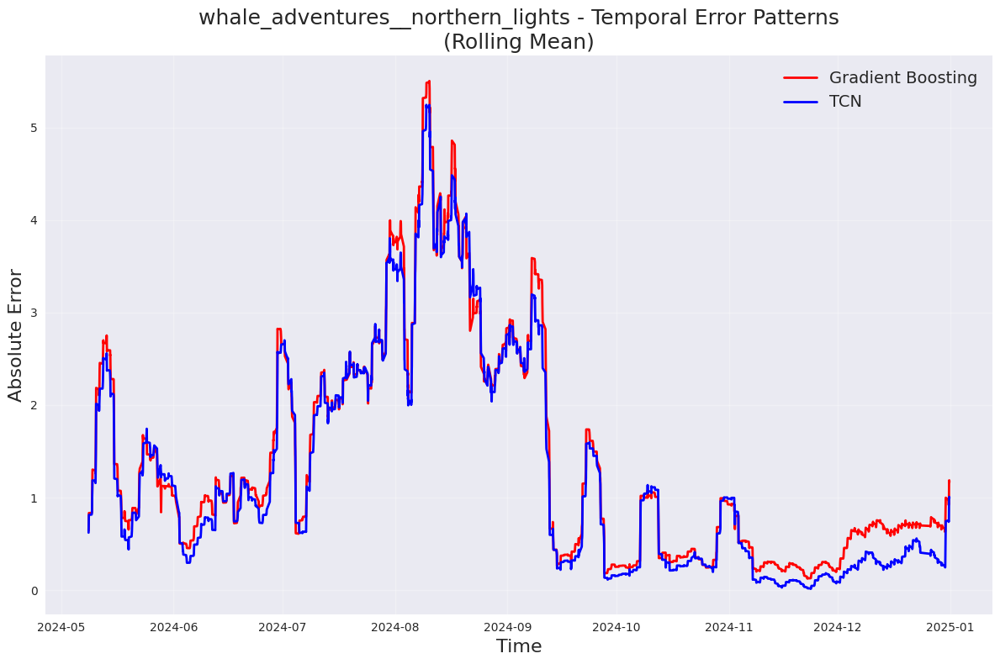

Plot saved as: visualizations/temporal_analysis_kolumbusjolle.svg


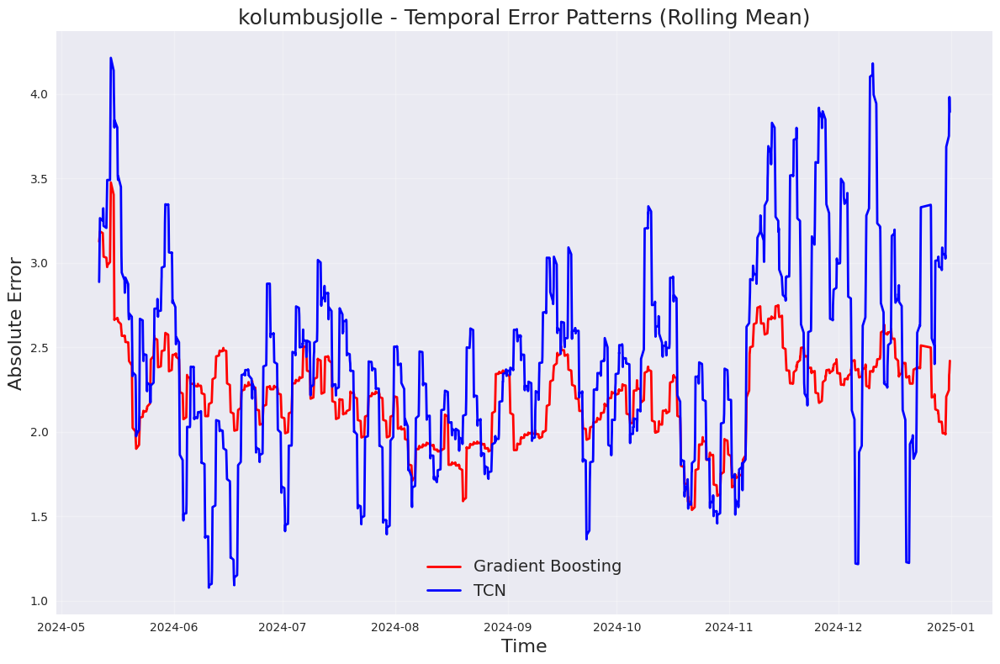

Plot saved as: visualizations/temporal_analysis_overall.svg


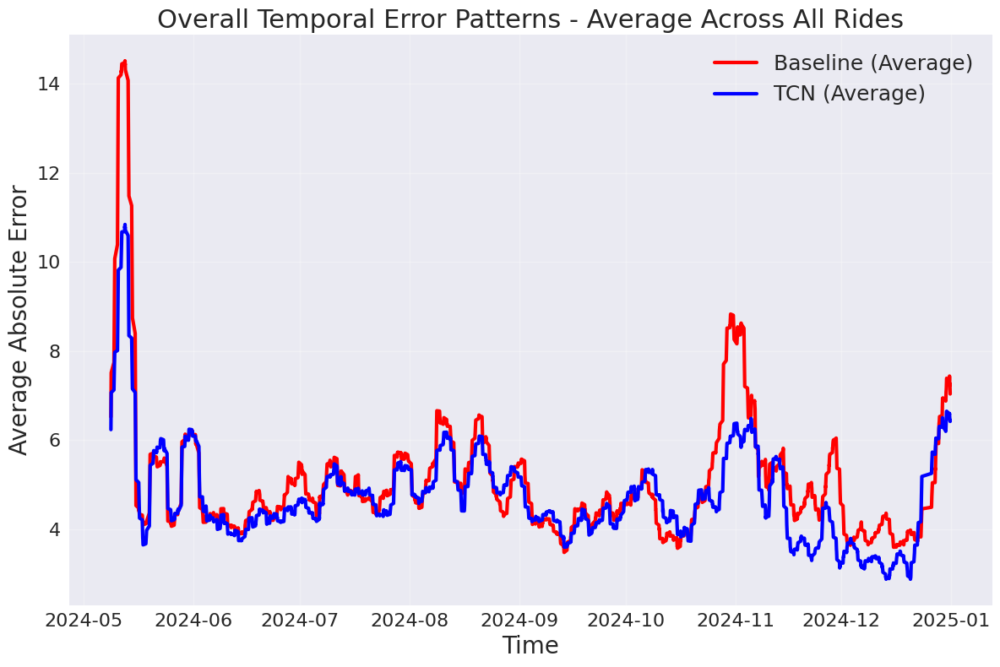

Overall plot includes data from 30 rides

9. Error by Wait Time Bins:
Plot saved as: visualizations/error_by_wait_time_bins.svg


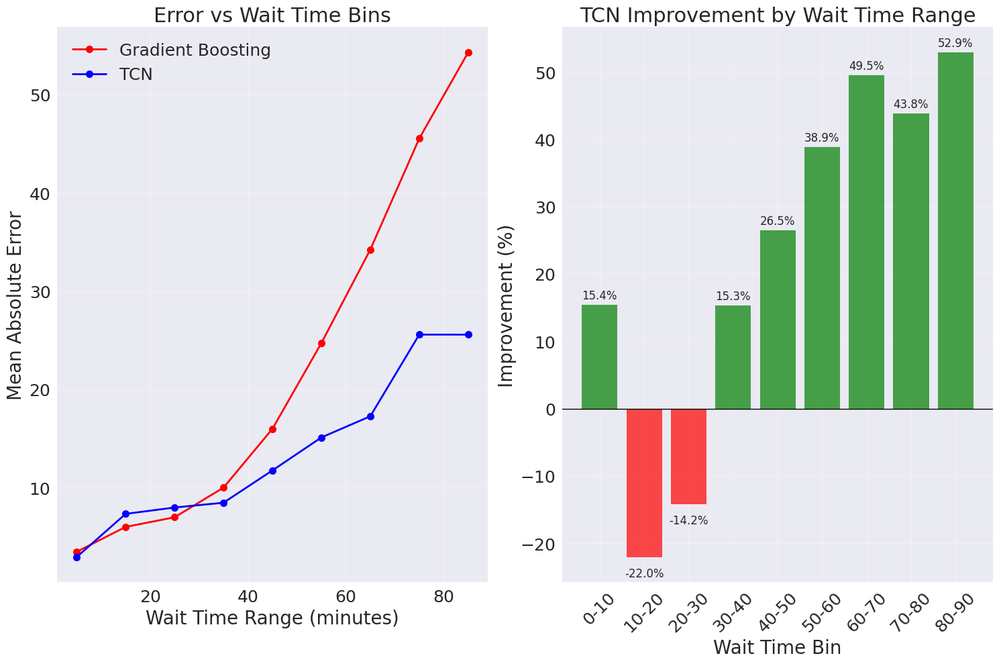


10. Temporal Analysis by Periods (Days/Weeks):
Plot saved as: visualizations/daily_analysis.svg


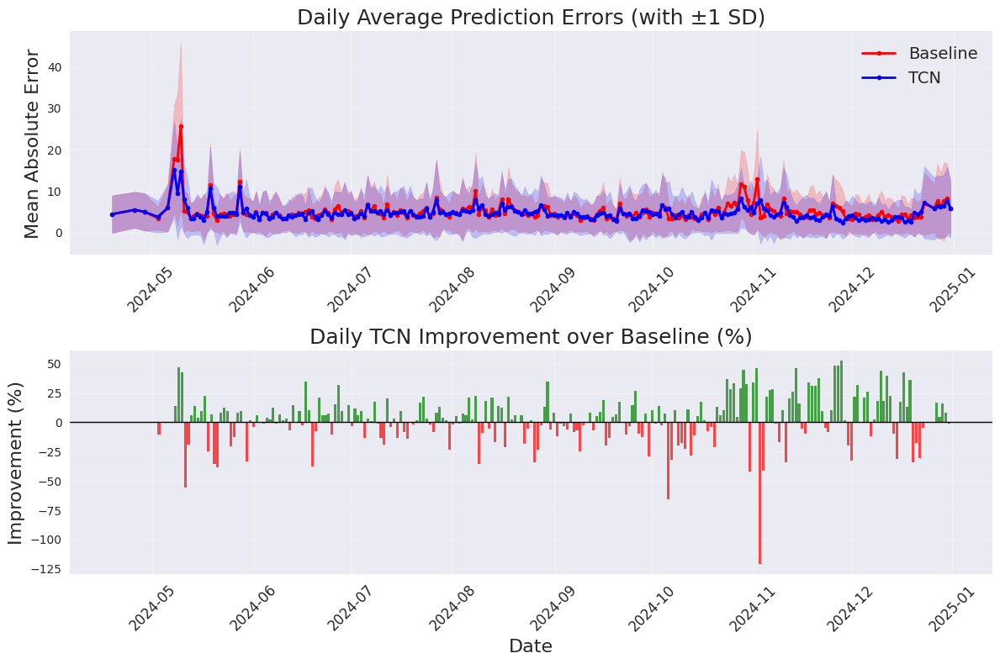

Plot saved as: visualizations/weekly_analysis.svg


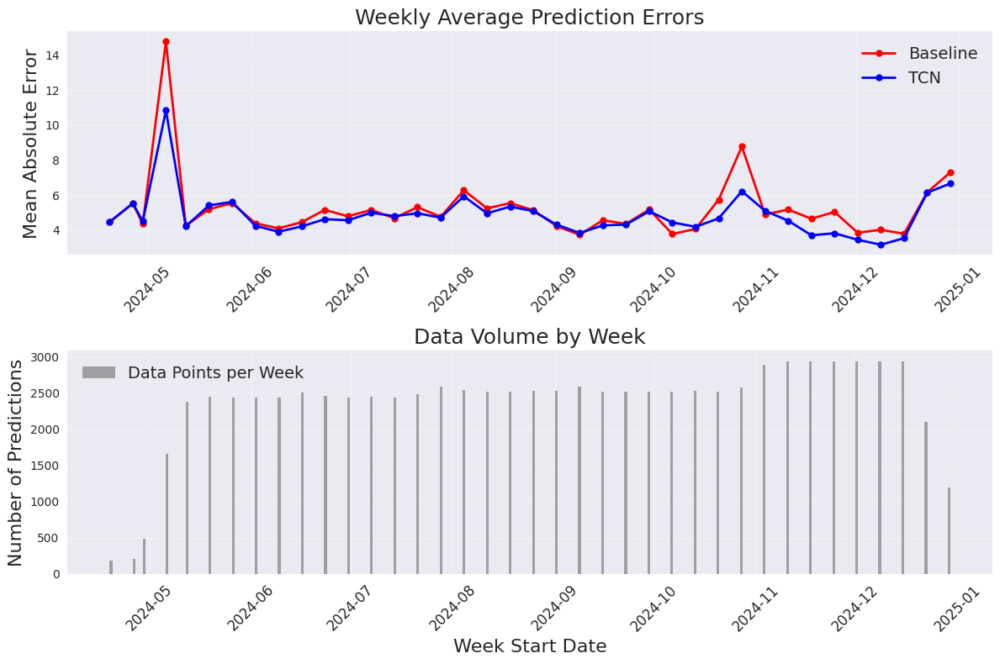

Plot saved as: visualizations/hourly_analysis.svg


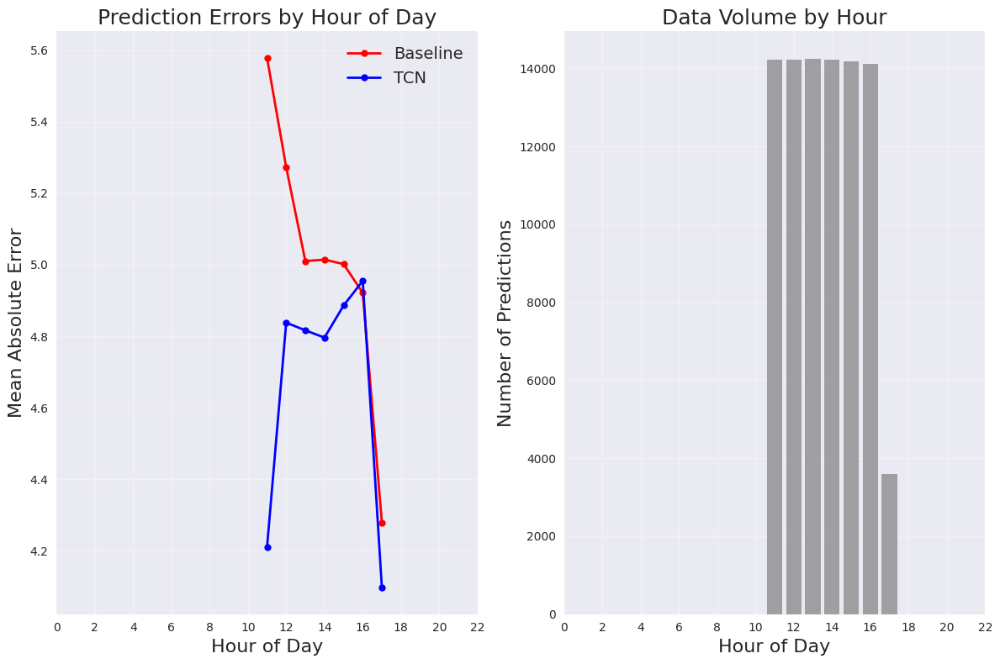

Plot saved as: visualizations/day_of_week_analysis.svg


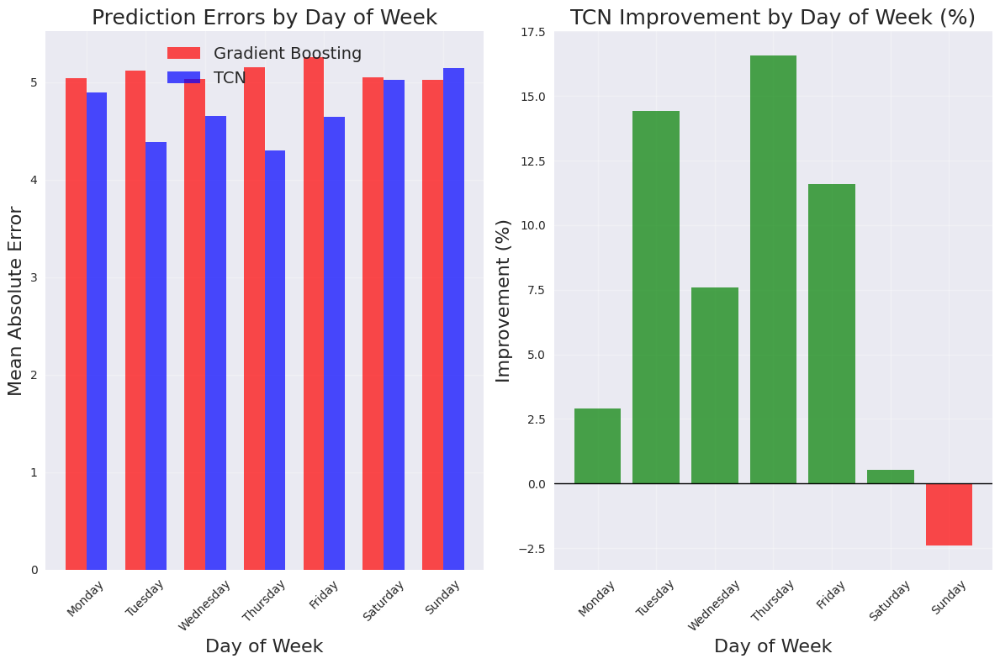


11. Daily Predictions Sample:
Plot saved as: visualizations/daily_predictions_alpine_express_enzian_2024_06_15.svg


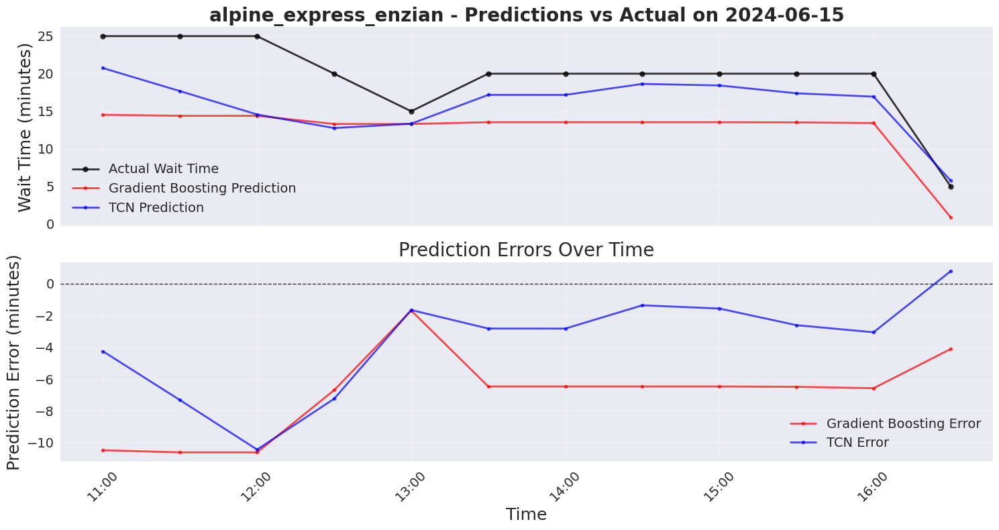


Summary for alpine_express_enzian on 2024-06-15:
Total predictions: 12
Time range: 11:00 - 16:30
Actual wait time range: 5.0 - 25.0 minutes
Gradient Boosting MAE: 6.92 minutes
TCN MAE: 3.83 minutes
TCN improvement: 44.7%

All plots saved as SVG files in: visualizations/

REPORT GENERATION COMPLETE!


In [36]:
visualizer = ModelVisualizer(evaluator)
if visualizer:
    visualizer.create_comprehensive_report()